**Ran the jupyter notebook in Google Colab**

# 1. IMPORTING LIBRARIES

Here, we shall import all the required libraries to perform operations for data 

In [0]:
import numpy as np
import pandas as pd
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(color_codes=True)
import warnings
warnings.filterwarnings("ignore")
from sklearn import preprocessing
from sklearn import metrics
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn import preprocessing
from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import classification_report
from sklearn import svm
from sklearn.utils import resample
from sklearn.metrics import roc_auc_score
from sklearn.metrics import auc
from sklearn.model_selection import GridSearchCV
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO  
from IPython.display import Image  
import pydotplus
import graphviz


# 2. Reading DAta

We read the csv file given into a dataframe

In [0]:
data=pd.read_csv('/content/bank-full.csv')

In [0]:
print('The shape of the data is',data.shape)

The shape of the data is (45211, 17)


# 3. EXPLORATORY DATA ANALYSIS

In [0]:
data.columns

Index(['age', 'job', 'marital', 'education', 'default', 'balance', 'housing',
       'loan', 'contact', 'day', 'month', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'Target'],
      dtype='object')

In [0]:
print('the data type of each attribute is : ')
print(" "*50)
data.info()

the data type of each attribute is : 
                                                  
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
age          45211 non-null int64
job          45211 non-null object
marital      45211 non-null object
education    45211 non-null object
default      45211 non-null object
balance      45211 non-null int64
housing      45211 non-null object
loan         45211 non-null object
contact      45211 non-null object
day          45211 non-null int64
month        45211 non-null object
duration     45211 non-null int64
campaign     45211 non-null int64
pdays        45211 non-null int64
previous     45211 non-null int64
poutcome     45211 non-null object
Target       45211 non-null object
dtypes: int64(7), object(10)
memory usage: 5.9+ MB


# 3.1 Checking the presence of missing values

In [0]:
data.isnull().sum()

age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
Target       0
dtype: int64

In [0]:
null=data[data.isnull().any(1)]
print(null)

Empty DataFrame
Columns: [age, job, marital, education, default, balance, housing, loan, contact, day, month, duration, campaign, pdays, previous, poutcome, Target]
Index: []


# 3.2 5-POINT SUMMARY 

In [0]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
age,45211.0,40.936210,10.618762,18.0,33.0,39.0,48.0,95.0
balance,45211.0,1362.272058,3044.765829,-8019.0,72.0,448.0,1428.0,102127.0
day,45211.0,15.806419,8.322476,1.0,8.0,16.0,21.0,31.0
duration,45211.0,258.163080,257.527812,0.0,103.0,180.0,319.0,4918.0
campaign,45211.0,2.763841,3.098021,1.0,1.0,2.0,3.0,63.0
pdays,45211.0,40.197828,100.128746,-1.0,-1.0,-1.0,-1.0,871.0
previous,45211.0,0.580323,2.303441,0.0,0.0,0.0,0.0,275.0


In [0]:
data.head(10)

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no
5,35,management,married,tertiary,no,231,yes,no,unknown,5,may,139,1,-1,0,unknown,no
6,28,management,single,tertiary,no,447,yes,yes,unknown,5,may,217,1,-1,0,unknown,no
7,42,entrepreneur,divorced,tertiary,yes,2,yes,no,unknown,5,may,380,1,-1,0,unknown,no
8,58,retired,married,primary,no,121,yes,no,unknown,5,may,50,1,-1,0,unknown,no
9,43,technician,single,secondary,no,593,yes,no,unknown,5,may,55,1,-1,0,unknown,no


## 3.3 UNDERSTANDING THE ATTRIBUTES OF DATA 

# 3.3.0 PAIR PLOT

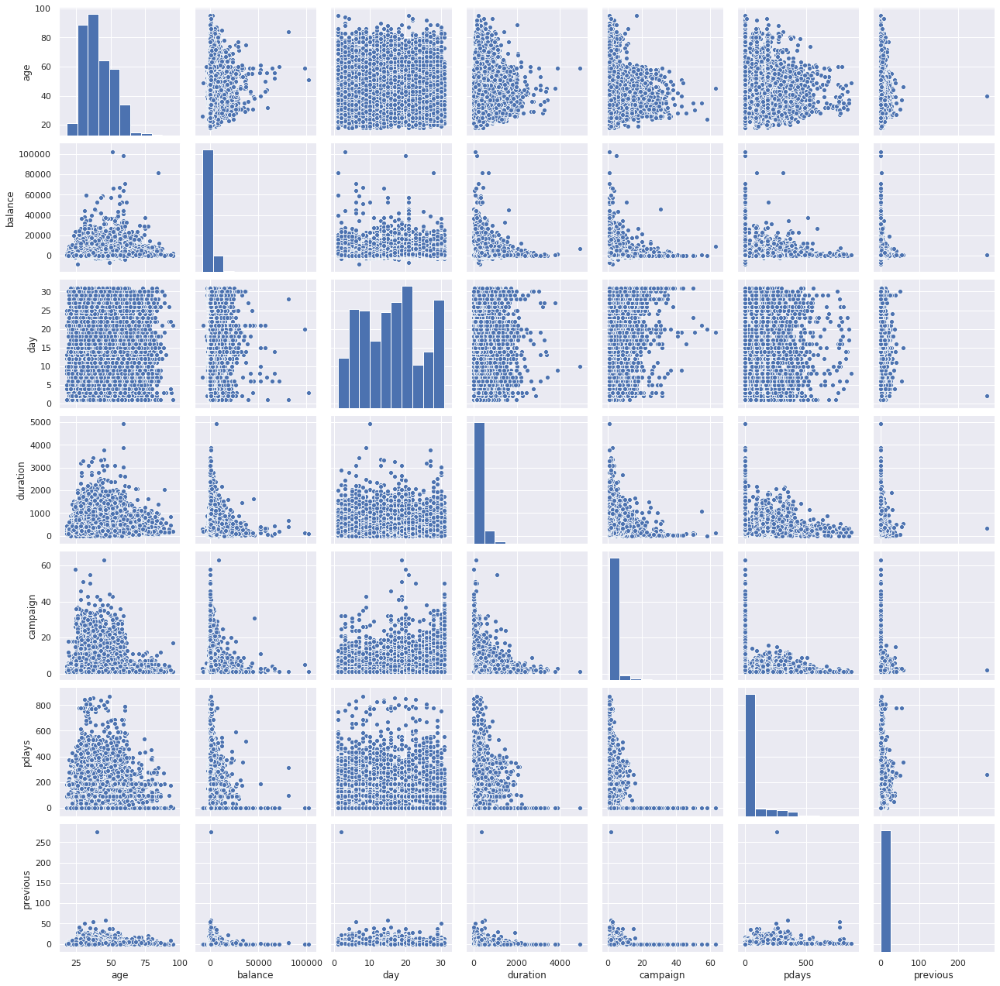

In [0]:
sns.pairplot(data)

Observation: As we can see, there is no linear relationship between any two attributes in the paiplot above

# 3.3.1 AGE

This column is about the age of customer

In [0]:
print("The 5 point summary of age column would give the below results: ")
data['age'].describe().T

The 5 point summary of age column would give the below results: 


count    45211.000000
mean        40.936210
std         10.618762
min         18.000000
25%         33.000000
50%         39.000000
75%         48.000000
max         95.000000
Name: age, dtype: float64

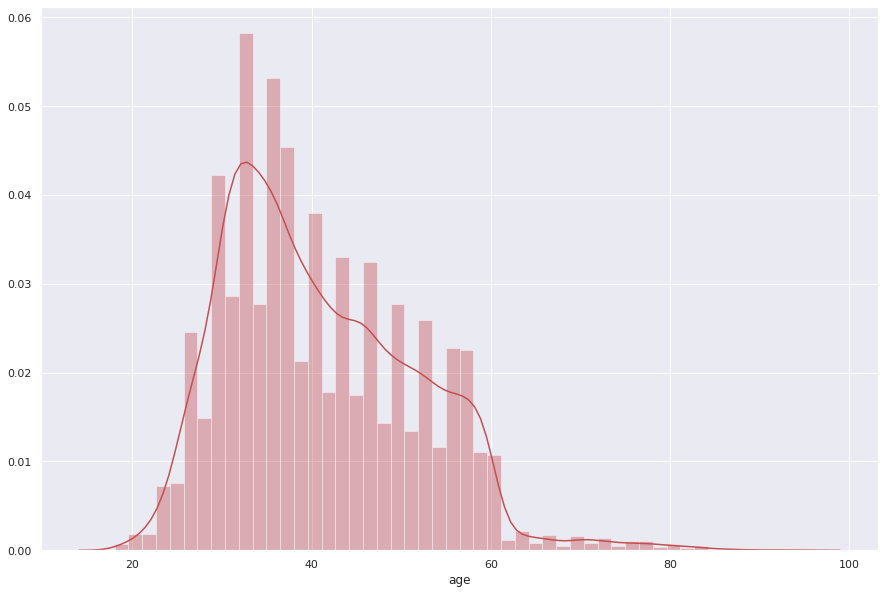

In [0]:
plt.figure(figsize=(15,10))
sns.set_color_codes()
ax = sns.distplot(data['age'], color="r")

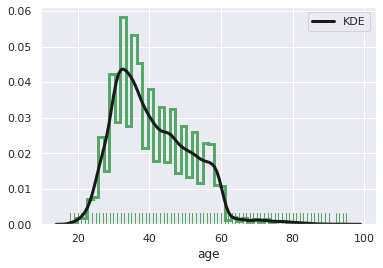

In [0]:
ax = sns.distplot(data['age'], rug=True, rug_kws={"color": "g"},
                  kde_kws={"color": "k", "lw": 3, "label": "KDE"},
                  hist_kws={"histtype": "step", "linewidth": 3,
                            "alpha": 1, "color": "g"})

Observation : From the above two plots ( dstplot and kde plot), we can say that the age is approximately normally distributed

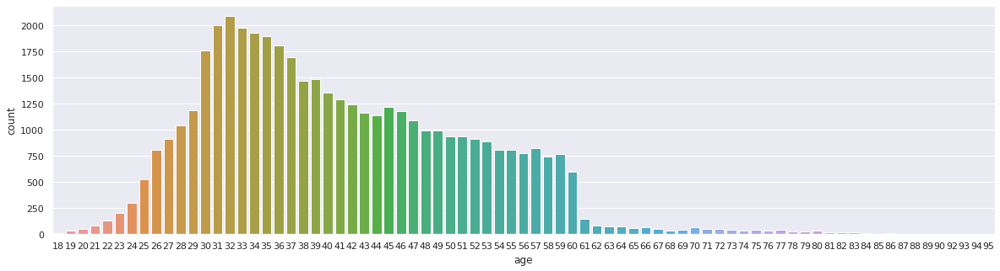

In [0]:
plt.figure(figsize=(20,5))
sns.countplot(data['age'])

Looking for outliers in age column

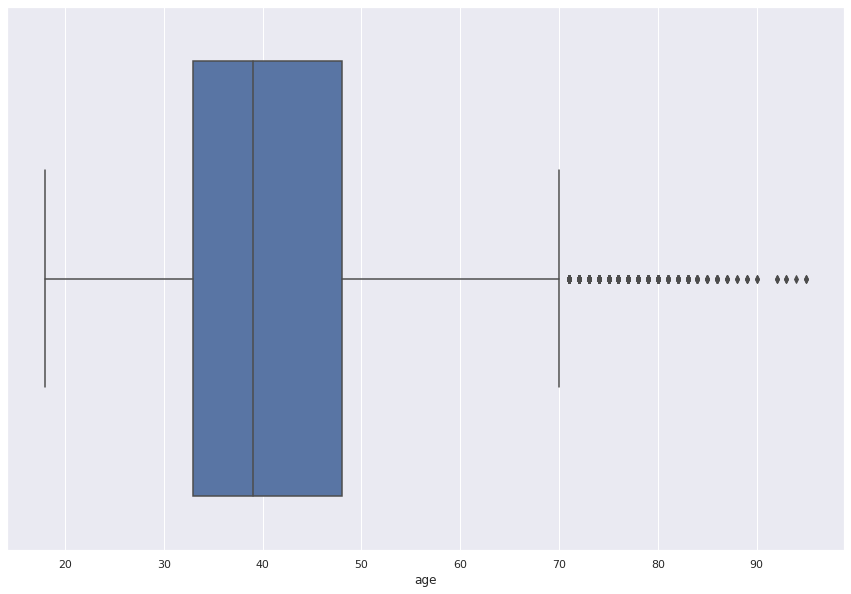

In [0]:
plt.figure(figsize=(15,10))
sns.boxplot(data['age'])

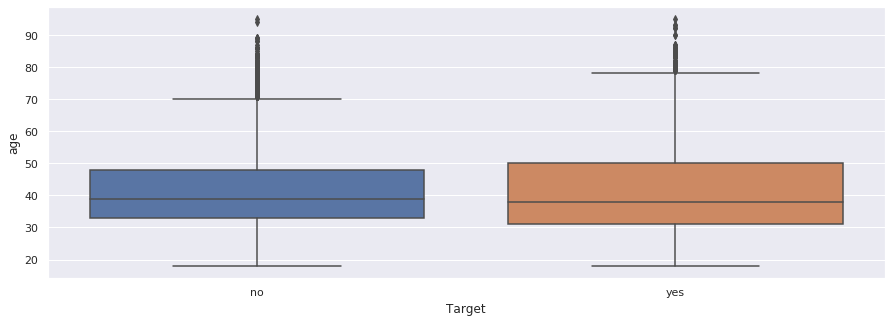

In [0]:
plt.figure(figsize=(15,5))
sns.boxplot(y=data['age'],x=data['Target'])

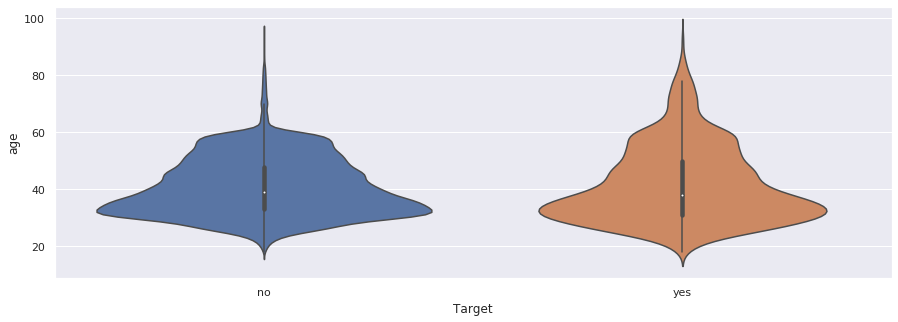

In [0]:
plt.figure(figsize=(15,5))
sns.violinplot(y=data['age'],x=data['Target'])

Observation : Even though there are outliers in age column, they cannot be ignored because many of the aged clients may subscribe to the term deposit

Lets do statistical analysis whether age is related to the client subscribed a term deposit or not.

Question:  Is age related to the client subscriBING a term deposit or not. ?

In [0]:
print("Individual count of age column: "," "*500, data['age'].value_counts())

Individual count of age column:                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                       32    2085
31    1996
33    1972
34    1930
35    1894
      ... 
90       2
92       2
93       2
95       2
94       1
Name: age, Length: 77, dtype: int64


NULL HYPOTHESIS(H0): Age is not related to the client subscribing a term deposit

ALTERNATIVE HYPOTHESIS(Ha): Age is related to the client subscribing a term deposit

In [0]:
# Level of significance = 0.05

In [0]:
null = 'Age is not related to the client subscribing a term deposit'
alternate = 'Age is related to the client subscribing a term deposit'
a=np.array(data[data['Target']=='yes'].age)
b=np.array(data[data['Target']=='no'].age)
t_stat, p_value = stats.ttest_ind(a,b,axis=0)
print("the caluclated value of tstatistic is",t_stat)
print("The pvalue is",p_value)
print(""*1000)
print("Based on the statistical evidence")
if p_value > 0.05:
    print("we fail to reject null hypothesis as the p_value", p_value, "is greater than 0.05")
    print(null)
else:
    print("we reject null hypothesis as the p_value", p_value, "is less than 0.05")
    print(alternate)

the caluclated value of tstatistic is 5.350255423036203
The pvalue is 8.825643691922395e-08

Based on the statistical evidence
we reject null hypothesis as the p_value 8.825643691922395e-08 is less than 0.05
Age is related to the client subscribing a term deposit


# 3.3.2 Job

This column is about the type of job of the client or customer

In [0]:
print("Different jobs been done by customers:", '\n',data['job'].unique())

Different jobs been done by customers: 
 ['management' 'technician' 'entrepreneur' 'blue-collar' 'unknown'
 'retired' 'admin.' 'services' 'self-employed' 'unemployed' 'housemaid'
 'student']


In [0]:
print("Individual count of job column: ")
data['job'].value_counts()

Individual count of job column: 


blue-collar      9732
management       9458
technician       7597
admin.           5171
services         4154
retired          2264
self-employed    1579
entrepreneur     1487
unemployed       1303
housemaid        1240
student           938
unknown           288
Name: job, dtype: int64

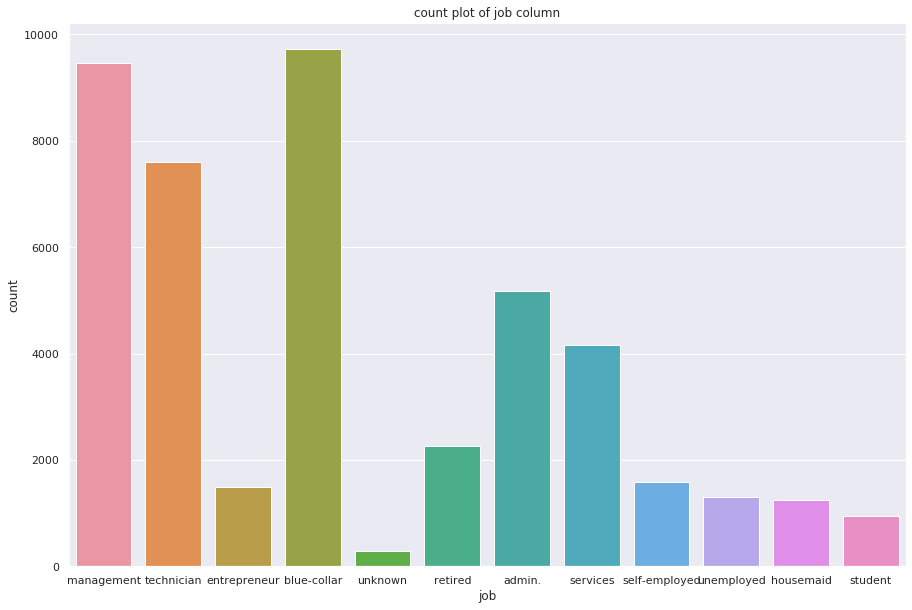

In [0]:
plt.figure(figsize=(15,10))
plt.title("count plot of job column")
sns.countplot(data['job'])

In [0]:
print("Individual count of job column who subscribed to term deposit: ")
data[data['Target']=='yes'].job.value_counts()

Individual count of job column who subscribed to term deposit: 


management       1301
technician        840
blue-collar       708
admin.            631
retired           516
services          369
student           269
unemployed        202
self-employed     187
entrepreneur      123
housemaid         109
unknown            34
Name: job, dtype: int64

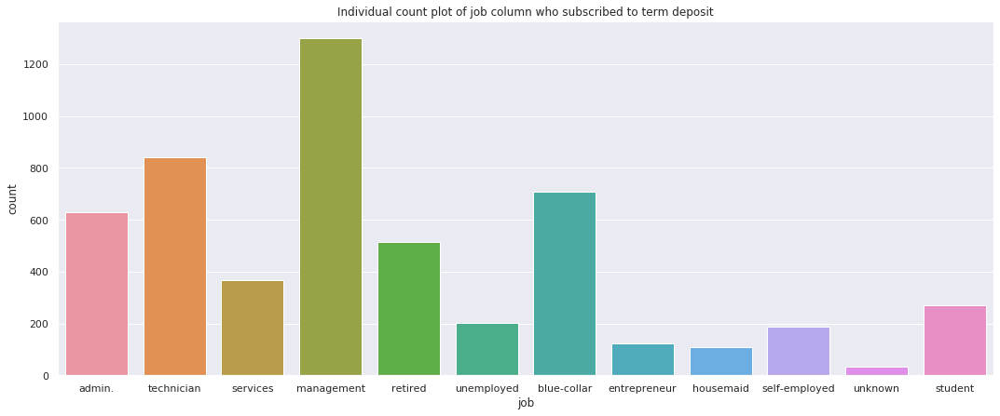

In [0]:
plt.figure(figsize=(18,7))
plt.title("Individual count plot of job column who subscribed to term deposit")
sns.countplot(data[data['Target']=='yes'].job)

Observation: Among those who subscribed to term deposit, management related job holders are the highest followed by technician

In [0]:
print("Individual count of job column who did not subscribed to term deposit: ")
data[data['Target']=='no'].job.value_counts()

Individual count of job column who did not subscribed to term deposit: 


blue-collar      9024
management       8157
technician       6757
admin.           4540
services         3785
retired          1748
self-employed    1392
entrepreneur     1364
housemaid        1131
unemployed       1101
student           669
unknown           254
Name: job, dtype: int64

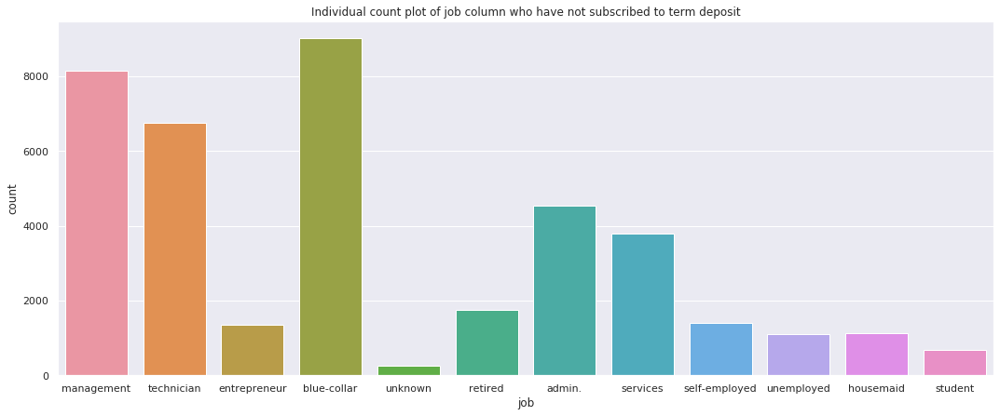

In [0]:
plt.figure(figsize=(18,7))
plt.title("Individual count plot of job column who have not subscribed to term deposit")
sns.countplot(data[data['Target']=='no'].job)

Observation: Among those who did not subscribed to term deposit, blue collar related job holders are the highest followed by management and technician

Lets do statistical analysis whether type of job is related to the client subscribed a term deposit or not.

Question:  Is type of job related to the client subscriBING a term deposit or not. ?

NULL HYPOTHESIS(H0): Type of Job is not related to the client subscribing a term deposit

ALTERNATIVE HYPOTHESIS(Ha): Type of job is related to the client subscribing a term deposit

In [0]:
# Level of significance = 0.05

In [0]:
import numpy as np
import pandas as pd
s = pd.crosstab(data.job, data.Target, margins = False)
print(s)

Target           no   yes
job                      
admin.         4540   631
blue-collar    9024   708
entrepreneur   1364   123
housemaid      1131   109
management     8157  1301
retired        1748   516
self-employed  1392   187
services       3785   369
student         669   269
technician     6757   840
unemployed     1101   202
unknown         254    34


In [0]:
# chi-squared test with similar proportions
from scipy.stats import chi2_contingency
from scipy.stats import chi2
# contingency table
table = s
print("Contingency table:")
print(table)
stat, p, dof, expected = chi2_contingency(table)
print('dof=%d' % dof)
print("Note : dof = (rows-1)*(cols-1)  = (12-1)*(2-1)")
print(expected)

Contingency table:
Target           no   yes
job                      
admin.         4540   631
blue-collar    9024   708
entrepreneur   1364   123
housemaid      1131   109
management     8157  1301
retired        1748   516
self-employed  1392   187
services       3785   369
student         669   269
technician     6757   840
unemployed     1101   202
unknown         254    34
dof=11
Note : dof = (rows-1)*(cols-1)  = (12-1)*(2-1)
[[4566.0715755   604.9284245 ]
 [8593.5038818  1138.4961182 ]
 [1313.04359559  173.95640441]
 [1094.93884232  145.06115768]
 [8351.55771825 1106.44228175]
 [1999.14640242  264.85359758]
 [1394.28099356  184.71900644]
 [3668.04512176  485.95487824]
 [ 828.2682533   109.7317467 ]
 [6708.26643958  888.73356042]
 [1150.56879963  152.43120037]
 [ 254.30837628   33.69162372]]


In [0]:
# interpret test-statistic
null = 'Type of job is not related to the client subscribing a term deposit'
alternate = 'Type of job is related to the client subscribing a term deposit'
prob = 0.95
critical = chi2.ppf(prob, dof)
print('probability=%.3f, critical=%.3f, stat=%.3f' % (prob, critical, stat))
if abs(stat) >= critical:
    print('Dependent (reject H0)')
    print(alternate)
else:
    print('Independent (fail to reject H0)')
    print(null)

probability=0.950, critical=19.675, stat=836.105
Dependent (reject H0)
Type of job is related to the client subscribing a term deposit


In [0]:
# interpret p-value
alpha = 1.0 - prob
print('significance=%.3f, p=%.3f' % (alpha, p))
if p <= alpha:
    print('Dependent (reject H0)')
    print(alternate)
else:
    print('Independent (fail to reject H0)')
    print(null)

significance=0.050, p=0.000
Dependent (reject H0)
Type of job is related to the client subscribing a term deposit


# 3.3.3 Marital

This column states the marital status of the client

In [0]:
print("Marital status in the dataset:", '\n',data['marital'].unique())

Marital status in the dataset: 
 ['married' 'single' 'divorced']


In [0]:
print("Individual count of marital column: ", data['marital'].value_counts())

Individual count of marital column:  married     27214
single      12790
divorced     5207
Name: marital, dtype: int64


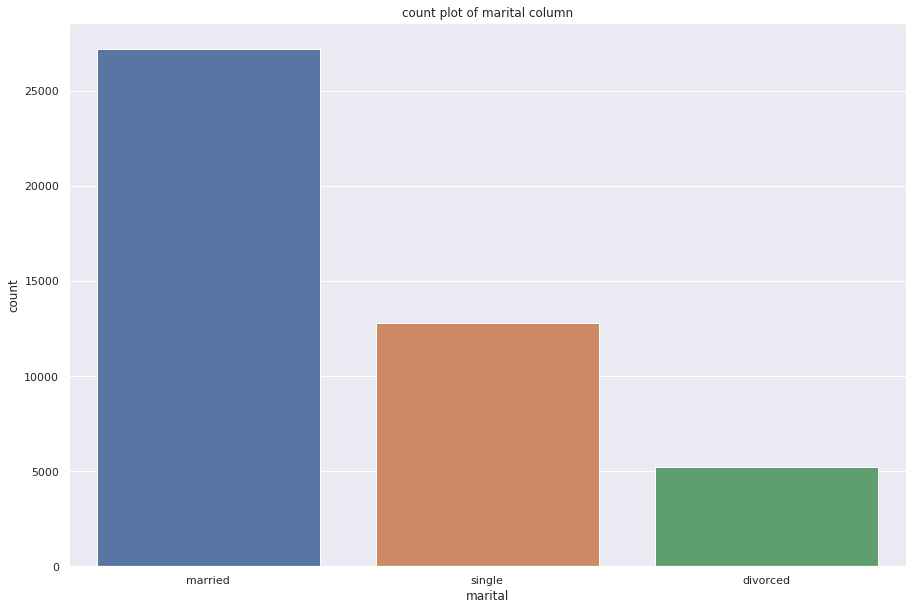

In [0]:
plt.figure(figsize=(15,10))
plt.title("count plot of marital column")
sns.countplot(data['marital'])

In [0]:
print("Individual count of marital column who subscribed to term deposit: "," "*10, data[data['Target']=='yes'].marital.value_counts())

Individual count of marital column who subscribed to term deposit:             married     2755
single      1912
divorced     622
Name: marital, dtype: int64


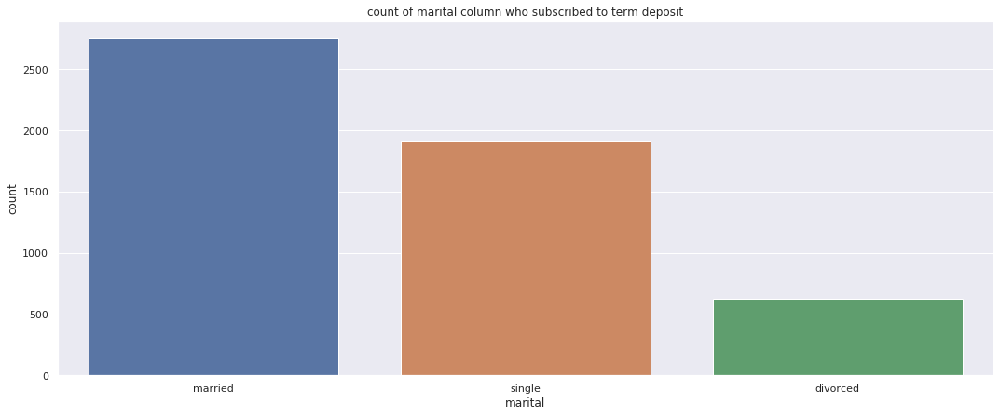

In [0]:
plt.figure(figsize=(18,7))
plt.title("count of marital column who subscribed to term deposit")
sns.countplot(data[data['Target']=='yes'].marital)

In [0]:
print("Individual count of marital column who did not subscribed to term deposit: ")
data[data['Target']=='no'].marital.value_counts()

Individual count of marital column who did not subscribed to term deposit: 


married     24459
single      10878
divorced     4585
Name: marital, dtype: int64

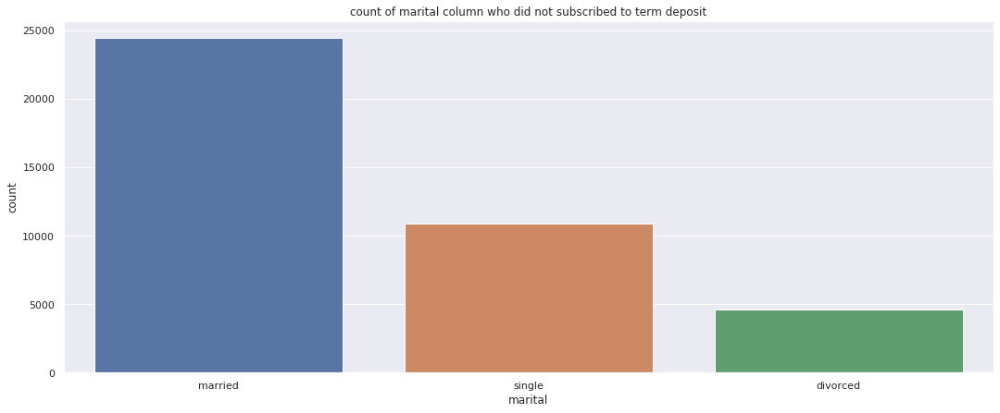

In [0]:
plt.figure(figsize=(18,7))
plt.title("count of marital column who did not subscribed to term deposit")
sns.countplot(data[data['Target']=='no'].marital)

Observation:
* Married status has the highest count for both varieties of target client

Lets do statistical analysis whether type of marital status is related to the client subscribed a term deposit or not.

Question:  Is marital status related to the client subscriBING a term deposit or not. ?

NULL HYPOTHESIS(H0): Marital status is not related to the client subscribing a term deposit

ALTERNATIVE HYPOTHESIS(Ha): Marital status is related to the client subscribing a term deposit

In [0]:
# Level of significance = 0.05

In [0]:
import numpy as np
import pandas as pd
s = pd.crosstab(data.marital, data.Target, margins = False)
print(s)

Target       no   yes
marital              
divorced   4585   622
married   24459  2755
single    10878  1912


In [0]:
# chi-squared test with similar proportions
from scipy.stats import chi2_contingency
from scipy.stats import chi2
# contingency table
table = s
print("Contingency table:")
print(table)
stat, p, dof, expected = chi2_contingency(table)
print('dof=%d' % dof)
print("Note : dof = (rows-1)*(cols-1)  = (3-1)*(2-1)")
print(expected)

Contingency table:
Target       no   yes
marital              
divorced   4585   622
married   24459  2755
single    10878  1912
dof=2
Note : dof = (rows-1)*(cols-1)  = (3-1)*(2-1)
[[ 4597.86012254   609.13987746]
 [24030.37552808  3183.62447192]
 [11293.76434938  1496.23565062]]


In [0]:
# interpret test-statistic
null = 'Marital status is not related to the client subscribing a term deposit'
alternate = 'Marital status is related to the client subscribing a term deposit'
prob = 0.95
critical = chi2.ppf(prob, dof)
print('probability=%.3f, critical=%.3f, stat=%.3f' % (prob, critical, stat))
if abs(stat) >= critical:
    print('Dependent (reject H0)')
    print(alternate)
else:
    print('Independent (fail to reject H0)')
    print(null)

probability=0.950, critical=5.991, stat=196.496
Dependent (reject H0)
Marital status is related to the client subscribing a term deposit


In [0]:
# interpret p-value
alpha = 1.0 - prob
print('significance=%.3f, p=%.3f' % (alpha, p))
if p <= alpha:
    print('Dependent (reject H0)')
    print(alternate)
else:
    print('Independent (fail to reject H0)')
    print(null)

significance=0.050, p=0.000
Dependent (reject H0)
Marital status is related to the client subscribing a term deposit


# 3.3.4 Education

This column states the education level of the client

In [0]:
print("Education did by customers:", '\n',data['education'].unique())

Education did by customers: 
 ['tertiary' 'secondary' 'unknown' 'primary']


In [0]:
print("Individual count of education column: "," "*5, data['education'].value_counts())

Individual count of education column:        secondary    23202
tertiary     13301
primary       6851
unknown       1857
Name: education, dtype: int64


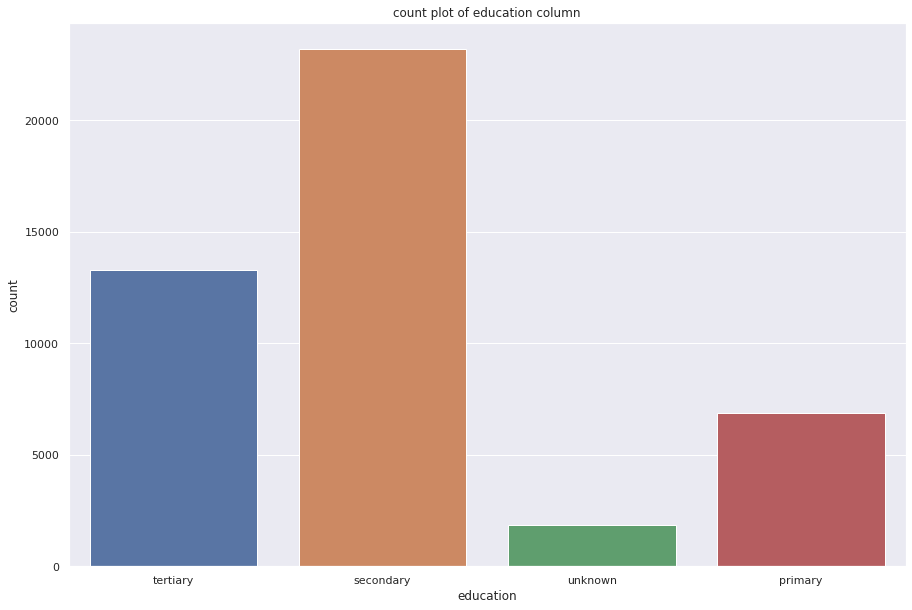

In [0]:
plt.figure(figsize=(15,10))
plt.title("count plot of education column")
sns.countplot(data['education'])

In [0]:
print("Individual count of Education column who subscribed to term deposit: "," "*5, data[data['Target']=='yes'].education.value_counts())

Individual count of Education column who subscribed to term deposit:        secondary    2450
tertiary     1996
primary       591
unknown       252
Name: education, dtype: int64


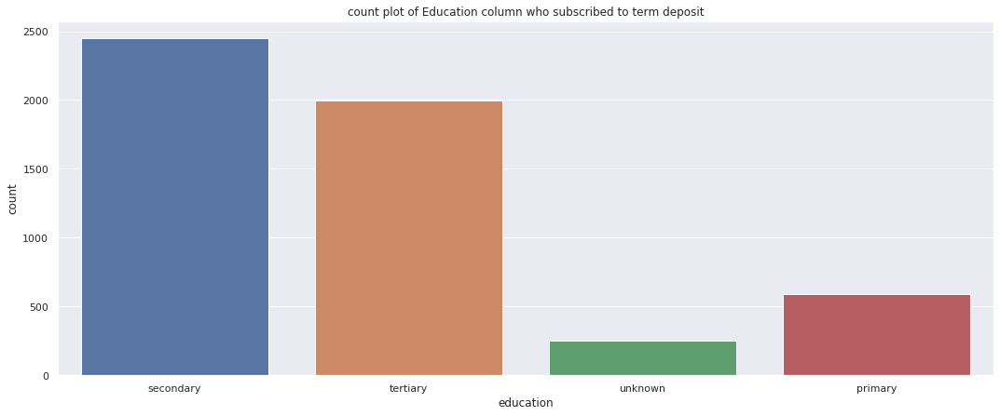

In [0]:
plt.figure(figsize=(18,7))
plt.title("count plot of Education column who subscribed to term deposit")
sns.countplot(data[data['Target']=='yes'].education)

In [0]:
print("Individual count of education column who did not subscribed to term deposit: "," "*4, data[data['Target']=='no'].education.value_counts())

Individual count of education column who did not subscribed to term deposit:       secondary    20752
tertiary     11305
primary       6260
unknown       1605
Name: education, dtype: int64


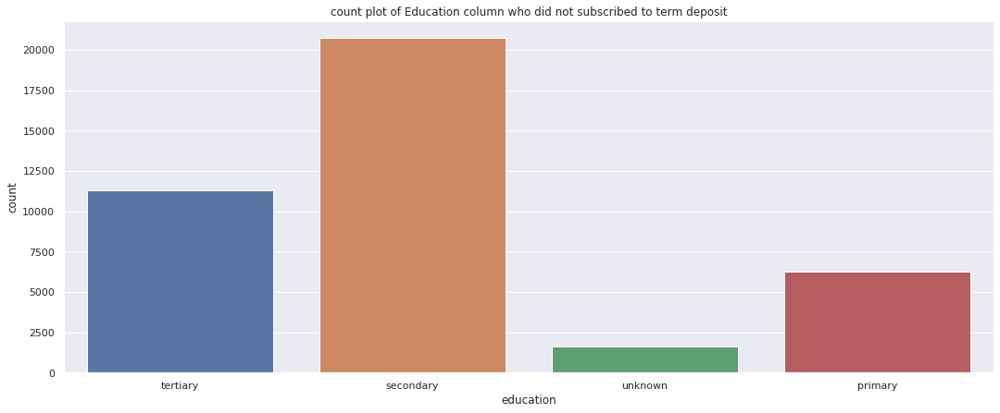

In [0]:
plt.figure(figsize=(18,7))
plt.title("count plot of Education column who did not subscribed to term deposit")
sns.countplot(data[data['Target']=='no'].education)

Observation:
* Married status has the highest count for both varieties of target client

Lets do statistical analysis whether type of education is related to the client subscribed a term deposit or not.

Question:  Is level of education related to the client subscriBING a term deposit or not. ?

NULL HYPOTHESIS(H0): level of education is not related to the client subscribing a term deposit

ALTERNATIVE HYPOTHESIS(Ha): level of education is related to the client subscribing a term deposit

In [0]:
# Level of significance = 0.05

In [0]:
import numpy as np
import pandas as pd
s = pd.crosstab(data.education, data.Target, margins = False)
print(s)

Target        no   yes
education             
primary     6260   591
secondary  20752  2450
tertiary   11305  1996
unknown     1605   252


In [0]:
# chi-squared test with similar proportions
from scipy.stats import chi2_contingency
from scipy.stats import chi2
# contingency table
table = s
print("Contingency table:")
print(table)
stat, p, dof, expected = chi2_contingency(table)
print('dof=%d' % dof)
print("Note : dof = (rows-1)*(cols-1)  = (4-1)*(2-1)")
print(expected)

Contingency table:
Target        no   yes
education             
primary     6260   591
secondary  20752  2450
tertiary   11305  1996
unknown     1605   252
dof=3
Note : dof = (rows-1)*(cols-1)  = (4-1)*(2-1)
[[ 6049.5371038    801.4628962 ]
 [20487.71856407  2714.28143593]
 [11744.98511424  1556.01488576]
 [ 1639.75921789   217.24078211]]


In [0]:
# interpret test-statistic
null = 'level of education is not related to the client subscribing a term deposit'
alternate = 'level of education is related to the client subscribing a term deposit'
prob = 0.95
critical = chi2.ppf(prob, dof)
print('probability=%.3f, critical=%.3f, stat=%.3f' % (prob, critical, stat))
if abs(stat) >= critical:
    print('Dependent (reject H0)')
    print(alternate)
else:
    print('Independent (fail to reject H0)')
    print(null)

probability=0.950, critical=7.815, stat=238.924
Dependent (reject H0)
level of education is related to the client subscribing a term deposit


In [0]:
# interpret p-value
alpha = 1.0 - prob
print('significance=%.3f, p=%.3f' % (alpha, p))
if p <= alpha:
    print('Dependent (reject H0)')
    print(alternate)
else:
    print('Independent (fail to reject H0)')
    print(null)

significance=0.050, p=0.000
Dependent (reject H0)
level of education is related to the client subscribing a term deposit


# 3.3.5 Default

This column tells whether the customer has default in credit or not


In [0]:
print("Unique values of default column:", '\n',data['default'].unique())

Unique values of default column: 
 ['no' 'yes']


In [0]:
print("Individual count of default column: ")
data['default'].value_counts()

Individual count of default column: 


no     44396
yes      815
Name: default, dtype: int64

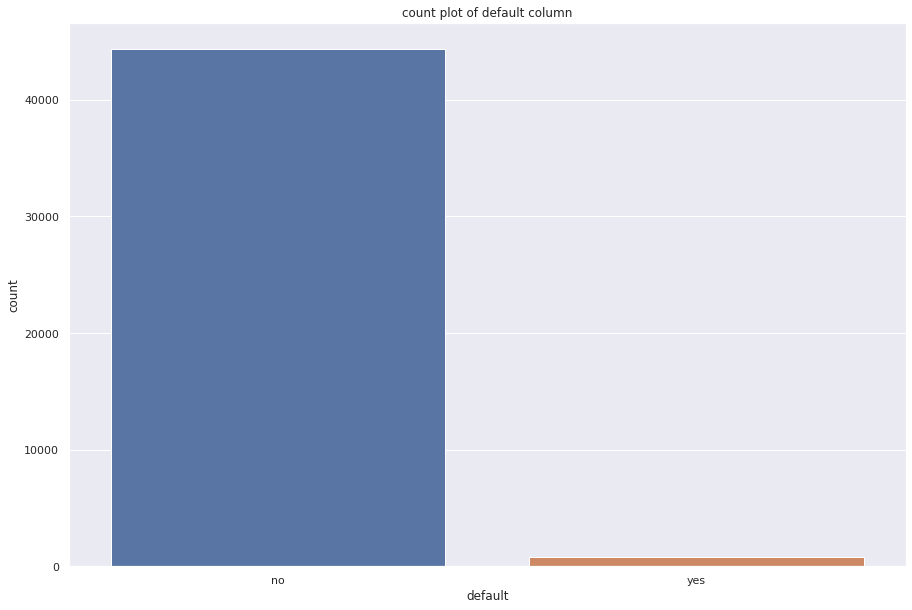

In [0]:
plt.figure(figsize=(15,10))
plt.title("count plot of default column")
sns.countplot(data['default'])

In [0]:
print("Individual count of default column who subscribed to term deposit: ")
data[data['Target']=='yes'].default.value_counts()

Individual count of default column who subscribed to term deposit: 


no     5237
yes      52
Name: default, dtype: int64

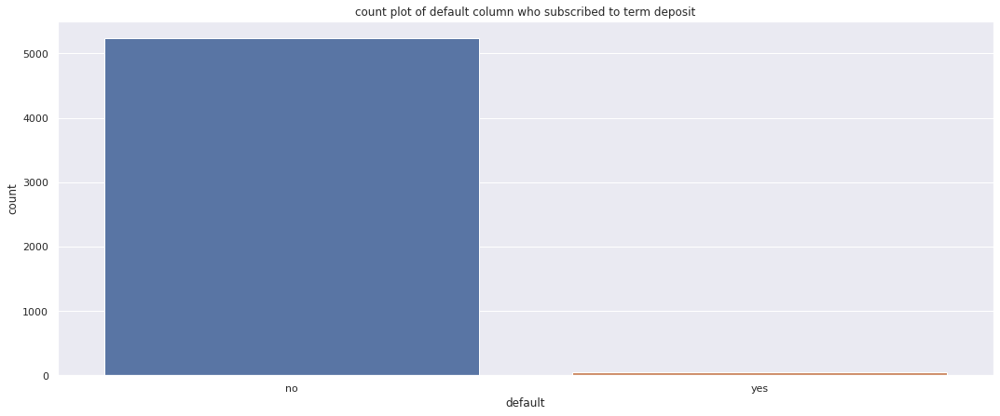

In [0]:
plt.figure(figsize=(18,7))
plt.title("count plot of default column who subscribed to term deposit")
sns.countplot(data[data['Target']=='yes'].default)

In [0]:
print("Individual count of default column who did not subscribed to term deposit: ")
data[data['Target']=='no'].default.value_counts()

Individual count of default column who did not subscribed to term deposit: 


no     39159
yes      763
Name: default, dtype: int64

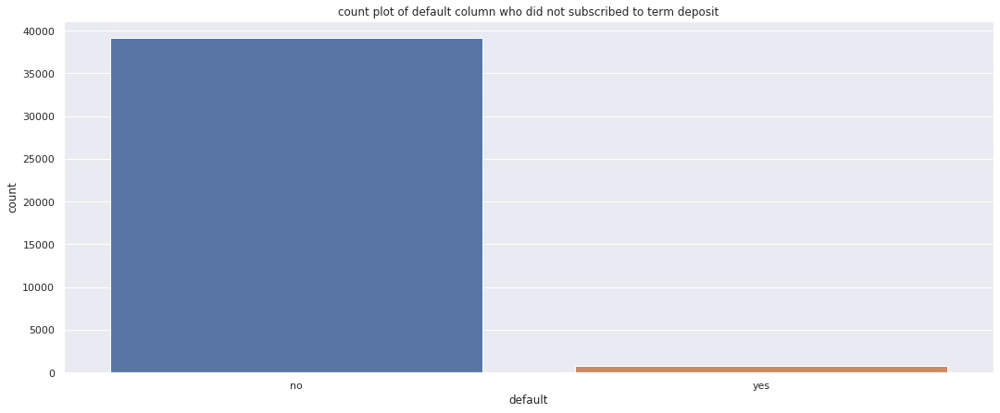

In [0]:
plt.figure(figsize=(18,7))
plt.title("count plot of default column who did not subscribed to term deposit")
sns.countplot(data[data['Target']=='no'].default)

Observations:
* MAny have no default in the credit
* Highly imbalanced towards no default

Lets do statistical analysis whether type of existence of credit in default is related to the client subscribed a term deposit or not.

Question:  Is existence of credit in default related to the client subscriBING a term deposit or not. ?

NULL HYPOTHESIS(H0): existence of credit in default is not related to the client subscribing a term deposit

ALTERNATIVE HYPOTHESIS(Ha): existence of credit in default is related to the client subscribing a term deposit

In [0]:
# Level of significance = 0.05

In [0]:
import numpy as np
import pandas as pd
s = pd.crosstab(data.default, data.Target, margins = False)
print(s)

Target      no   yes
default             
no       39159  5237
yes        763    52


In [0]:
# chi-squared test with similar proportions
from scipy.stats import chi2_contingency
from scipy.stats import chi2
# contingency table
table = s
print("Contingency table:")
print(table)
stat, p, dof, expected = chi2_contingency(table)
print('dof=%d' % dof)
print("Note : dof = (rows-1)*(cols-1)  = (2-1)*(2-1)")
print(expected)

Contingency table:
Target      no   yes
default             
no       39159  5237
yes        763    52
dof=1
Note : dof = (rows-1)*(cols-1)  = (2-1)*(2-1)
[[39202.34261574  5193.65738426]
 [  719.65738426    95.34261574]]


In [0]:
# interpret test-statistic
null = 'existence of credit in default is not related to the client subscribing a term deposit'
alternate = 'existence of credit in default is related to the client subscribing a term deposit'
prob = 0.95
critical = chi2.ppf(prob, dof)
print('probability=%.3f, critical=%.3f, stat=%.3f' % (prob, critical, stat))
if abs(stat) >= critical:
    print('Dependent (reject H0)')
    print(alternate)
else:
    print('Independent (fail to reject H0)')
    print(null)

probability=0.950, critical=3.841, stat=22.202
Dependent (reject H0)
existence of credit in default is related to the client subscribing a term deposit


In [0]:
# interpret p-value
alpha = 1.0 - prob
print('significance=%.3f, p=%.3f' % (alpha, p))
if p <= alpha:
    print('Dependent (reject H0)')
    print(alternate)
else:
    print('Independent (fail to reject H0)')
    print(null)

significance=0.050, p=0.000
Dependent (reject H0)
existence of credit in default is related to the client subscribing a term deposit


# 3.3.6 Balance

This column is about the average yearly balance in euros of customer

In [0]:
print("The 5 point summary of balance column would give the below results: ")
data['balance'].describe().T

The 5 point summary of balance column would give the below results: 


count     45211.000000
mean       1362.272058
std        3044.765829
min       -8019.000000
25%          72.000000
50%         448.000000
75%        1428.000000
max      102127.000000
Name: balance, dtype: float64

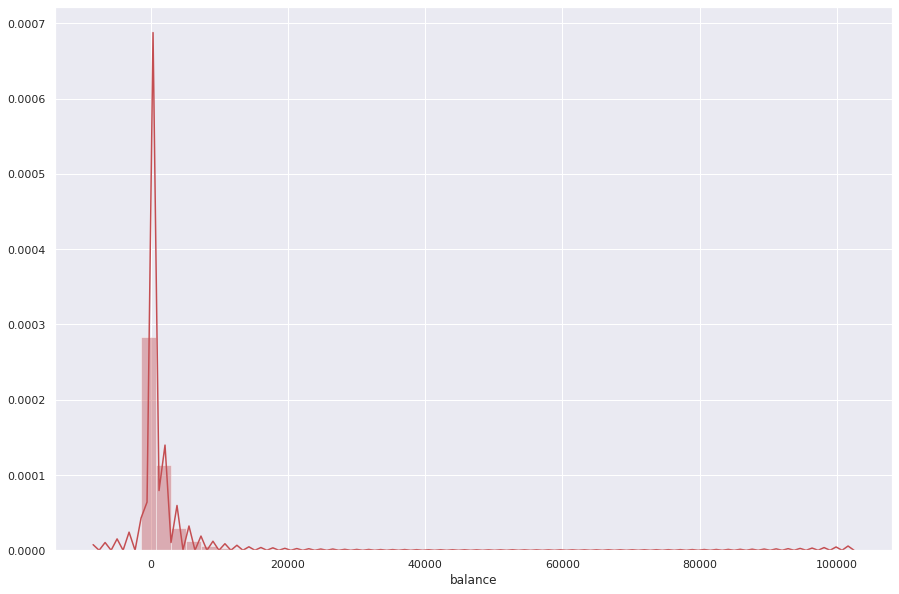

In [0]:
plt.figure(figsize=(15,10))
sns.set_color_codes()
ax = sns.distplot(data['balance'], color="r")

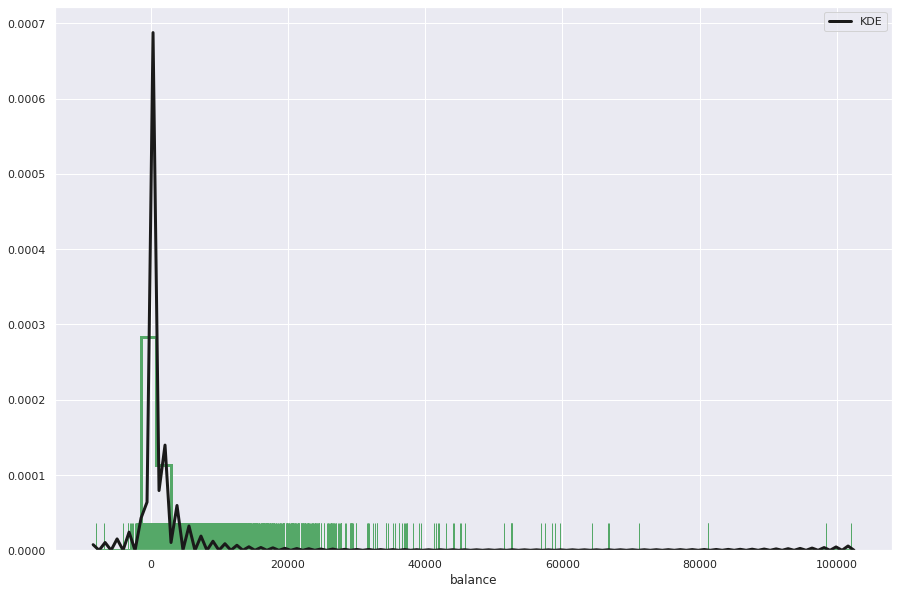

In [0]:
plt.figure(figsize=(15,10))
ax = sns.distplot(data['balance'], rug=True, rug_kws={"color": "g"},
                  kde_kws={"color": "k", "lw": 3, "label": "KDE"},
                  hist_kws={"histtype": "step", "linewidth": 3,
                            "alpha": 1, "color": "g"})

Looking for outliers in age column

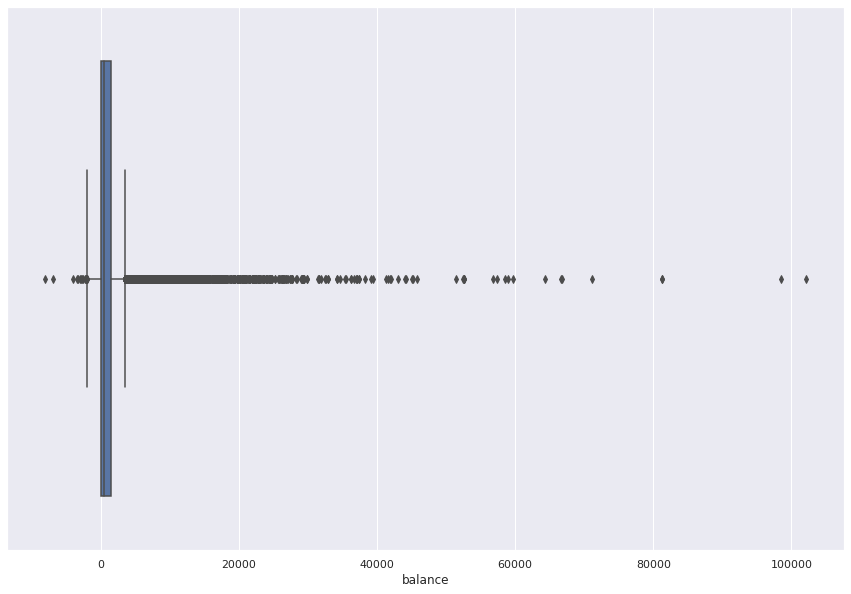

In [0]:
plt.figure(figsize=(15,10))
sns.boxplot(data['balance'])

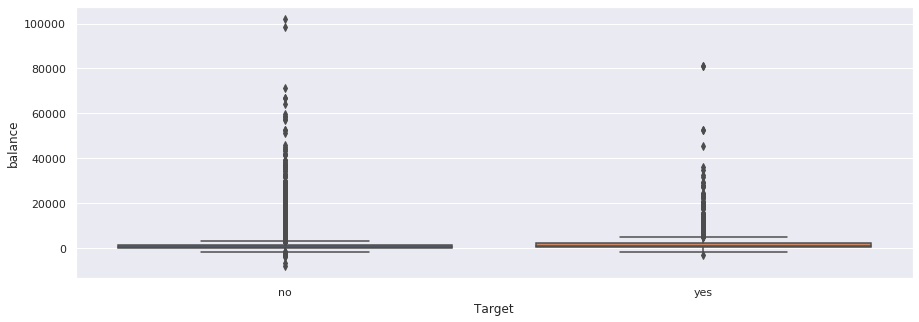

In [0]:
plt.figure(figsize=(15,5))
sns.boxplot(y=data['balance'],x=data['Target'])

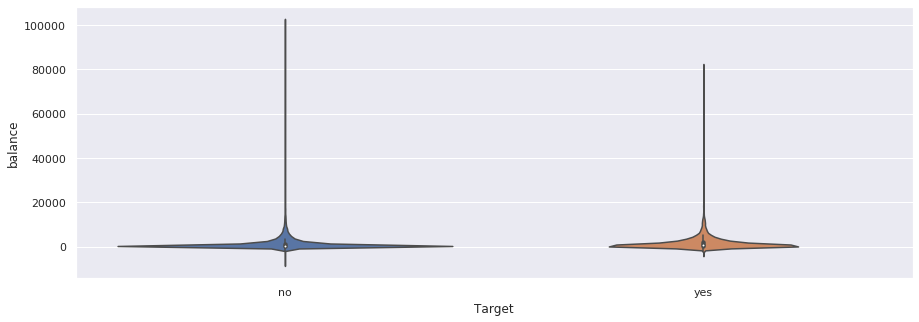

In [0]:
plt.figure(figsize=(15,5))
sns.violinplot(y=data['balance'],x=data['Target'])

Observations:
* Many outliers are present but cannot be ignored because balance is something which should be need so as to put the deposit
* Also since violin plot almost coincides, no direct intrepretation can be done, so statistical analysis need to be done

Lets do statistical analysis whether age is related to the client subscribed a term deposit or not.

Question:  Is age related to the client subscriBING a term deposit or not. ?

In [0]:
print("Individual count of balance column: "," "*500, data['balance'].value_counts())

Individual count of balance column:                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                       0        3514
1         195
2         156
4         139
3         134
         ... 
4305        1
6352        1
18881       1
14889       1
7218        1
Name: balance, Length: 7168, dtype: int64


NULL HYPOTHESIS(H0): Avg balance is not related to the client subscribing a term deposit

ALTERNATIVE HYPOTHESIS(Ha): Avg balance is related to the client subscribing a term deposit

In [0]:
# Level of significance = 0.05

In [0]:
null = 'Avg balance is not related to the client subscribing a term deposit'
alternate = 'Avg balance is related to the client subscribing a term deposit'
a=np.array(data[data['Target']=='yes'].balance)
b=np.array(data[data['Target']=='no'].balance)
t_stat, p_value = stats.ttest_ind(a,b,axis=0)
print("the caluclated value of tstatistic is",t_stat)
print("The pvalue is",p_value)
print(""*1000)
print("Based on the statistical evidence")
if p_value > 0.05:
    print("we fail to reject null hypothesis as the p_value", p_value, "is greater than 0.05")
    print(null)
else:
    print("we reject null hypothesis as the p_value", p_value, "is less than 0.05")
    print(alternate)

the caluclated value of tstatistic is 11.25043445878562
The pvalue is 2.5211136918751468e-29

Based on the statistical evidence
we reject null hypothesis as the p_value 2.5211136918751468e-29 is less than 0.05
Avg balance is related to the client subscribing a term deposit


# 3.3.7 Housing

This column is about whether the customer has housing loan or not

In [0]:
print("Unique values of Housing column:", '\n',data['housing'].unique())

Unique values of Housing column: 
 ['yes' 'no']


In [0]:
print("Individual count of housing column: ")
data['housing'].value_counts()

Individual count of housing column: 


yes    25130
no     20081
Name: housing, dtype: int64

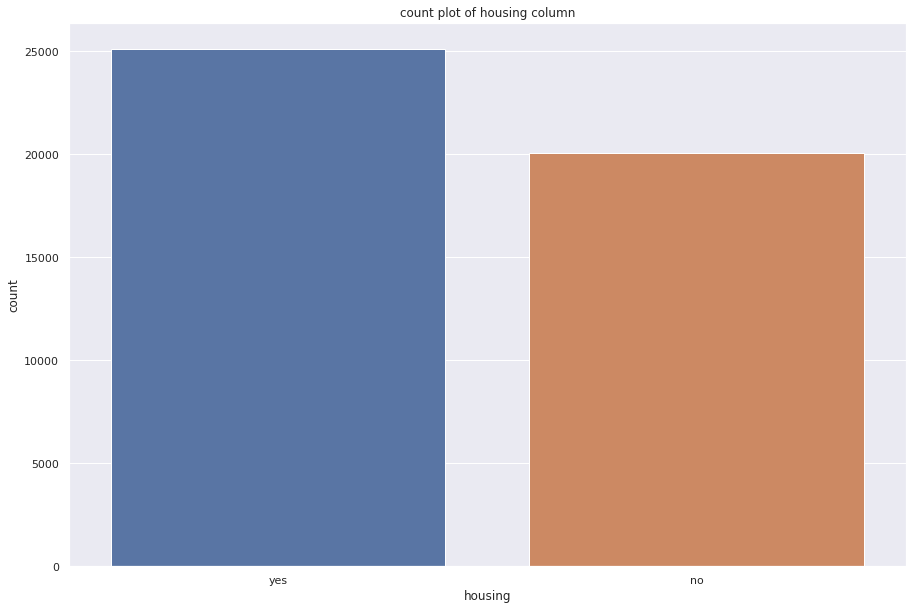

In [0]:
plt.figure(figsize=(15,10))
plt.title("count plot of housing column")
sns.countplot(data['housing'])

In [0]:
print("Individual count of housing column who subscribed to term deposit: ")
data[data['Target']=='yes'].housing.value_counts()

Individual count of housing column who subscribed to term deposit: 


no     3354
yes    1935
Name: housing, dtype: int64

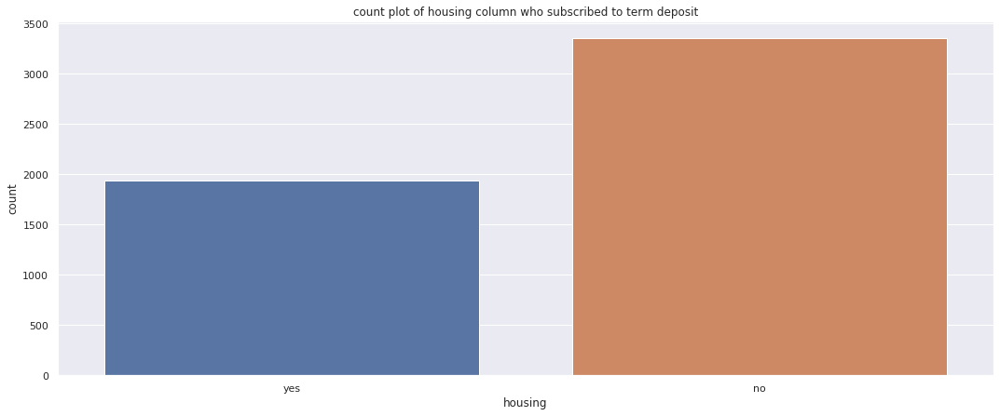

In [0]:
plt.figure(figsize=(18,7))
plt.title("count plot of housing column who subscribed to term deposit")
sns.countplot(data[data['Target']=='yes'].housing)

In [0]:
print("Individual count of housing column who did not subscribed to term deposit: ")
data[data['Target']=='no'].housing.value_counts()

Individual count of housing column who did not subscribed to term deposit: 


yes    23195
no     16727
Name: housing, dtype: int64

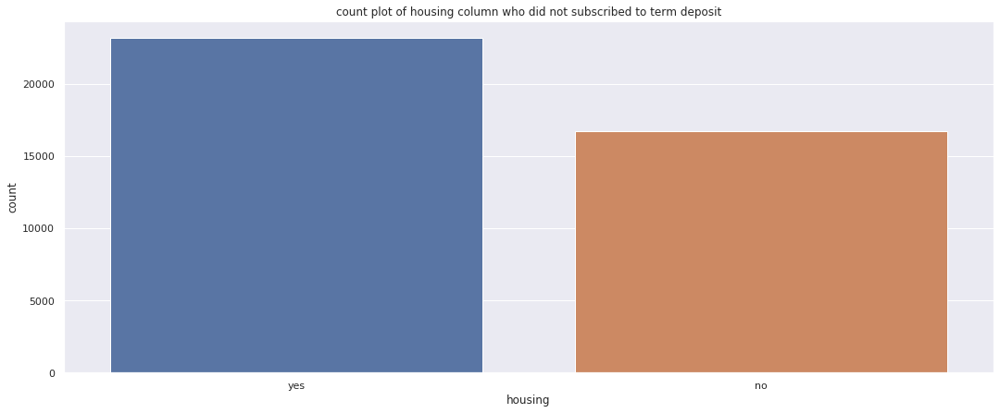

In [0]:
plt.figure(figsize=(18,7))
plt.title("count plot of housing column who did not subscribed to term deposit")
sns.countplot(data[data['Target']=='no'].housing)

Observation:
Most of them who subscribed to a deposit have no housing loan and this is based on the count plot shown above

Lets do statistical analysis whether having housing loan is related to the client subscribed a term deposit or not.

Question:  Is having housing loan related to the client subscriBING a term deposit or not. ?

NULL HYPOTHESIS(H0): having housing loan is not related to the client subscribing a term deposit

ALTERNATIVE HYPOTHESIS(Ha): having housing loan is related to the client subscribing a term deposit

In [0]:
# Level of significance = 0.05

In [0]:
import numpy as np
import pandas as pd
s = pd.crosstab(data.housing, data.Target, margins = False)
print(s)

Target      no   yes
housing             
no       16727  3354
yes      23195  1935


In [0]:
# contingency table
table = s
print("Contingency table:")
print(table)
stat, p, dof, expected = chi2_contingency(table)
print('dof=%d' % dof)
print("Note : dof = (rows-1)*(cols-1)  = (2-1)*(2-1)")
print(expected)

Contingency table:
Target      no   yes
housing             
no       16727  3354
yes      23195  1935
dof=1
Note : dof = (rows-1)*(cols-1)  = (2-1)*(2-1)
[[17731.82813917  2349.17186083]
 [22190.17186083  2939.82813917]]


In [0]:
# interpret test-statistic
null = 'having housing loan is not related to the client subscribing a term deposit'
alternate = 'having housing loan is related to the client subscribing a term deposit'
prob = 0.95
critical = chi2.ppf(prob, dof)
print('probability=%.3f, critical=%.3f, stat=%.3f' % (prob, critical, stat))
if abs(stat) >= critical:
    print('Dependent (reject H0)')
    print(alternate)
else:
    print('Independent (fail to reject H0)')
    print(null)

probability=0.950, critical=3.841, stat=874.822
Dependent (reject H0)
having housing loan is related to the client subscribing a term deposit


In [0]:
# interpret p-value
alpha = 1.0 - prob
print('significance=%.3f, p=%.3f' % (alpha, p))
if p <= alpha:
    print('Dependent (reject H0)')
    print(alternate)
else:
    print('Independent (fail to reject H0)')
    print(null)

significance=0.050, p=0.000
Dependent (reject H0)
having housing loan is related to the client subscribing a term deposit


# 3.3.8 Loan

This column is about whether the customer has personal loan or not

In [0]:
print("Unique values of Loan column:", '\n',data['loan'].unique())

Unique values of Loan column: 
 ['no' 'yes']


In [0]:
print("Individual count of Loan column: ")
data['loan'].value_counts()

Individual count of Loan column: 


no     37967
yes     7244
Name: loan, dtype: int64

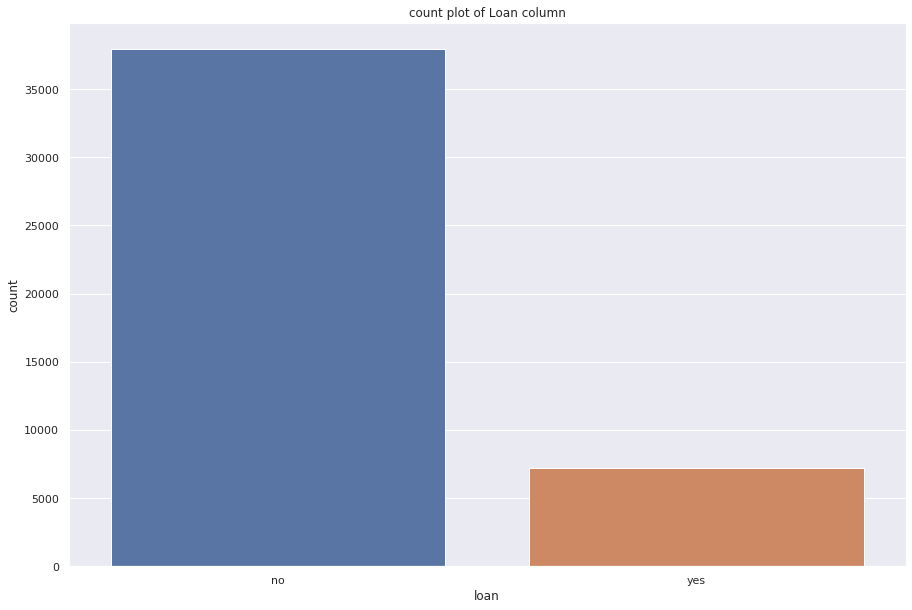

In [0]:
plt.figure(figsize=(15,10))
plt.title("count plot of Loan column")
sns.countplot(data['loan'])

In [0]:
print("Individual count of Loan column who subscribed to term deposit: ")
data[data['Target']=='yes'].loan.value_counts()

Individual count of Loan column who subscribed to term deposit: 


no     4805
yes     484
Name: loan, dtype: int64

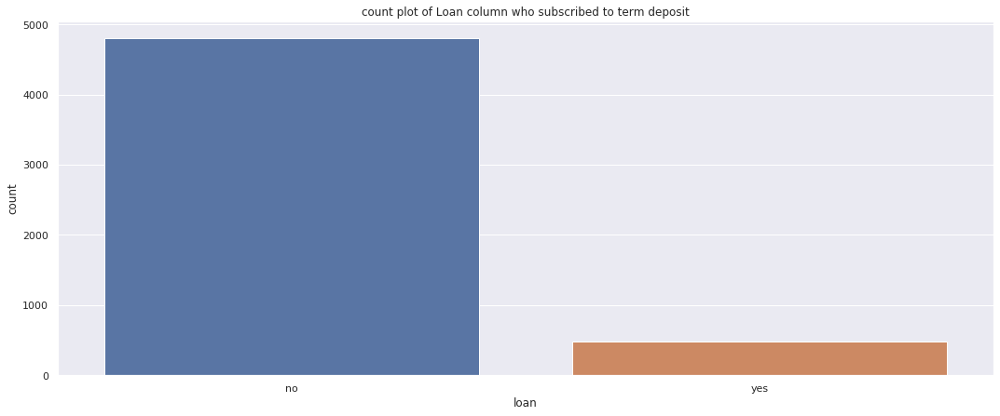

In [0]:
plt.figure(figsize=(18,7))
plt.title("count plot of Loan column who subscribed to term deposit")
sns.countplot(data[data['Target']=='yes'].loan)

In [0]:
print("Individual count of loan column who did not subscribed to term deposit: ")
data[data['Target']=='no'].loan.value_counts()

Individual count of loan column who did not subscribed to term deposit: 


no     33162
yes     6760
Name: loan, dtype: int64

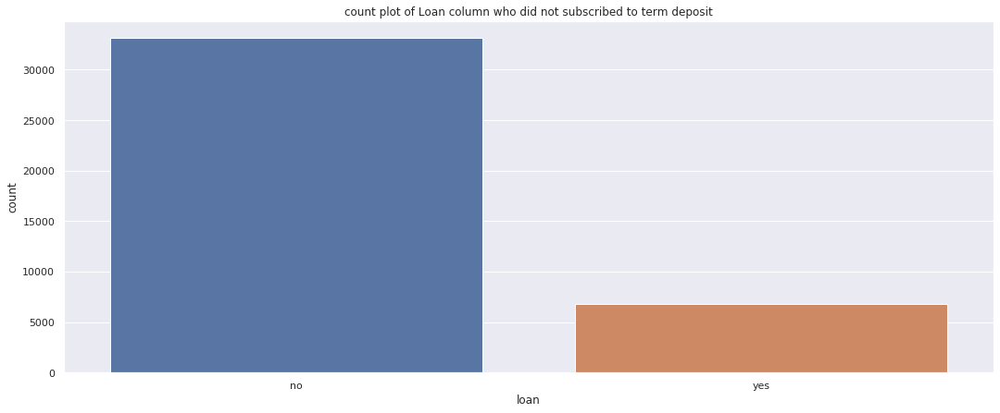

In [0]:
plt.figure(figsize=(18,7))
plt.title("count plot of Loan column who did not subscribed to term deposit")
sns.countplot(data[data['Target']=='no'].loan)

Observation:
* Those who subscribed to deposit, most of them have no personal loan 

Lets do statistical analysis whether having personal loan is related to the client subscribed a term deposit or not.

Question:  Is having personal loan related to the client subscriBING a term deposit or not. ?

NULL HYPOTHESIS(H0): having personal loan is not related to the client subscribing a term deposit

ALTERNATIVE HYPOTHESIS(Ha): having personal loan is related to the client subscribing a term deposit

In [0]:
# Level of significance = 0.05

In [0]:
import numpy as np
import pandas as pd
s = pd.crosstab(data.loan, data.Target, margins = False)
print(s)

Target     no   yes
loan               
no      33162  4805
yes      6760   484


In [0]:
# contingency table
table = s
print("Contingency table:")
print(table)
stat, p, dof, expected = chi2_contingency(table)
print('dof=%d' % dof)
print("Note : dof = (rows-1)*(cols-1)  = (2-1)*(2-1)")
print(expected)

Contingency table:
Target     no   yes
loan               
no      33162  4805
yes      6760   484
dof=1
Note : dof = (rows-1)*(cols-1)  = (2-1)*(2-1)
[[33525.4379244  4441.5620756]
 [ 6396.5620756   847.4379244]]


In [0]:
# interpret test-statistic
null = 'having personal loan is not related to the client subscribing a term deposit'
alternate = 'having personal loan is related to the client subscribing a term deposit'
prob = 0.95
critical = chi2.ppf(prob, dof)
print('probability=%.3f, critical=%.3f, stat=%.3f' % (prob, critical, stat))
if abs(stat) >= critical:
    print('Dependent (reject H0)')
    print(alternate)
else:
    print('Independent (fail to reject H0)')
    print(null)

probability=0.950, critical=3.841, stat=209.617
Dependent (reject H0)
having personal loan is related to the client subscribing a term deposit


In [0]:
# interpret p-value
alpha = 1.0 - prob
print('significance=%.3f, p=%.3f' % (alpha, p))
if p <= alpha:
    print('Dependent (reject H0)')
    print(alternate)
else:
    print('Independent (fail to reject H0)')
    print(null)

significance=0.050, p=0.000
Dependent (reject H0)
having personal loan is related to the client subscribing a term deposit


# 3.3.9 Contact

This column is about the communication type

In [0]:
print("Unique values of Contact column:", '\n',data['contact'].unique())

Unique values of Contact column: 
 ['unknown' 'cellular' 'telephone']


In [0]:
print("Individual count of Contact column: ")
data['contact'].value_counts()

Individual count of Contact column: 


cellular     29285
unknown      13020
telephone     2906
Name: contact, dtype: int64

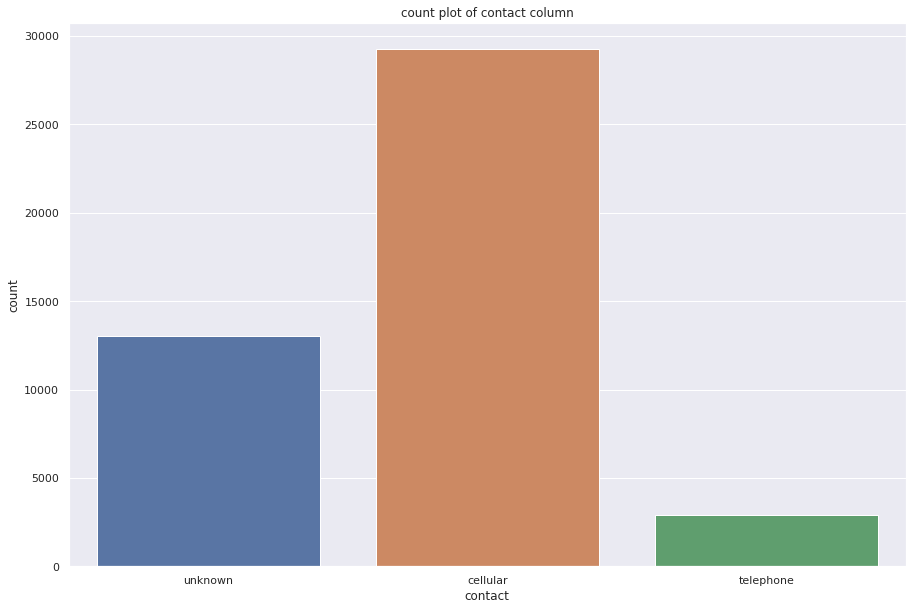

In [0]:
plt.figure(figsize=(15,10))
plt.title("count plot of contact column")
sns.countplot(data['contact'])

In [0]:
print("Individual count of contact column who subscribed to term deposit: ")
data[data['Target']=='yes'].contact.value_counts()

Individual count of contact column who subscribed to term deposit: 


cellular     4369
unknown       530
telephone     390
Name: contact, dtype: int64

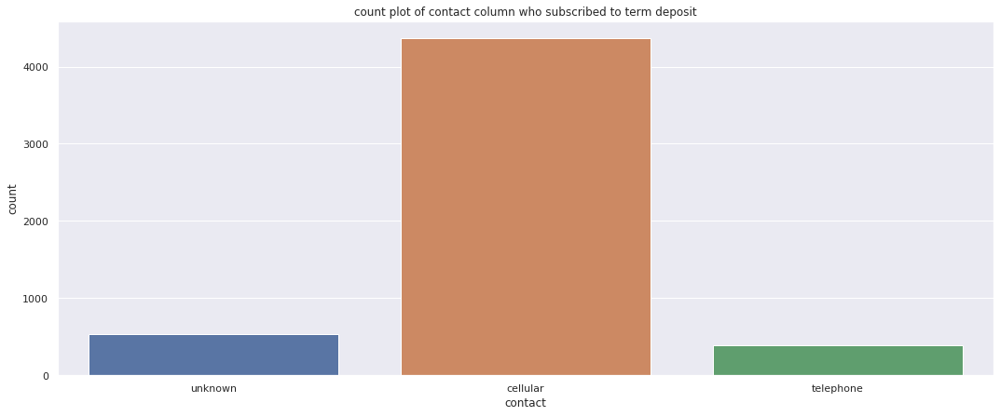

In [0]:
plt.figure(figsize=(18,7))
plt.title("count plot of contact column who subscribed to term deposit")
sns.countplot(data[data['Target']=='yes'].contact)

In [0]:
print("Individual count of contact column who did not subscribed to term deposit: ")
data[data['Target']=='no'].contact.value_counts()

Individual count of contact column who did not subscribed to term deposit: 


cellular     24916
unknown      12490
telephone     2516
Name: contact, dtype: int64

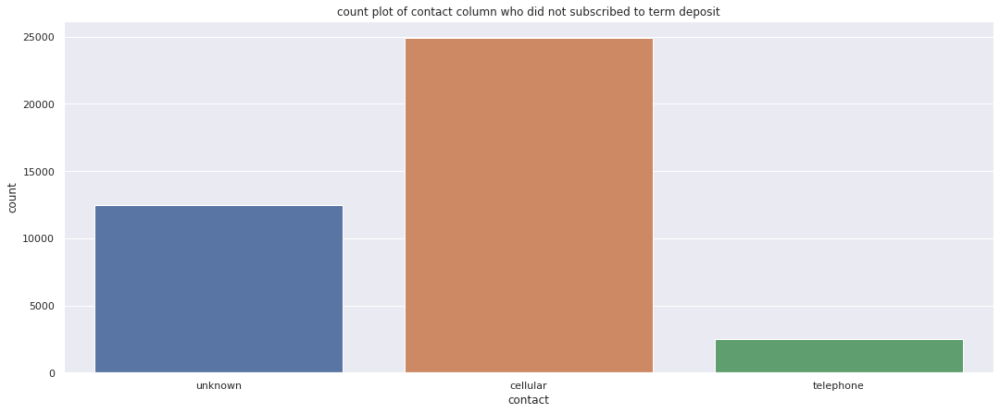

In [0]:
plt.figure(figsize=(18,7))
plt.title("count plot of contact column who did not subscribed to term deposit")
sns.countplot(data[data['Target']=='no'].contact)

Observation: Cellular mode of contact is the most happened mode of communication or contact

Lets do statistical analysis whether mode of communication with the customer is related to the client subscribed a term deposit or not.

Question:  Is mode of communication with the customer related to the client subscriBING a term deposit or not. ?

NULL HYPOTHESIS(H0): mode of communication with the customer is not related to the client subscribing a term deposit

ALTERNATIVE HYPOTHESIS(Ha): mode of communication with the customer is related to the client subscribing a term deposit

In [0]:
# Level of significance = 0.05

In [0]:
import numpy as np
import pandas as pd
s = pd.crosstab(data.contact, data.Target, margins = False)
print(s)

Target        no   yes
contact               
cellular   24916  4369
telephone   2516   390
unknown    12490   530


In [0]:
# contingency table
table = s
print("Contingency table:")
print(table)
stat, p, dof, expected = chi2_contingency(table)
print('dof=%d' % dof)
print("Note : dof = (rows-1)*(cols-1)  = (2-1)*(2-1)")
print(expected)

Contingency table:
Target        no   yes
contact               
cellular   24916  4369
telephone   2516   390
unknown    12490   530
dof=2
Note : dof = (rows-1)*(cols-1)  = (2-1)*(2-1)
[[25859.09999779  3425.90000221]
 [ 2566.04215788   339.95784212]
 [11496.85784433  1523.14215567]]


In [0]:
# interpret test-statistic
null = 'mode of communication with the customer is not related to the client subscribing a term deposit'
alternate = 'mode of communication with the customer is related to the client subscribing a term deposit'
prob = 0.95
critical = chi2.ppf(prob, dof)
print('probability=%.3f, critical=%.3f, stat=%.3f' % (prob, critical, stat))
if abs(stat) >= critical:
    print('Dependent (reject H0)')
    print(alternate)
else:
    print('Independent (fail to reject H0)')
    print(null)

probability=0.950, critical=5.991, stat=1035.714
Dependent (reject H0)
mode of communication with the customer is related to the client subscribing a term deposit


In [0]:
# interpret p-value
alpha = 1.0 - prob
print('significance=%.3f, p=%.3f' % (alpha, p))
if p <= alpha:
    print('Dependent (reject H0)')
    print(alternate)
else:
    print('Independent (fail to reject H0)')
    print(null)

significance=0.050, p=0.000
Dependent (reject H0)
mode of communication with the customer is related to the client subscribing a term deposit


# 3.3.10 last contact day of the month

This column is about the last contact day of the month of customer

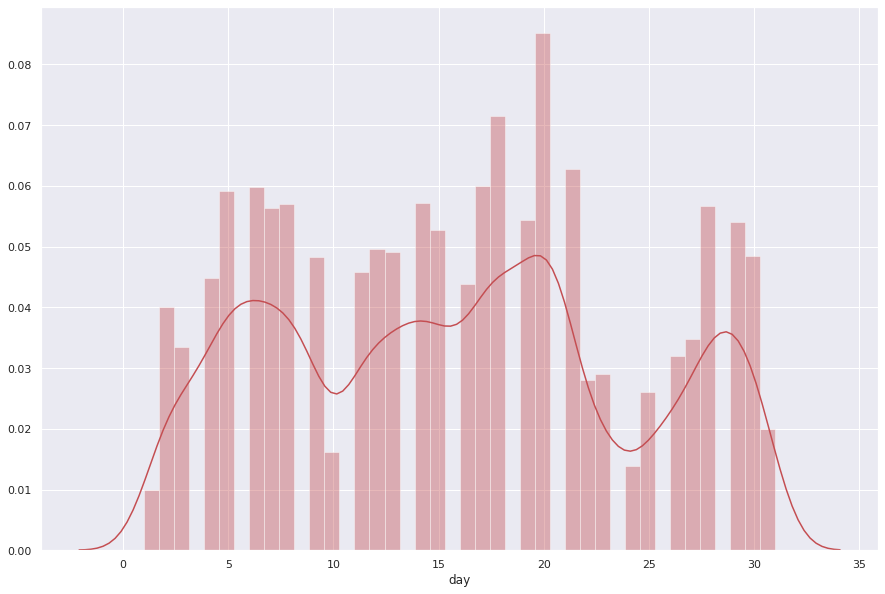

In [0]:
plt.figure(figsize=(15,10))
sns.set_color_codes()
ax = sns.distplot(data['day'], color="r")

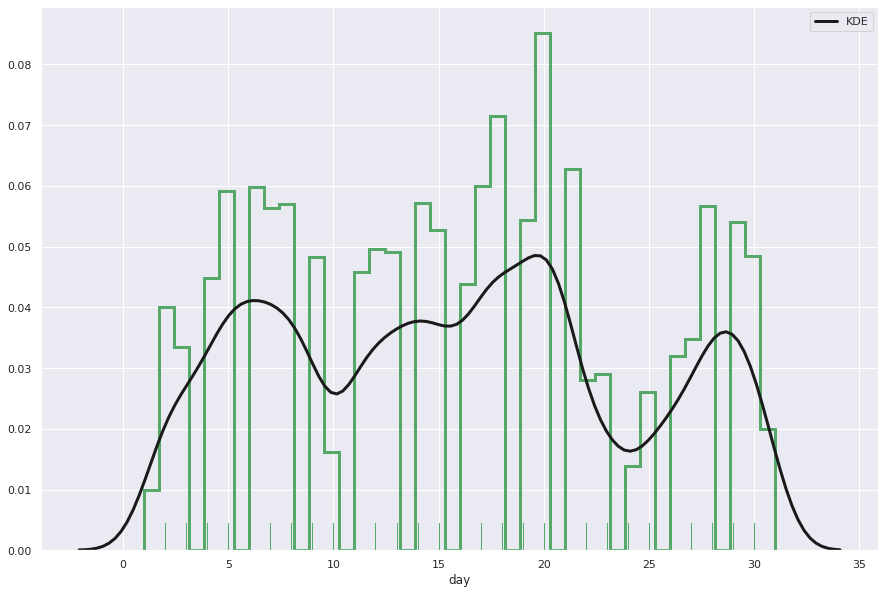

In [0]:
plt.figure(figsize=(15,10))
ax = sns.distplot(data['day'], rug=True, rug_kws={"color": "g"},
                  kde_kws={"color": "k", "lw": 3, "label": "KDE"},
                  hist_kws={"histtype": "step", "linewidth": 3,
                            "alpha": 1, "color": "g"})

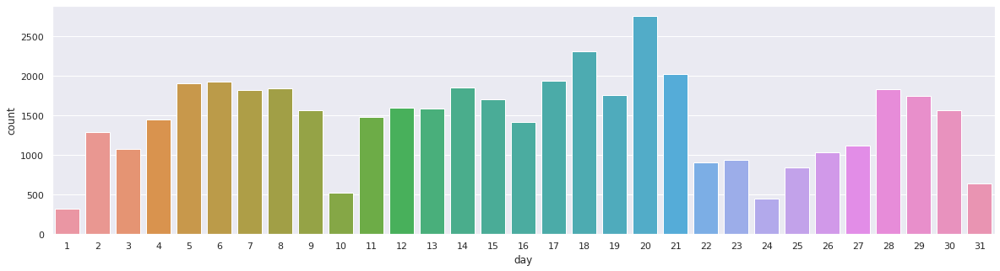

In [0]:
plt.figure(figsize=(20,5))
sns.countplot(data['day'])

Looking for outliers in last contact day of the month column

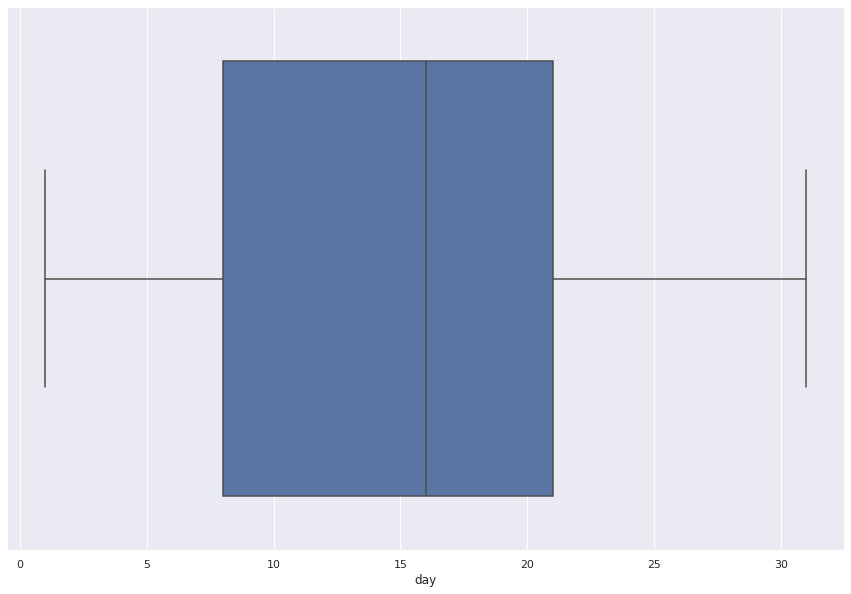

In [0]:
plt.figure(figsize=(15,10))
sns.boxplot(data['day'])

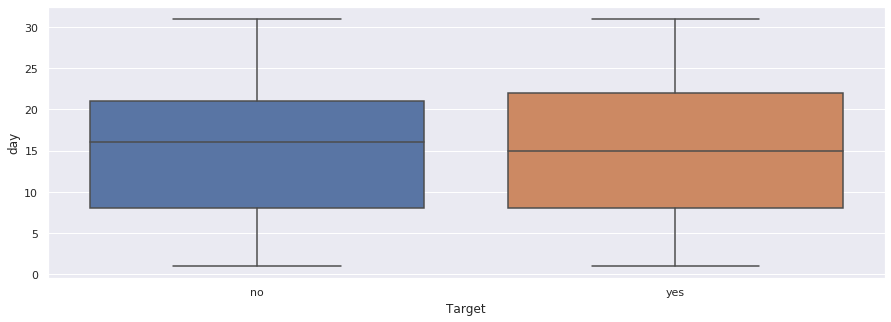

In [0]:
plt.figure(figsize=(15,5))
sns.boxplot(y=data['day'],x=data['Target'])

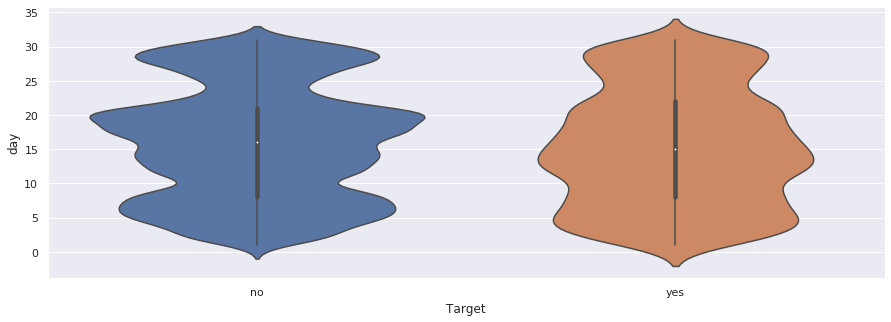

In [0]:
plt.figure(figsize=(15,5))
sns.violinplot(y=data['day'],x=data['Target'])

Lets do statistical analysis whether day of last contact is related to the client subscribed a term deposit or not.

Question:  Is day of last contact related to the client subscriBING a term deposit or not. ?

In [0]:
print("Individual count of age column: "," "*500, data['day'].value_counts())

Individual count of age column:                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                       20    2752
18    2308
21    2026
17    1939
6     1932
5     1910
14    1848
8     1842
28    1830
7     1817
19    1757
29    1745
15    1703
12    1603
13    1585
30    1566
9     1561
11    1479
4     1445
16    1415
2     1293
27    1121
3     1079
26    1035
23     939
22     905
25     840
31     643
10     524
24     447
1      322
Name: day, dtype: int64


NULL HYPOTHESIS(H0): day of last contact with the customer is not related to him subscribing a term deposit

ALTERNATIVE HYPOTHESIS(Ha): day of last contact with the customer is related to him subscribing a term deposit

In [0]:
# Level of significance = 0.05

In [0]:
null = 'day of last contact with the customer is not related to him subscribing a term deposit'
alternate = 'day of last contact with the customer is related to him subscribing a term deposit'
a=np.array(data[data['Target']=='yes'].day)
b=np.array(data[data['Target']=='no'].day)
t_stat, p_value = stats.ttest_ind(a,b,axis=0)
print("the caluclated value of tstatistic is",t_stat)
print("The pvalue is",p_value)
print(""*1000)
print("Based on the statistical evidence")
if p_value > 0.05:
    print("we fail to reject null hypothesis as the p_value", p_value, "is greater than 0.05")
    print(null)
else:
    print("we reject null hypothesis as the p_value", p_value, "is less than 0.05")
    print(alternate)

the caluclated value of tstatistic is -6.029843252838383
The pvalue is 1.653880160817521e-09

Based on the statistical evidence
we reject null hypothesis as the p_value 1.653880160817521e-09 is less than 0.05
day of last contact with the customer is related to him subscribing a term deposit


# 3.3.11 last contact month with the customer

This column is about the last contact month with customer

In [0]:
print("Unique values of month column:", '\n',data['month'].unique())

Unique values of month column: 
 ['may' 'jun' 'jul' 'aug' 'oct' 'nov' 'dec' 'jan' 'feb' 'mar' 'apr' 'sep']


In [0]:
print("Individual count of month column: ")
data['month'].value_counts()

Individual count of month column: 


may    13766
jul     6895
aug     6247
jun     5341
nov     3970
apr     2932
feb     2649
jan     1403
oct      738
sep      579
mar      477
dec      214
Name: month, dtype: int64

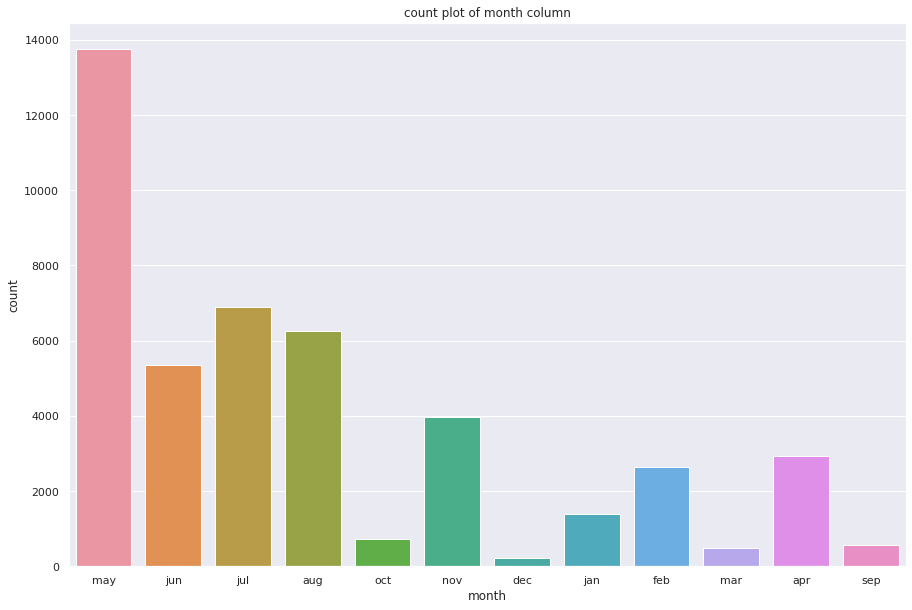

In [0]:
plt.figure(figsize=(15,10))
plt.title("count plot of month column")
sns.countplot(data['month'])

In [0]:
print("Individual count of month column who subscribed to term deposit: ")
data[data['Target']=='yes'].month.value_counts()

Individual count of month column who subscribed to term deposit: 


may    925
aug    688
jul    627
apr    577
jun    546
feb    441
nov    403
oct    323
sep    269
mar    248
jan    142
dec    100
Name: month, dtype: int64

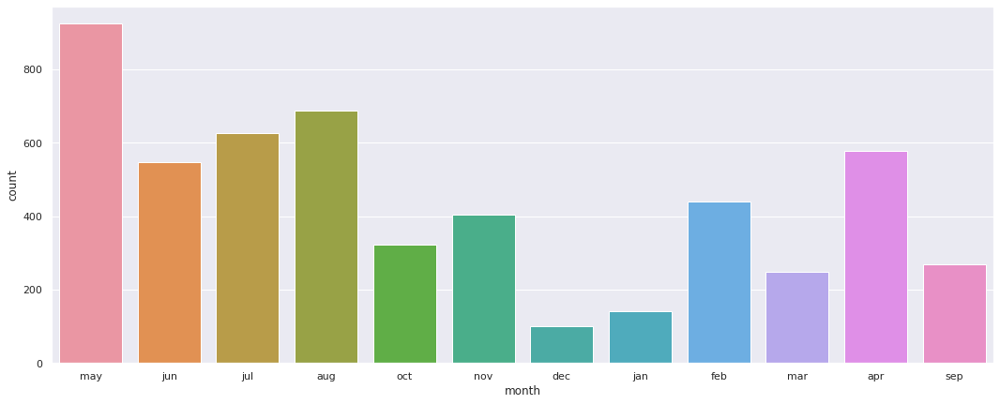

In [0]:
plt.figure(figsize=(18,7))
sns.countplot(data[data['Target']=='yes'].month)

In [0]:
print("Individual count of month column who did not subscribed to term deposit: ")
data[data['Target']=='no'].month.value_counts()

Individual count of month column who did not subscribed to term deposit: 


may    12841
jul     6268
aug     5559
jun     4795
nov     3567
apr     2355
feb     2208
jan     1261
oct      415
sep      310
mar      229
dec      114
Name: month, dtype: int64

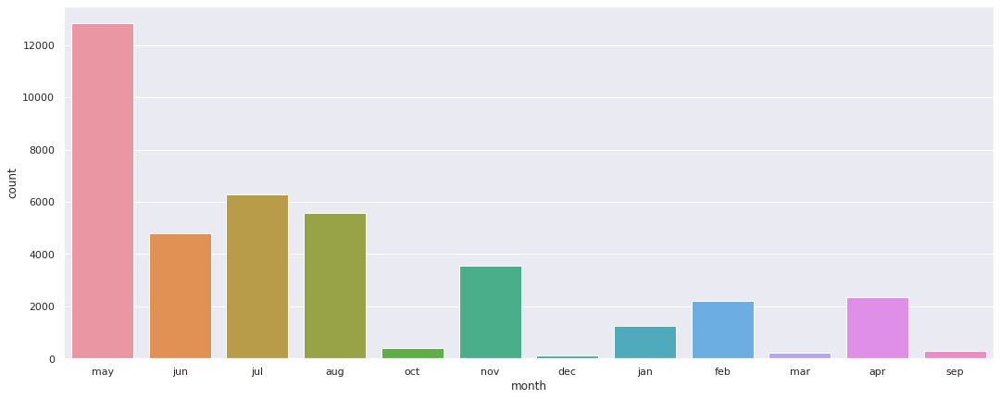

In [0]:
plt.figure(figsize=(18,7))
sns.countplot(data[data['Target']=='no'].month)

Lets do statistical analysis whether last contact month with the customer is related to the client subscribed a term deposit or not.

Question:  Is last contact month with the customer related to the client subscriBING a term deposit or not. ?

NULL HYPOTHESIS(H0): last contact month with the customer is not related to the client subscribing a term deposit

ALTERNATIVE HYPOTHESIS(Ha): last contact month with the customer is related to the client subscribing a term deposit

In [0]:
# Level of significance = 0.05

In [0]:
import numpy as np
import pandas as pd
s = pd.crosstab(data.month, data.Target, margins = False)
print(s)

Target     no  yes
month             
apr      2355  577
aug      5559  688
dec       114  100
feb      2208  441
jan      1261  142
jul      6268  627
jun      4795  546
mar       229  248
may     12841  925
nov      3567  403
oct       415  323
sep       310  269


In [0]:
# contingency table
table = s
print("Contingency table:")
print(table)
stat, p, dof, expected = chi2_contingency(table)
print('dof=%d' % dof)
print("Note : dof = (rows-1)*(cols-1)  = (12-1)*(2-1)")
print(expected)

Contingency table:
Target     no  yes
month             
apr      2355  577
aug      5559  688
dec       114  100
feb      2208  441
jan      1261  142
jul      6268  627
jun      4795  546
mar       229  248
may     12841  925
nov      3567  403
oct       415  323
sep       310  269
dof=11
Note : dof = (rows-1)*(cols-1)  = (12-1)*(2-1)
[[ 2589.00055296   342.99944704]
 [ 5516.19592577   730.80407423]
 [  188.96525182    25.03474818]
 [ 2339.10725266   309.89274734]
 [ 1238.87031917   164.12968083]
 [ 6088.3897724    806.6102276 ]
 [ 4716.18415872   624.81584128]
 [  421.19824821    55.80175179]
 [12155.58718011  1610.41281989]
 [ 3505.57032581   464.42967419]
 [  651.66521422    86.33478578]
 [  511.26579815    67.73420185]]


In [0]:
# interpret test-statistic
null = 'last contact month with the customer is not related to the client subscribing a term deposit'
alternate = 'last contact month with the customer is related to the client subscribing a term deposit'
prob = 0.95
critical = chi2.ppf(prob, dof)
print('probability=%.3f, critical=%.3f, stat=%.3f' % (prob, critical, stat))
if abs(stat) >= critical:
    print('Dependent (reject H0)')
    print(alternate)
else:
    print('Independent (fail to reject H0)')
    print(null)

probability=0.950, critical=19.675, stat=3061.839
Dependent (reject H0)
last contact month with the customer is related to the client subscribing a term deposit


In [0]:
# interpret p-value
alpha = 1.0 - prob
print('significance=%.3f, p=%.3f' % (alpha, p))
if p <= alpha:
    print('Dependent (reject H0)')
    print(alternate)
else:
    print('Independent (fail to reject H0)')
    print(null)

significance=0.050, p=0.000
Dependent (reject H0)
last contact month with the customer is related to the client subscribing a term deposit


# 3.3.12 duration in seconds

This column tells the duration in seconds of contact

In [0]:
print("The 5 point summary of duration column would give the below results: ")
data['duration'].describe().T

The 5 point summary of duration column would give the below results: 


count    45211.000000
mean       258.163080
std        257.527812
min          0.000000
25%        103.000000
50%        180.000000
75%        319.000000
max       4918.000000
Name: duration, dtype: float64

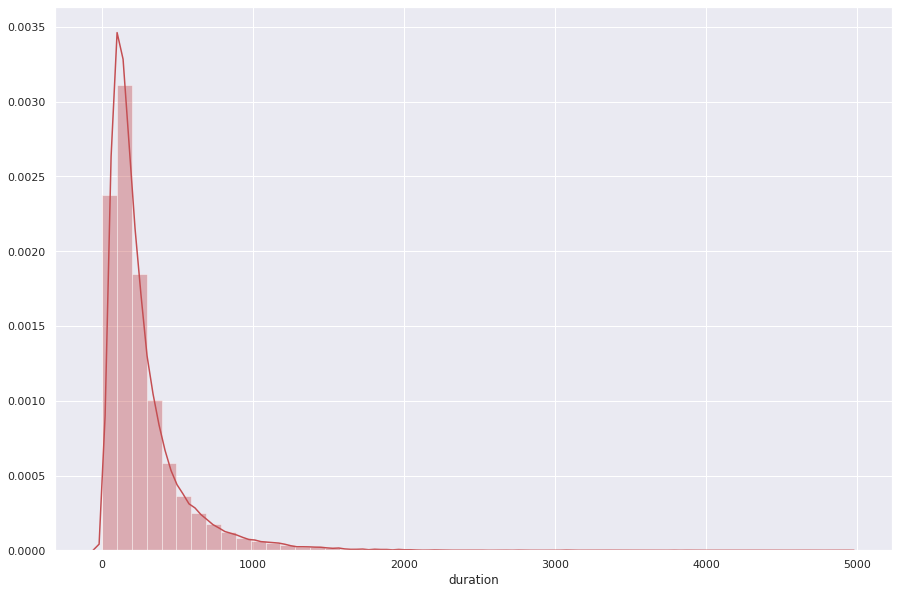

In [0]:
plt.figure(figsize=(15,10))
sns.set_color_codes()
ax = sns.distplot(data['duration'], color="r")

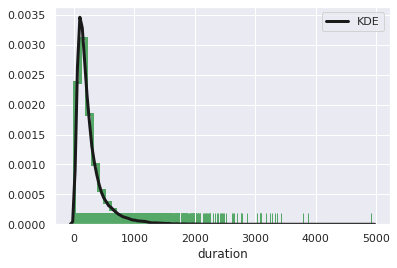

In [0]:
ax = sns.distplot(data['duration'], rug=True, rug_kws={"color": "g"},
                  kde_kws={"color": "k", "lw": 3, "label": "KDE"},
                  hist_kws={"histtype": "step", "linewidth": 3,
                            "alpha": 1, "color": "g"})

Looking for outliers in duration column

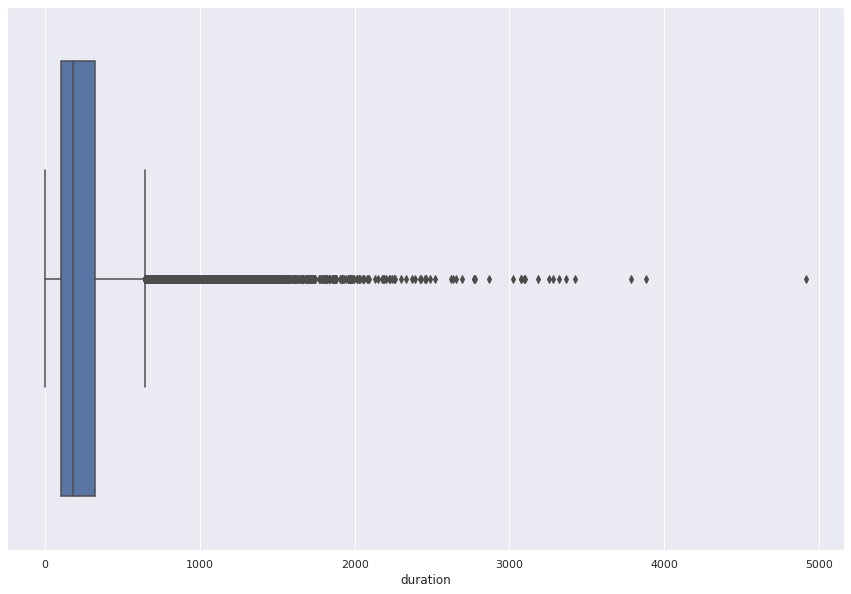

In [0]:
plt.figure(figsize=(15,10))
sns.boxplot(data['duration'])

* There are lot of outliers but as the duration increases, the client tend to subscribe term deposit

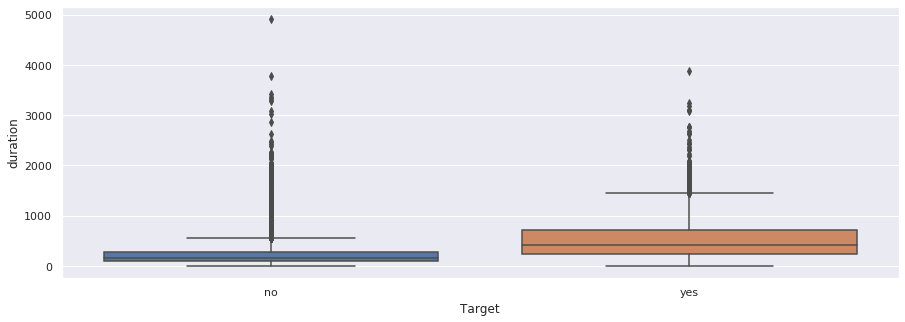

In [0]:
plt.figure(figsize=(15,5))
sns.boxplot(y=data['duration'],x=data['Target'])

Observation:
* Many outliers are there, but the higher duration lead to positive output that is subscribing to a dposit

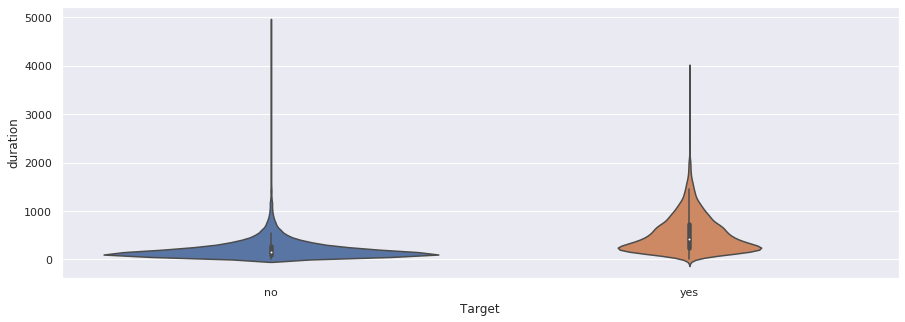

In [0]:
plt.figure(figsize=(15,5))
sns.violinplot(y=data['duration'],x=data['Target'])

Lets do statistical analysis whether time spoken to customer is related him subscribing to a term deposit or not.

Question:  Is duration related to the client subscriBING a term deposit or not. ?

In [0]:
print("Individual count of duration column: "," "*500, data['duration'].value_counts())

Individual count of duration column:                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                       124     188
90      184
89      177
122     175
104     175
       ... 
2150      1
1970      1
1906      1
1842      1
2015      1
Name: duration, Length: 1573, dtype: int64


NULL HYPOTHESIS(H0): Duration of call is not related to the client subscribing a term deposit

ALTERNATIVE HYPOTHESIS(Ha): Duration of call is related to the client subscribing a term deposit

In [0]:
# Level of significance = 0.05

In [0]:
null = 'Duration of call is not related to the client subscribing a term deposit'
alternate = 'Duration of call is related to the client subscribing a term deposit'
a=np.array(data[data['Target']=='yes'].duration)
b=np.array(data[data['Target']=='no'].duration)
t_stat, p_value = stats.ttest_ind(a,b,axis=0)
print("the caluclated value of tstatistic is",t_stat)
print("The pvalue is",p_value)
print(""*1000)
print("Based on the statistical evidence")
if p_value > 0.05:
    print("we fail to reject null hypothesis as the p_value", p_value, "is greater than 0.05")
    print(null)
else:
    print("we reject null hypothesis as the p_value", p_value, "is less than 0.05")
    print(alternate)

the caluclated value of tstatistic is 91.28943612670862
The pvalue is 0.0

Based on the statistical evidence
we reject null hypothesis as the p_value 0.0 is less than 0.05
Duration of call is related to the client subscribing a term deposit


# 3.3.13 Campaign

This column is about number of contacts performed during this campaign 

In [0]:
print("The 5 point summary of campaign column would give the below results: ")
data['campaign'].describe().T

The 5 point summary of campaign column would give the below results: 


count    45211.000000
mean         2.763841
std          3.098021
min          1.000000
25%          1.000000
50%          2.000000
75%          3.000000
max         63.000000
Name: campaign, dtype: float64

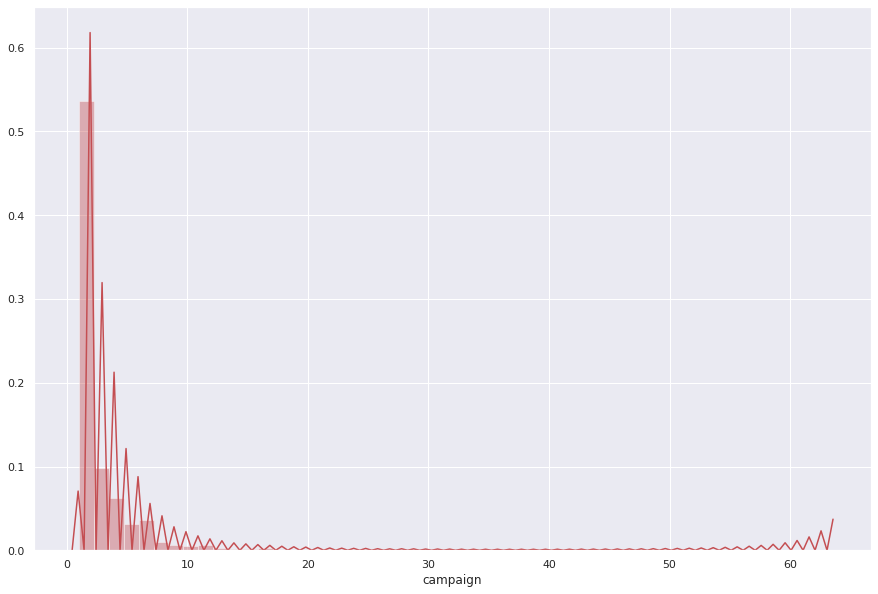

In [0]:
plt.figure(figsize=(15,10))
sns.set_color_codes()
ax = sns.distplot(data['campaign'], color="r")

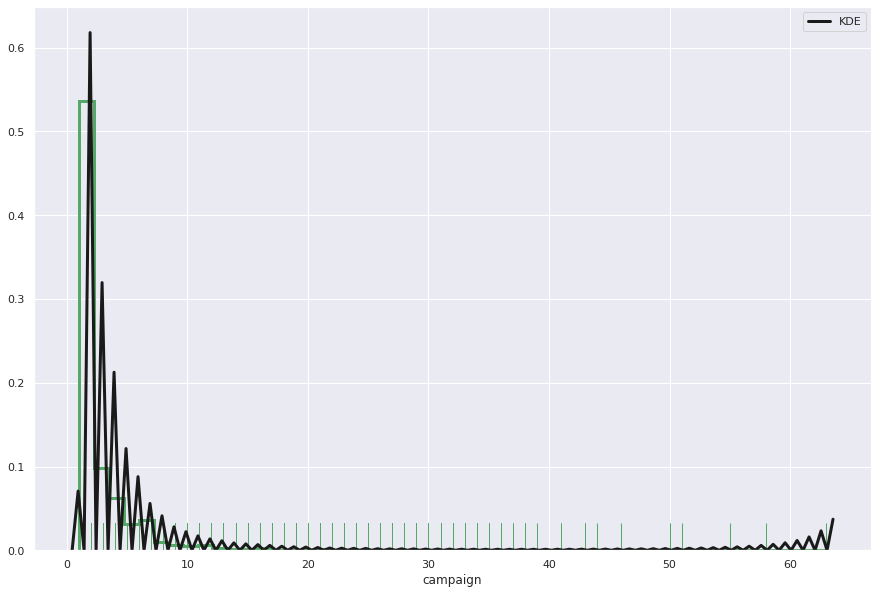

In [0]:
plt.figure(figsize=(15,10))
ax = sns.distplot(data['campaign'], rug=True, rug_kws={"color": "g"},
                  kde_kws={"color": "k", "lw": 3, "label": "KDE"},
                  hist_kws={"histtype": "step", "linewidth": 3,
                            "alpha": 1, "color": "g"})

Looking for outliers in campaign column

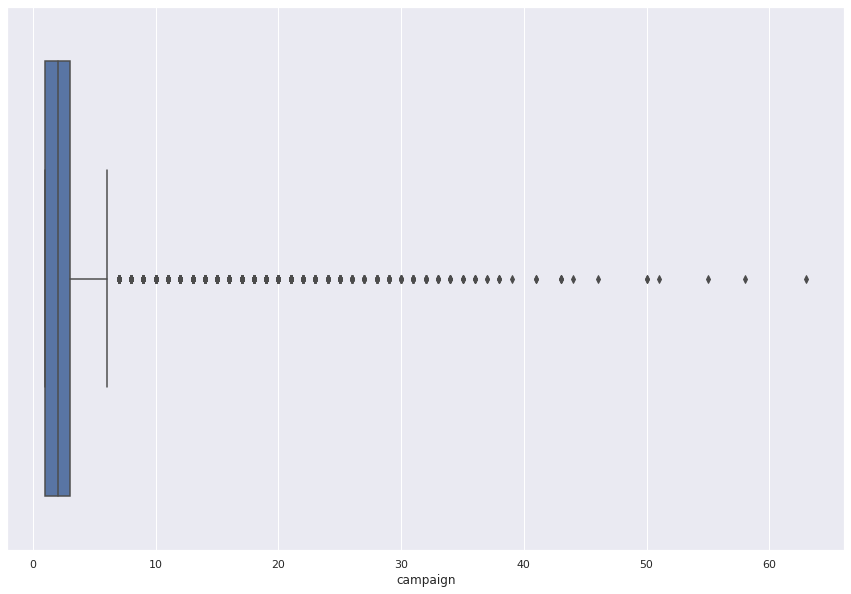

In [0]:
plt.figure(figsize=(15,10))
sns.boxplot(data['campaign'])

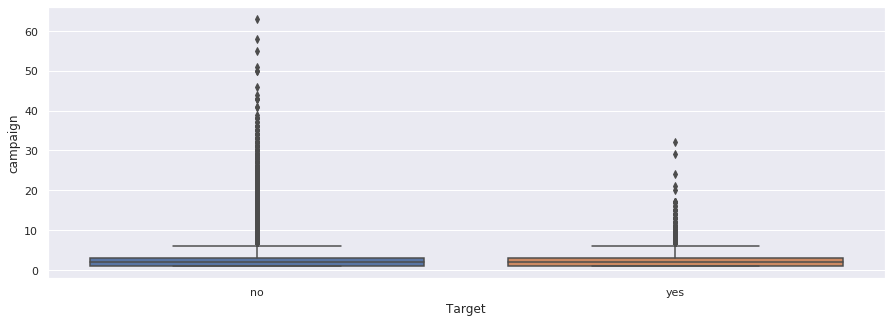

In [0]:
plt.figure(figsize=(15,5))
sns.boxplot(y=data['campaign'],x=data['Target'])

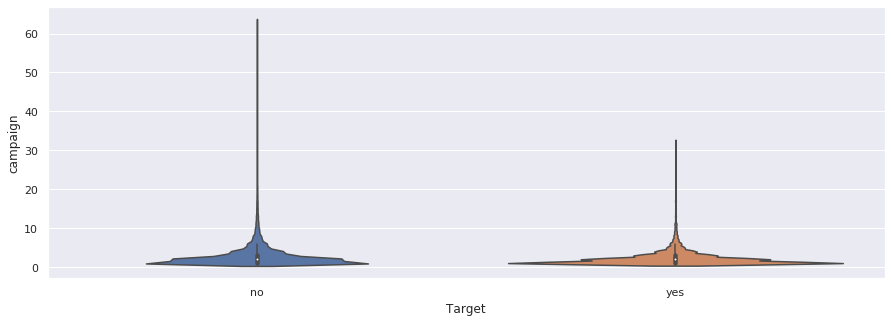

In [0]:
plt.figure(figsize=(15,5))
sns.violinplot(y=data['campaign'],x=data['Target'])

Observation:
* Higher campaign lead to less chance of client subscribing to a deposit

Lets do statistical analysis whether number of times spoken to customer is related him subscribing to a term deposit or not.

Question:  Is number of times contacted related to the client subscriBING a term deposit or not. ?

In [0]:
print("Individual count of campaign column: "," "*500, data['campaign'].value_counts())

Individual count of campaign column:                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                       1     17544
2     12505
3      5521
4      3522
5      1764
6      1291
7       735
8       540
9       327
10      266
11      201
12      155
13      133
14       93
15       84
16       79
17       69
18       51
19       44
20       43
21       35
22       23
23       22
25       22
24       20
28       16
29       16
26       13
31       12
27       10
32        9
30        8
33        6
34        5
36        4
35        4
43        3
38        3
41   

NULL HYPOTHESIS(H0): Number of times contacted is not related to him subscribing a term deposit

ALTERNATIVE HYPOTHESIS(Ha): Number of times contacted is related to him subscribing a term deposit

In [0]:
# Level of significance = 0.05

In [0]:
null = 'Number of times contacted is not related to him subscribing a term deposit'
alternate = 'Number of times contacted is related to him subscribing a term deposit'
a=np.array(data[data['Target']=='yes'].campaign)
b=np.array(data[data['Target']=='no'].campaign)
t_stat, p_value = stats.ttest_ind(a,b,axis=0)
print("the caluclated value of tstatistic is",t_stat)
print("The pvalue is",p_value)
print(""*1000)
print("Based on the statistical evidence")
if p_value > 0.05:
    print("we fail to reject null hypothesis as the p_value", p_value, "is greater than 0.05")
    print(null)
else:
    print("we reject null hypothesis as the p_value", p_value, "is less than 0.05")
    print(alternate)

the caluclated value of tstatistic is -15.599948860003781
The pvalue is 1.0123473642096297e-54

Based on the statistical evidence
we reject null hypothesis as the p_value 1.0123473642096297e-54 is less than 0.05
Number of times contacted is related to him subscribing a term deposit


# 3.3.14 pday

number of days that passed by after the client was last contacted from a
previous campaign

 (numeric; 999 means client was not previously contacted)

In [0]:
data[data['pdays']==999]

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target


* No rows with 999 pdays value

# 3.3.15 Previous

In [0]:
print("Unique values of previous column:", '\n',data['previous'].unique())

Unique values of previous column: 
 [  0   3   1   4   2  11  16   6   5  10  12   7  18   9  21   8  14  15
  26  37  13  25  20  27  17  23  38  29  24  51 275  22  19  30  58  28
  32  40  55  35  41]


In [0]:
print("Individual count of previous column: "," "*500, data['previous'].value_counts())

Individual count of previous column:                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                       0      36954
1       2772
2       2106
3       1142
4        714
5        459
6        277
7        205
8        129
9         92
10        67
11        65
12        44
13        38
15        20
14        19
17        15
16        13
19        11
23         8
20         8
22         6
18         6
24         5
27         5
29         4
25         4
21         4
30         3
28         2
26         2
37         2
38         2
55         1
40         1
35    

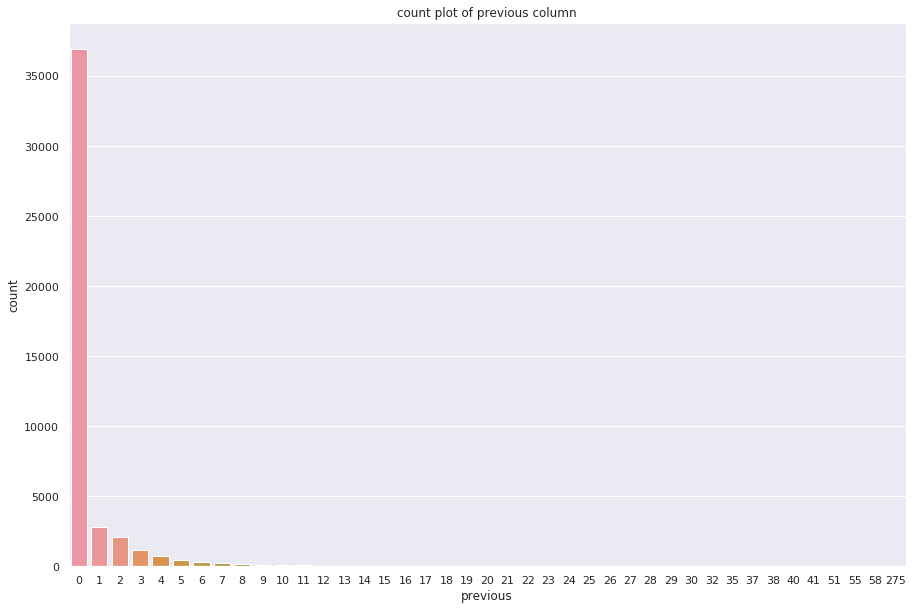

In [0]:
plt.figure(figsize=(15,10))
plt.title("count plot of previous column")
sns.countplot(data['previous'])

In [0]:
print("Individual count of previous column who subscribed to term deposit: ")
data[data['Target']=='yes'].previous.value_counts()

Individual count of previous column who subscribed to term deposit: 


0     3384
1      583
2      456
3      294
4      171
5      121
6       83
7       54
8       39
10      26
9       24
11      15
12      10
13       9
14       5
17       3
19       2
20       1
15       1
58       1
30       1
21       1
29       1
23       1
22       1
26       1
55       1
Name: previous, dtype: int64

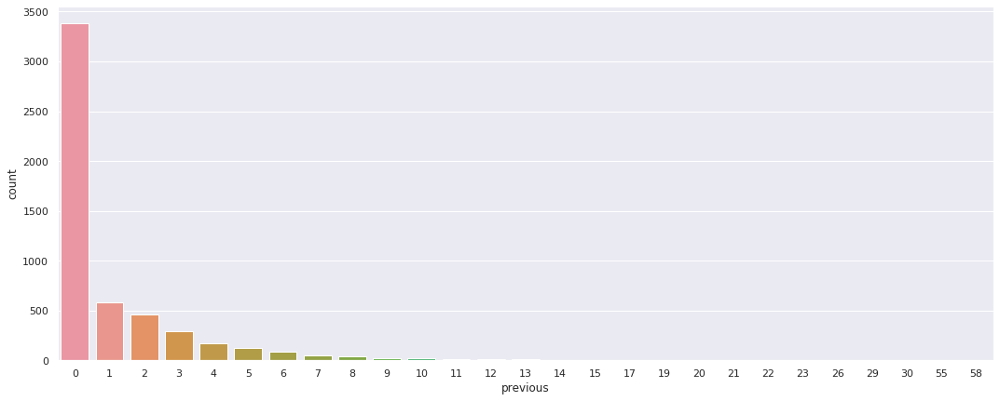

In [0]:
plt.figure(figsize=(18,7))
sns.countplot(data[data['Target']=='yes'].previous)

In [0]:
print("Individual count of previous column who did not subscribed to term deposit: ")
data[data['Target']=='no'].previous.value_counts()

Individual count of previous column who did not subscribed to term deposit: 


0      33570
1       2189
2       1650
3        848
4        543
5        338
6        194
7        151
8         90
9         68
11        50
10        41
12        34
13        29
15        19
14        14
16        13
17        12
19         9
23         7
20         7
18         6
27         5
24         5
22         5
25         4
21         3
29         3
38         2
37         2
28         2
30         2
40         1
41         1
275        1
51         1
35         1
26         1
32         1
Name: previous, dtype: int64

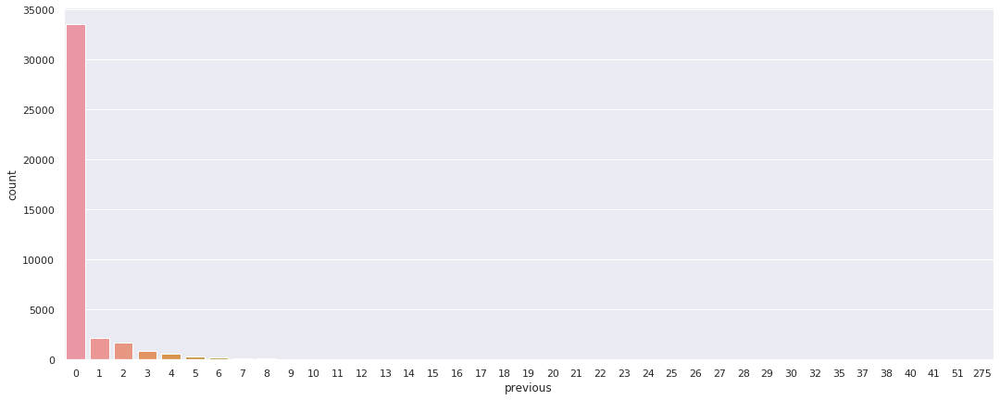

In [0]:
plt.figure(figsize=(18,7))
sns.countplot(data[data['Target']=='no'].previous)

Lets do statistical analysis whether no of previous contacts with the customer is related to the client subscribed a term deposit or not.

Question:  Is no of previous contacts with the customer related to the client subscriBING a term deposit or not. ?

NULL HYPOTHESIS(H0):no of previous contacts with the customer is not related to the client subscribing a term deposit

ALTERNATIVE HYPOTHESIS(Ha): no of previous contacts with the customer is related to the client subscribing a term deposit

In [0]:
# Level of significance = 0.05

In [0]:
import numpy as np
import pandas as pd
s = pd.crosstab(data.previous, data.Target, margins = False)
print(s)

Target       no   yes
previous             
0         33570  3384
1          2189   583
2          1650   456
3           848   294
4           543   171
5           338   121
6           194    83
7           151    54
8            90    39
9            68    24
10           41    26
11           50    15
12           34    10
13           29     9
14           14     5
15           19     1
16           13     0
17           12     3
18            6     0
19            9     2
20            7     1
21            3     1
22            5     1
23            7     1
24            5     0
25            4     0
26            1     1
27            5     0
28            2     0
29            3     1
30            2     1
32            1     0
35            1     0
37            2     0
38            2     0
40            1     0
41            1     0
51            1     0
55            0     1
58            0     1
275           1     0


In [0]:
# contingency table
table = s
print("Contingency table:")
print(table)
stat, p, dof, expected = chi2_contingency(table)
print('dof=%d' % dof)
print("Note : dof = (rows-1)*(cols-1)  = (41-1)*(2-1)")
print(expected)

Contingency table:
Target       no   yes
previous             
0         33570  3384
1          2189   583
2          1650   456
3           848   294
4           543   171
5           338   121
6           194    83
7           151    54
8            90    39
9            68    24
10           41    26
11           50    15
12           34    10
13           29     9
14           14     5
15           19     1
16           13     0
17           12     3
18            6     0
19            9     2
20            7     1
21            3     1
22            5     1
23            7     1
24            5     0
25            4     0
26            1     1
27            5     0
28            2     0
29            3     1
30            2     1
32            1     0
35            1     0
37            2     0
38            2     0
40            1     0
41            1     0
51            1     0
55            0     1
58            0     1
275           1     0
dof=40
Note : dof = (rows-1)*(cols-

In [0]:
# interpret test-statistic
null = 'no of previous contacts with the customer is not related to the client subscribing a term deposit'
alternate = 'no of previous contacts with the customer is related to the client subscribing a term deposit'
prob = 0.95
critical = chi2.ppf(prob, dof)
print('probability=%.3f, critical=%.3f, stat=%.3f' % (prob, critical, stat))
if abs(stat) >= critical:
    print('Dependent (reject H0)')
    print(alternate)
else:
    print('Independent (fail to reject H0)')
    print(null)

probability=0.950, critical=55.758, stat=1376.795
Dependent (reject H0)
no of previous contacts with the customer is related to the client subscribing a term deposit


In [0]:
# interpret p-value
alpha = 1.0 - prob
print('significance=%.3f, p=%.3f' % (alpha, p))
if p <= alpha:
    print('Dependent (reject H0)')
    print(alternate)
else:
    print('Independent (fail to reject H0)')
    print(null)

significance=0.050, p=0.000
Dependent (reject H0)
no of previous contacts with the customer is related to the client subscribing a term deposit


# 3.3.16 poutcome

This column is about previous outcome

In [0]:
print("Unique values of previous outcome column:", '\n',data['poutcome'].unique())

Unique values of previous outcome column: 
 ['unknown' 'failure' 'other' 'success']


In [0]:
print("Individual count of previous outcome column: ")
data['poutcome'].value_counts()

Individual count of previous outcome column: 


unknown    36959
failure     4901
other       1840
success     1511
Name: poutcome, dtype: int64

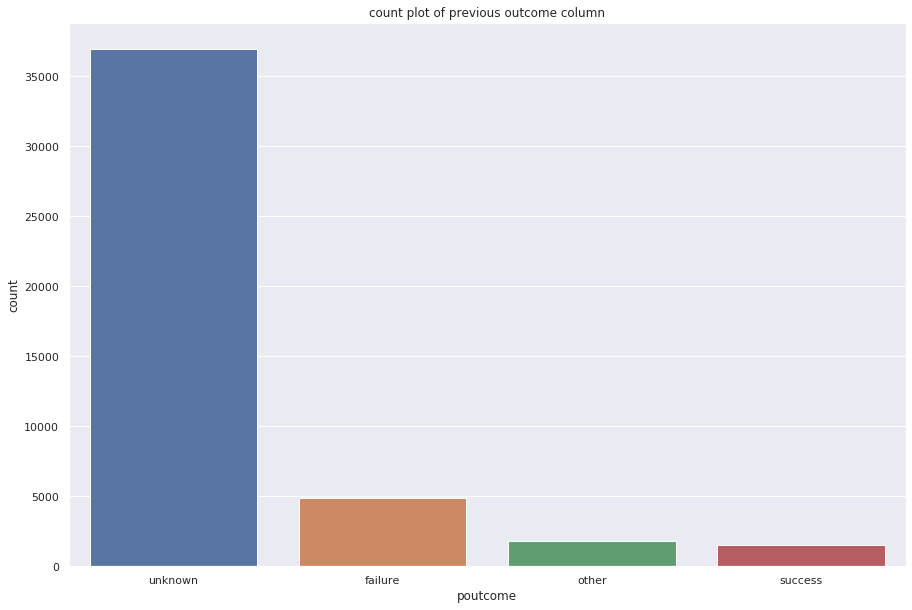

In [0]:
plt.figure(figsize=(15,10))
plt.title("count plot of previous outcome column")
sns.countplot(data['poutcome'])

In [0]:
print("Individual count of previous outcome column who subscribed to term deposit: ")
data[data['Target']=='yes'].poutcome.value_counts()

Individual count of previous outcome column who subscribed to term deposit: 


unknown    3386
success     978
failure     618
other       307
Name: poutcome, dtype: int64

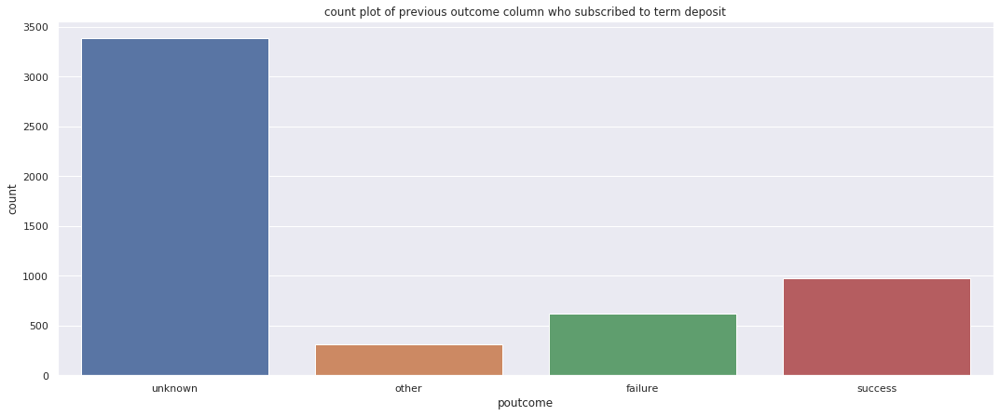

In [0]:
plt.figure(figsize=(18,7))
plt.title("count plot of previous outcome column who subscribed to term deposit")
sns.countplot(data[data['Target']=='yes'].poutcome)

In [0]:
print("Individual count of previous outcome column who did not subscribed to term deposit: ")
data[data['Target']=='no'].poutcome.value_counts()

Individual count of previous outcome column who did not subscribed to term deposit: 


unknown    33573
failure     4283
other       1533
success      533
Name: poutcome, dtype: int64

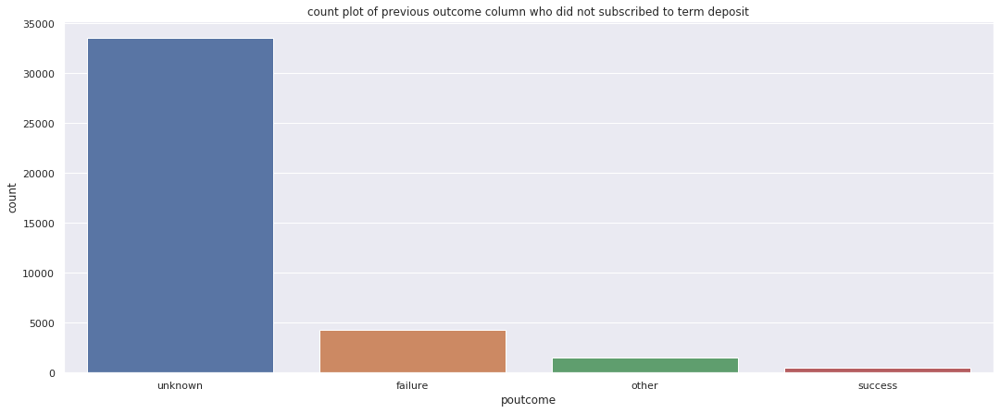

In [0]:
plt.figure(figsize=(18,7))
plt.title("count plot of previous outcome column who did not subscribed to term deposit")
sns.countplot(data[data['Target']=='no'].poutcome)

Lets do statistical analysis whether outcome of the previous marketting campaign is related to the client subscribed a term deposit or not.

Question:  Is outcome of the previous marketting campaign related to the client subscriBING a term deposit or not. ?

NULL HYPOTHESIS(H0): outcome of the previous marketting campaign is not related to the client subscribing a term deposit

ALTERNATIVE HYPOTHESIS(Ha): outcome of the previous marketting campaign is related to the client subscribing a term deposit

In [0]:
# Level of significance = 0.05

In [0]:
import numpy as np
import pandas as pd
s = pd.crosstab(data.poutcome, data.Target, margins = False)
print(s)

Target       no   yes
poutcome             
failure    4283   618
other      1533   307
success     533   978
unknown   33573  3386


In [0]:
# contingency table
table = s
print("Contingency table:")
print(table)
stat, p, dof, expected = chi2_contingency(table)
print('dof=%d' % dof)
print("Note : dof = (rows-1)*(cols-1)  = (4-1)*(2-1)")
print(expected)

Contingency table:
Target       no   yes
poutcome             
failure    4283   618
other      1533   307
success     533   978
unknown   33573  3386
dof=3
Note : dof = (rows-1)*(cols-1)  = (4-1)*(2-1)
[[ 4327.65747274   573.34252726]
 [ 1624.74795957   215.25204043]
 [ 1334.23596028   176.76403972]
 [32635.35860742  4323.64139258]]


In [0]:
# interpret test-statistic
null = 'outcome of the previous marketting campaign is not related to the client subscribing a term deposit'
alternate = 'outcome of the previous marketting campaign is related to the client subscribing a term deposit'
prob = 0.95
critical = chi2.ppf(prob, dof)
print('probability=%.3f, critical=%.3f, stat=%.3f' % (prob, critical, stat))
if abs(stat) >= critical:
    print('Dependent (reject H0)')
    print(alternate)
else:
    print('Independent (fail to reject H0)')
    print(null)

probability=0.950, critical=7.815, stat=4391.507
Dependent (reject H0)
outcome of the previous marketting campaign is related to the client subscribing a term deposit


In [0]:
# interpret p-value
alpha = 1.0 - prob
print('significance=%.3f, p=%.3f' % (alpha, p))
if p <= alpha:
    print('Dependent (reject H0)')
    print(alternate)
else:
    print('Independent (fail to reject H0)')
    print(null)

significance=0.050, p=0.000
Dependent (reject H0)
outcome of the previous marketting campaign is related to the client subscribing a term deposit


# 3.3.17 Target

This is the column which we need to predict

column is about whether the customer has subscribe to a term deposit or not

In [0]:
print("The 5 point summary of Target column would give the below results: ")
data['Target'].describe()

The 5 point summary of Target column would give the below results: 


count     45211
unique        2
top          no
freq      39922
Name: Target, dtype: object

In [0]:
print("The cont of each:")
print(data['Target'].value_counts())

The cont of each:
no     39922
yes     5289
Name: Target, dtype: int64


Observation:
* Most of them have not subscibed to term deposit and this can be better visualized in Count plot below
* There is an imbalance in the dataset

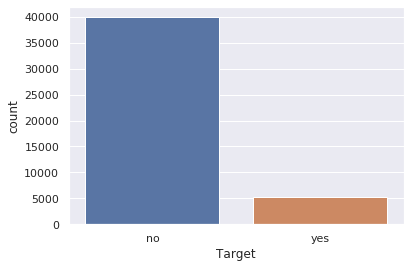

In [0]:
sns.countplot(data['Target'])

# 3.5 Bivariate Analysis

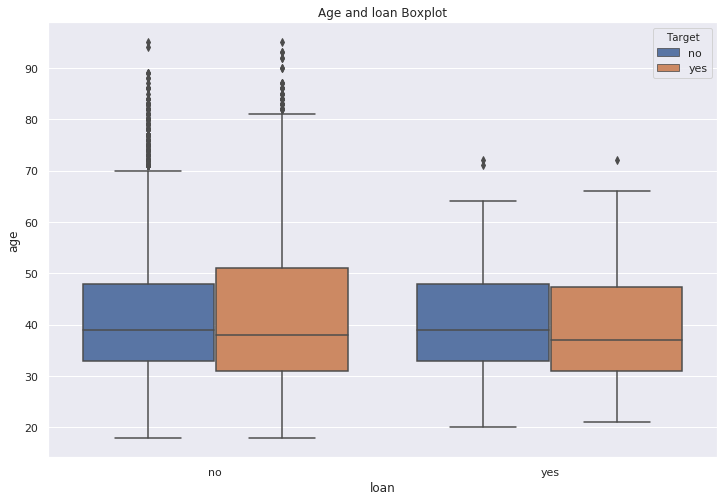

In [0]:
#age and loan Boxplot
plt.figure(figsize=(12,8))
plt.title('Age and loan Boxplot')
sns.boxplot(x='loan',y='age',data=data,hue='Target')

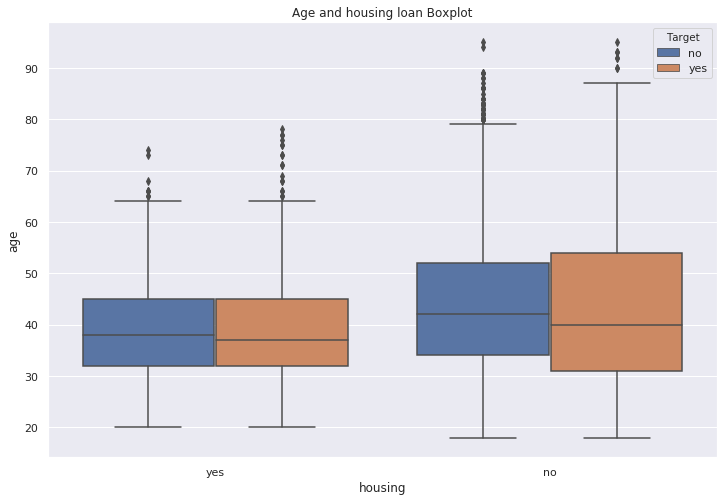

In [0]:
#age and housing loan Boxplot
plt.figure(figsize=(12,8))
plt.title('Age and housing loan Boxplot')
sns.boxplot(x='housing',y='age',data=data,hue='Target')

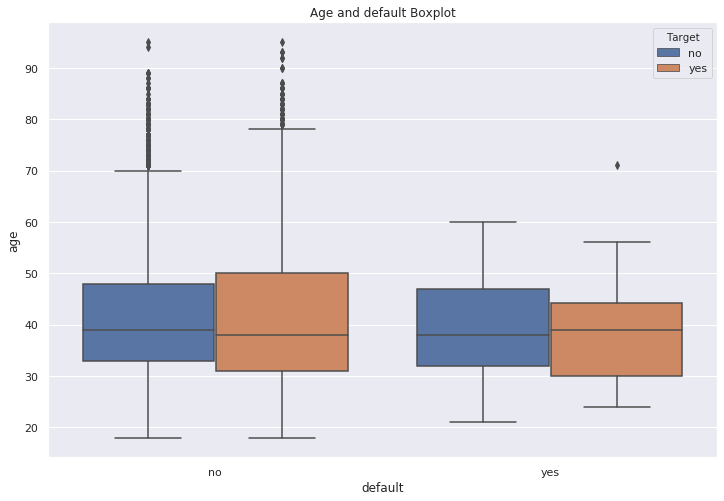

In [0]:
#age and default Boxplot
plt.figure(figsize=(12,8))
plt.title('Age and default Boxplot')
sns.boxplot(x='default',y='age',data=data,hue='Target')

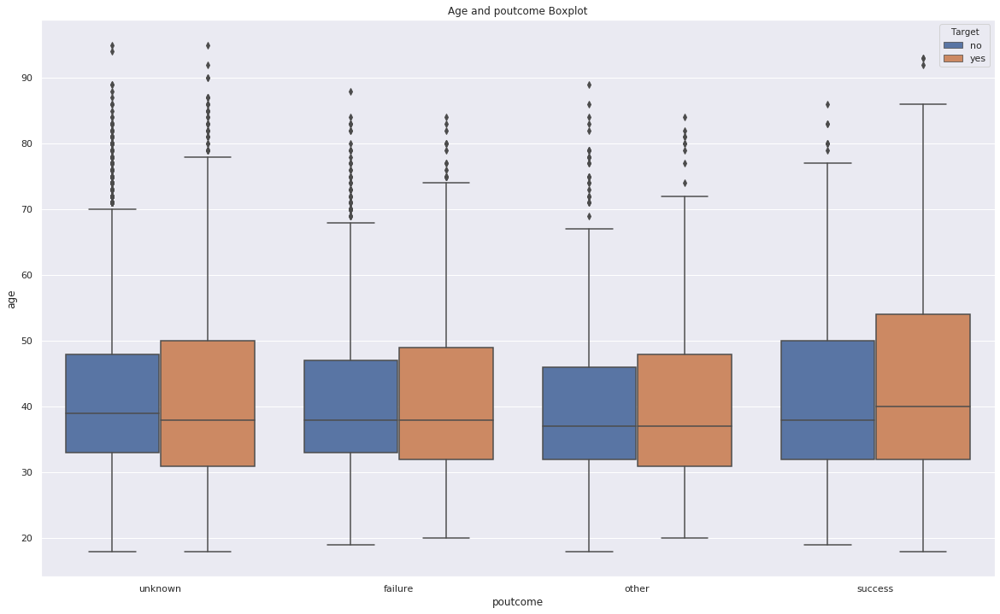

In [0]:
#age and poutcome Boxplot
plt.figure(figsize=(20,12))
plt.title('Age and poutcome Boxplot')
sns.boxplot(x='poutcome',y='age',data=data,hue='Target')

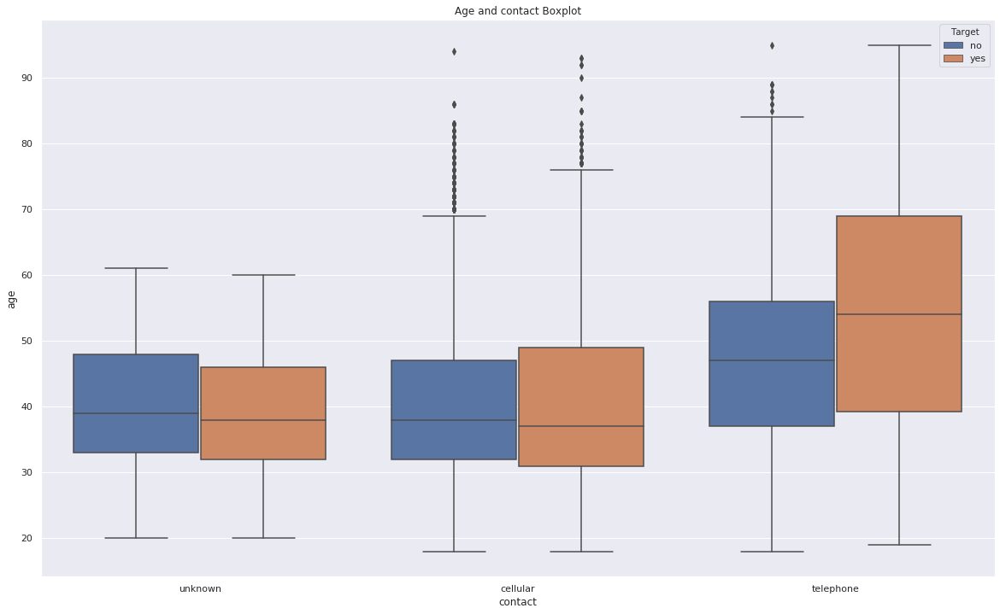

In [0]:
#age and contact Boxplot
plt.figure(figsize=(20,12))
plt.title('Age and contact Boxplot')
sns.boxplot(x='contact',y='age',data=data,hue='Target')

Observation: 
* Highly aged people are contacted mostly through telephone

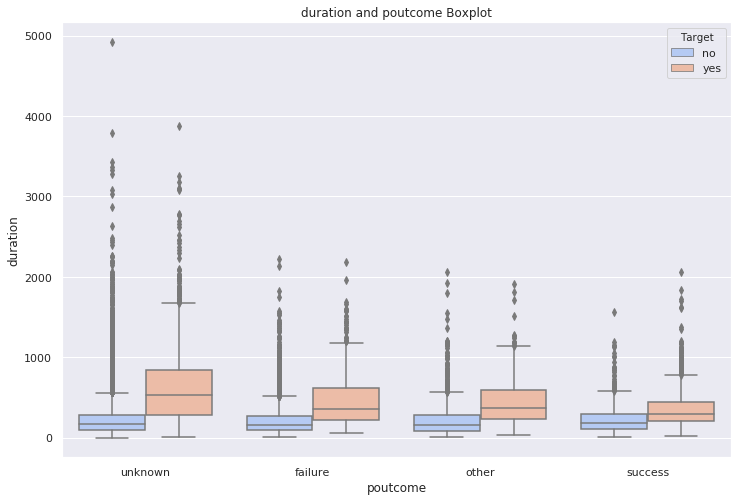

In [0]:
#age and housing loan Boxplot
plt.figure(figsize=(12,8))
plt.title('duration and poutcome Boxplot')
sns.boxplot(x="poutcome",y="duration",hue="Target",data=data, palette="coolwarm")

Observation: 
* As we can see there higher duration time for the clients who subscribed to term deposit for all previous outcomes

# 3.6 LABEL ENCODING OF CATEGORICAL VARIABLES

In [0]:
cat=['job','marital','education','default','housing','loan','contact','month','poutcome','Target']
# Import label encoder 
from sklearn import preprocessing 
  
# label_encoder object knows how to understand word labels. 
label_encoder = preprocessing.LabelEncoder() 
for i in cat:
    # Encode labels for categorical variables. 
    data[i]= label_encoder.fit_transform(data[i]) 

# 3.7 CORELATION MATRIX

In [0]:
data.corr()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target
age,1.000000,-0.021868,-0.403240,-0.106807,-0.017879,0.097783,-0.185513,-0.015655,0.026221,-0.009120,-0.042357,-0.004648,0.004760,-0.023758,0.001288,0.007367,0.025155
job,-0.021868,1.000000,0.062045,0.166707,-0.006853,0.018232,-0.125363,-0.033004,-0.082063,0.022856,-0.092870,0.004744,0.006839,-0.024455,-0.000911,0.011010,0.040438
marital,-0.403240,0.062045,1.000000,0.108576,-0.007023,0.002122,-0.016096,-0.046893,-0.039201,-0.005261,-0.006991,0.011852,-0.008994,0.019172,0.014973,-0.016850,0.045588
education,-0.106807,0.166707,0.108576,1.000000,-0.010718,0.064514,-0.090790,-0.048574,-0.110928,0.022671,-0.057304,0.001935,0.006255,0.000052,0.017570,-0.019361,0.066241
default,-0.017879,-0.006853,-0.007023,-0.010718,1.000000,-0.066745,-0.006025,0.077234,0.015404,0.009424,0.011486,-0.010021,0.016822,-0.029979,-0.018329,0.034898,-0.022419
balance,0.097783,0.018232,0.002122,0.064514,-0.066745,1.000000,-0.068768,-0.084350,-0.027273,0.004503,0.019777,0.021560,-0.014578,0.003435,0.016674,-0.020967,0.052838
housing,-0.185513,-0.125363,-0.016096,-0.090790,-0.006025,-0.068768,1.000000,0.041323,0.188123,-0.027982,0.271481,0.005075,-0.023599,0.124178,0.037076,-0.099971,-0.139173
loan,-0.015655,-0.033004,-0.046893,-0.048574,0.077234,-0.084350,0.041323,1.000000,-0.010873,0.011370,0.022145,-0.012412,0.009980,-0.022754,-0.011043,0.015458,-0.068185
contact,0.026221,-0.082063,-0.039201,-0.110928,0.015404,-0.027273,0.188123,-0.010873,1.000000,-0.027936,0.361145,-0.020839,0.019614,-0.244816,-0.147811,0.272214,-0.148395
day,-0.009120,0.022856,-0.005261,0.022671,0.009424,0.004503,-0.027982,0.011370,-0.027936,1.000000,-0.006028,-0.030206,0.162490,-0.093044,-0.051710,0.083460,-0.028348


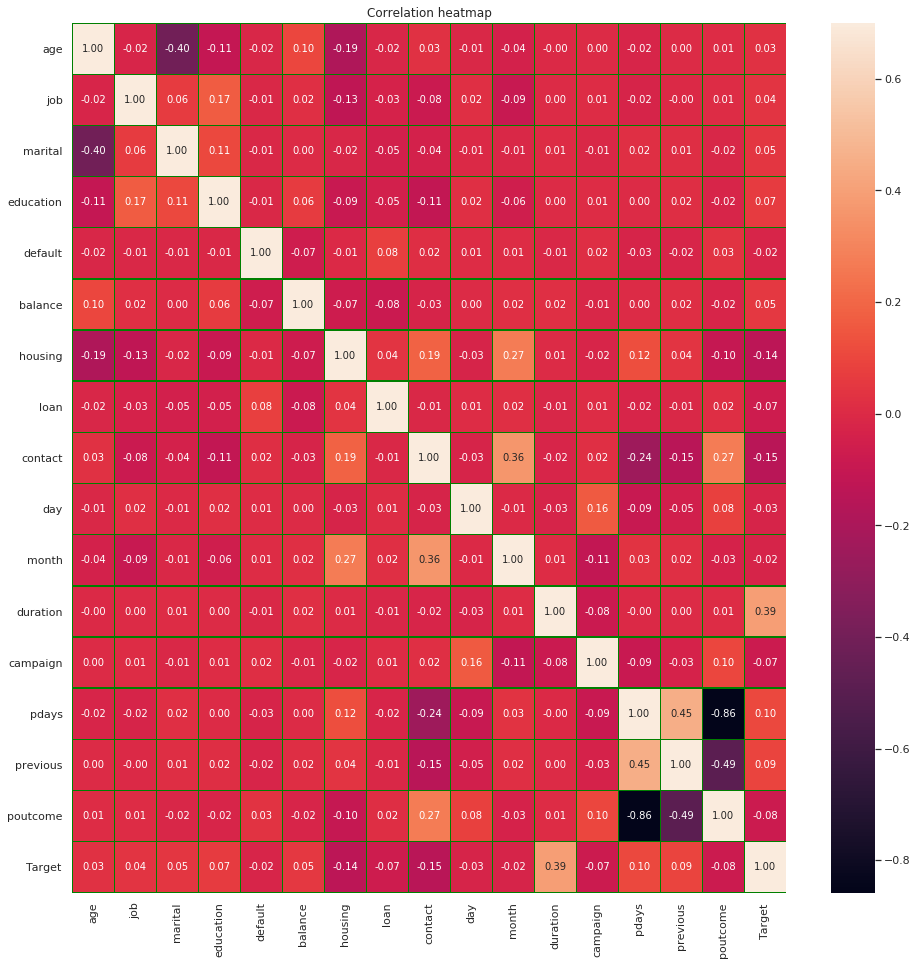

In [0]:
from matplotlib import pyplot as plt
plt.figure(figsize=(16,16))
ax = sns.heatmap(data.corr(), vmax=.7, square=False, fmt='.2f', annot=True, linecolor='green', linewidths=0.4)
plt.title('Correlation heatmap')
plt.show()

Observation:
* Housing is corelated to some extent with many of the attributes
* There is some corelation between campaign and day
* There is relatively high corelation between pdays and previous column
* poutcome and pdays colums are high negatively corelated
* previous and poutcome are relatively high in negative corelation
* age and marital are relatively high in negative corelation
* Duration is comparably correlated with Target that is higher duration of contact leads to the client subscribing to term deposit

# 4. GETTING THE TARGET COLUMN

In [0]:
#Normalizing the data
cols_to_norm = ['age','balance','duration']
data[cols_to_norm]=data[cols_to_norm].apply(lambda x: (x - x.min()) / (x.max() - x.min()))

In [0]:
X = data.drop(['Target'],axis=1)     # Predictor feature columns 
Y = data['Target']   # Predicted class 

# 4.1 Checking for imbalance and whether data types are appropriate or not:

There is an imbalance in the dataset. As the count of those who subscribed to deposit is less when compared with ones who did not

In [0]:
data['Target'].value_counts()

0    39922
1     5289
Name: Target, dtype: int64

In [0]:
# 0 - who did not subscribe to term deposit
# 1 - who did subscribe to term deposit

* Data is all good for passinf into machine learning models

In [0]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
age          45211 non-null float64
job          45211 non-null int64
marital      45211 non-null int64
education    45211 non-null int64
default      45211 non-null int64
balance      45211 non-null float64
housing      45211 non-null int64
loan         45211 non-null int64
contact      45211 non-null int64
day          45211 non-null int64
month        45211 non-null int64
duration     45211 non-null float64
campaign     45211 non-null int64
pdays        45211 non-null int64
previous     45211 non-null int64
poutcome     45211 non-null int64
Target       45211 non-null int64
dtypes: float64(3), int64(14)
memory usage: 5.9 MB


# 5. SPLITTING THE DATA INTO TRAIN AND TEST

In [0]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=42)
# 1 is just any random seed number
x_train.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome
10747,0.233766,9,2,2,0,0.072803,0,0,2,17,6,0.031110,4,-1,0,3
26054,0.493506,2,1,1,0,0.074583,0,0,0,19,9,0.063440,3,-1,0,3
9125,0.363636,1,1,1,0,0.072803,1,0,2,5,6,0.016877,2,-1,0,3
41659,0.298701,4,0,2,0,0.103908,0,0,0,1,10,0.061407,1,119,5,2
4443,0.259740,1,1,1,0,0.072803,1,0,2,20,8,0.018300,1,-1,0,3


# 6. MACHINE LEARNING MODELS USING LABEL ENCODING

In [0]:
# the below function is used so as to print heat map of confusion matrix and roc curve
def print_confusion_matrix(y_true, y_pred):
    from sklearn.metrics import roc_curve, auc
    print("Confusion Matrix")
    cm=metrics.confusion_matrix(y_test, y_pred)
    print(cm)
    df_cm = pd.DataFrame(cm)
    plt.figure(figsize = (6,6))
    sns.heatmap(df_cm, annot=True,fmt='g')
    plt.show()
    print('True negative = ', cm[0][0])
    print('False negative = ', cm[0][1])
    print('False positive = ', cm[1][0])
    print('True positive = ', cm[1][1])
    print(" "*100)
    print(" "*100)
    fpr, tpr, thresholds = roc_curve(y_test, y_pred)
    roc_auc = auc(fpr,tpr)
    # Plot ROC
    plt.title('Receiver Operating Characteristic')
    plt.plot(fpr, tpr, 'b',label='AUC = %0.3f'% roc_auc)
    plt.legend(loc='lower right')
    plt.plot([0,1],[0,1],'r--')
    plt.xlim([-0.1,1.0])
    plt.ylim([-0.1,1.01])
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.show()
    print(" "*100)

    print("auc:", roc_auc)

# 6.1 Machine Learning Models Before Upsampling ( LABEL ENCODED FOR CATEGORICAL VARIABLES)

# 6.1.1 KNN

In [0]:
leaf_size = [30,40]
n_neighbors = [1,5,21,51,101]
#Power parameter for the Minkowski metric ----p
p=[1,2]
#Convert to dictionary
hyperparameters = dict(leaf_size=leaf_size, n_neighbors=n_neighbors, p=p)
#Create new KNN object
knn = KNeighborsClassifier()
#Use GridSearch
clf = GridSearchCV(knn, hyperparameters, cv=3)
#Fit the model
model = clf.fit(x_train,y_train)
print('Best leaf_size:', model.best_estimator_.get_params()['leaf_size'])
print('Best p:', model.best_estimator_.get_params()['p'])
print('Best n_neighbors:', model.best_estimator_.get_params()['n_neighbors'])

Best leaf_size: 30
Best p: 1
Best n_neighbors: 51


# Fitting with the best Parameters

In [0]:
from sklearn.metrics import roc_curve, auc
k=model.best_estimator_.get_params()['n_neighbors']
l=model.best_estimator_.get_params()['leaf_size']
P=model.best_estimator_.get_params()['p']
knn=KNeighborsClassifier(n_neighbors=P,leaf_size=l,p=P)
knn.fit(x_train,y_train)
predicted_labels = knn.predict(x_test)
knn.score(x_test, y_test)
print("Accuracy: ",knn.score(x_test, y_test))
print(" "*100)

Accuracy:  0.8600707755824241
                                                                                                    


Confusion Matrix
[[11170   796]
 [ 1102   496]]


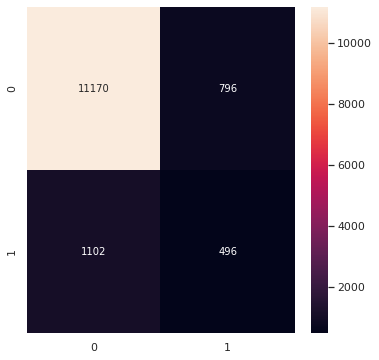

True negative =  11170
False negative =  796
False positive =  1102
True positive =  496
                                                                                                    
                                                                                                    


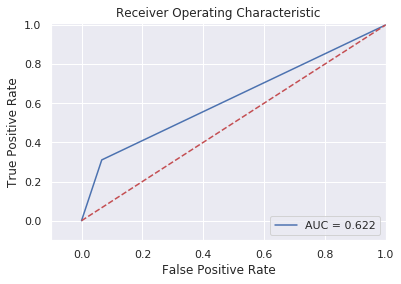

                                                                                                    
auc: 0.6219330865905631


In [0]:
print_confusion_matrix(y_test, predicted_labels)

In [0]:
target_names = ['class 0', 'class 1']
print(" "*100)
print("classification report for test data:")
print(classification_report(y_test, predicted_labels, target_names=target_names))

                                                                                                    
classification report for test data:
              precision    recall  f1-score   support

     class 0       0.91      0.93      0.92     11966
     class 1       0.38      0.31      0.34      1598

    accuracy                           0.86     13564
   macro avg       0.65      0.62      0.63     13564
weighted avg       0.85      0.86      0.85     13564



# 6.1.2 Logistic Regression

In [0]:
C=[0.01, 0.1, 1, 5,10, 20, 30]
penalty=['l2','l1']
hyperparameters=dict(C=C, penalty=penalty)
lr=LogisticRegression()
clf = GridSearchCV(lr, hyperparameters, cv=3, verbose=0)
best_model=clf.fit(x_train,y_train)
# View best hyperparameters
print('Best Penalty:', best_model.best_estimator_.get_params()['penalty'])
print('Best C:', best_model.best_estimator_.get_params()['C'])
best_penalty=best_model.best_estimator_.get_params()['penalty']
best_c=best_model.best_estimator_.get_params()['C']

Best Penalty: l2
Best C: 0.01


# Fitting with the best Parameters

In [0]:
lr=LogisticRegression(C=best_c,penalty=best_penalty)
lr.fit(x_train,y_train)

predicted_labels = lr.predict(x_test)
lr.score(x_test, y_test)
print("Accuracy: ",lr.score(x_test, y_test))
print(" "*100)


Accuracy:  0.8821881450899439
                                                                                                    


Confusion Matrix
[[11964     2]
 [ 1596     2]]


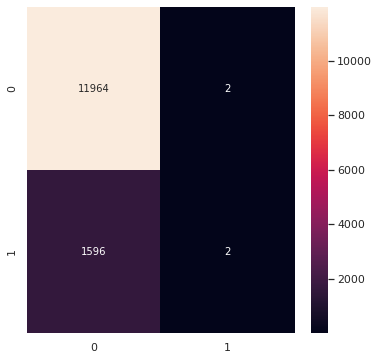

True negative =  11964
False negative =  2
False positive =  1596
True positive =  2
                                                                                                    
                                                                                                    


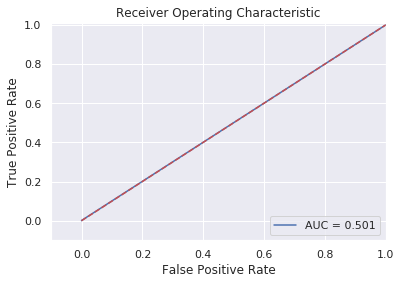

                                                                                                    
auc: 0.500542212112458


In [0]:
print_confusion_matrix(y_test, predicted_labels)


In [0]:
target_names = ['class 0', 'class 1']
print(" "*100)
print("classification report for test data:")
print(classification_report(y_test, predicted_labels, target_names=target_names))

                                                                                                    
classification report for test data:
              precision    recall  f1-score   support

     class 0       0.88      1.00      0.94     11966
     class 1       0.50      0.00      0.00      1598

    accuracy                           0.88     13564
   macro avg       0.69      0.50      0.47     13564
weighted avg       0.84      0.88      0.83     13564



# 6.1.3 Naive Bayes

In [0]:
gnb = GaussianNB()
gnb.fit(x_train,y_train)
predicted_labels=gnb.predict(x_test)
print("Accuracy: ",gnb.score(x_test, y_test))
print(" "*100)
print("Number of mislabeled points out of a total %d points : %d"
       % (x_test.shape[0], (y_test != predicted_labels).sum()))
print(" "*100)


Accuracy:  0.8278531406664701
                                                                                                    
Number of mislabeled points out of a total 13564 points : 2335
                                                                                                    


Confusion Matrix
[[10475  1491]
 [  844   754]]


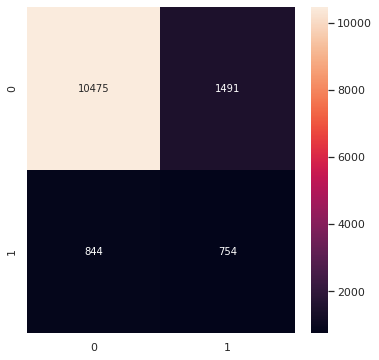

True negative =  10475
False negative =  1491
False positive =  844
True positive =  754
                                                                                                    
                                                                                                    


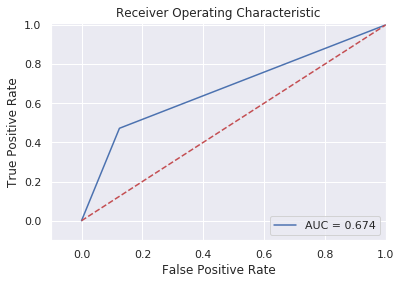

                                                                                                    
auc: 0.6736183788987447


In [0]:
print_confusion_matrix(y_test, predicted_labels)


In [0]:
target_names = ['class 0', 'class 1']
print(" "*100)
print("classification report for test data:")
print(classification_report(y_test, predicted_labels, target_names=target_names))

                                                                                                    
classification report for test data:
              precision    recall  f1-score   support

     class 0       0.93      0.88      0.90     11966
     class 1       0.34      0.47      0.39      1598

    accuracy                           0.83     13564
   macro avg       0.63      0.67      0.65     13564
weighted avg       0.86      0.83      0.84     13564



# 6.1.4 SVM

In [0]:
from sklearn.svm import SVC
# defining parameter range 
param_grid = {'C': [0.01, 0.1, 1],  
              'gamma': [10, 1, 0.1], 
              'kernel': ['rbf']}  
  
grid = GridSearchCV(SVC(), param_grid, cv=3,verbose = 3) 
  
# fitting the model for grid search 
best_model=grid.fit(x_train, y_train) 

# View best hyperparameters
print('Best gamma:', best_model.best_estimator_.get_params()['gamma'])
print('Best C:', best_model.best_estimator_.get_params()['C'])
print('Best kernel:', best_model.best_estimator_.get_params()['kernel'])
best_gamma=best_model.best_estimator_.get_params()['gamma']
best_c=best_model.best_estimator_.get_params()['C']
best_kernel=best_model.best_estimator_.get_params()['kernel']
print("Best Score:", best_model.best_score_)

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV] C=0.01, gamma=10, kernel=rbf ....................................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] ........ C=0.01, gamma=10, kernel=rbf, score=0.883, total=  44.1s
[CV] C=0.01, gamma=10, kernel=rbf ....................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   44.1s remaining:    0.0s


[CV] ........ C=0.01, gamma=10, kernel=rbf, score=0.883, total=  43.4s
[CV] C=0.01, gamma=10, kernel=rbf ....................................


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:  1.5min remaining:    0.0s


[CV] ........ C=0.01, gamma=10, kernel=rbf, score=0.883, total=  43.5s
[CV] C=0.01, gamma=1, kernel=rbf .....................................
[CV] ......... C=0.01, gamma=1, kernel=rbf, score=0.883, total=  36.2s
[CV] C=0.01, gamma=1, kernel=rbf .....................................
[CV] ......... C=0.01, gamma=1, kernel=rbf, score=0.883, total=  36.3s
[CV] C=0.01, gamma=1, kernel=rbf .....................................
[CV] ......... C=0.01, gamma=1, kernel=rbf, score=0.883, total=  36.5s
[CV] C=0.01, gamma=0.1, kernel=rbf ...................................
[CV] ....... C=0.01, gamma=0.1, kernel=rbf, score=0.883, total=  19.7s
[CV] C=0.01, gamma=0.1, kernel=rbf ...................................
[CV] ....... C=0.01, gamma=0.1, kernel=rbf, score=0.883, total=  19.6s
[CV] C=0.01, gamma=0.1, kernel=rbf ...................................
[CV] ....... C=0.01, gamma=0.1, kernel=rbf, score=0.883, total=  19.9s
[CV] C=0.1, gamma=10, kernel=rbf .....................................
[CV] .

[Parallel(n_jobs=1)]: Done  27 out of  27 | elapsed: 23.5min finished


Best gamma: 0.1
Best C: 1
Best kernel: rbf
Best Score: 0.886971908869719


# Fitting with the best Parameters

In [0]:
svm=SVC(C=best_c,gamma=best_gamma,kernel=best_kernel)
svm.fit(x_train,y_train)
predicted_labels = svm.predict(x_test)
print("Accuracy: ",svm.score(x_test, y_test))
print(" "*100)


Accuracy:  0.8863167207313477
                                                                                                    


Confusion Matrix
[[11894    72]
 [ 1470   128]]


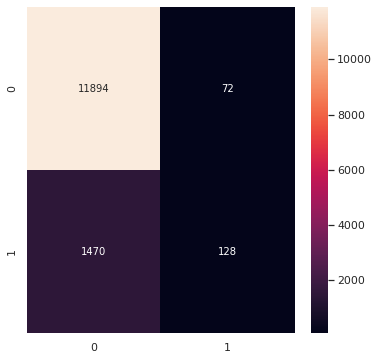

True negative =  11894
False negative =  72
False positive =  1470
True positive =  128
                                                                                                    
                                                                                                    


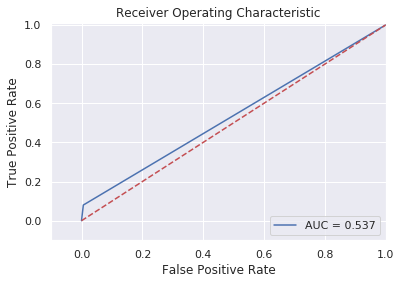

                                                                                                    
auc: 0.5370415384264594


In [0]:
from sklearn.metrics import roc_curve, auc
print_confusion_matrix(y_test, predicted_labels)


In [0]:
target_names = ['class 0', 'class 1']
print(" "*100)
print("classification report for test data:")
print(classification_report(y_test, predicted_labels, target_names=target_names))

                                                                                                    
classification report for test data:
              precision    recall  f1-score   support

     class 0       0.89      0.99      0.94     11966
     class 1       0.64      0.08      0.14      1598

    accuracy                           0.89     13564
   macro avg       0.77      0.54      0.54     13564
weighted avg       0.86      0.89      0.85     13564



# 6.2 Machine Learning Models After Upsampling ( LABEL ENCODED FOR CATEGORICAL VARIABLES)

# 6.2.0 UPSAMPLING

In [0]:
# Separate majority and minority classes
data_majority = data[data['Target']==0]
data_minority = data[data['Target']==1]
 
# Upsample minority class
data_minority_upsampled = resample(data_minority, 
                                 replace=True,     # sample with replacement
                                 n_samples=39922,    # to match majority class
                                 random_state=123) # reproducible results
 
# Combine majority class with upsampled minority class
data_upsampled = pd.concat([data_majority, data_minority_upsampled])
 
# Display new class counts
data_upsampled['Target'].value_counts()

1    39922
0    39922
Name: Target, dtype: int64

In [0]:
#Normalizing the data
cols_to_norm = ['age','balance','duration']
data_upsampled[cols_to_norm]=data_upsampled[cols_to_norm].apply(lambda x: (x - x.min()) / (x.max() - x.min()))

In [0]:
X = data_upsampled.drop(['Target'],axis=1)     # Predictor feature columns 
Y = data_upsampled['Target']   # Predicted class 

In [0]:
#splitting the dataa
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=1)
# 1 is just any random seed number
x_train.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome
9282,0.259740,8,2,2,0,0.086630,1,0,2,5,6,0.003457,16,-1,0,3
31078,0.220779,8,2,1,0,0.074510,1,0,0,16,3,0.015250,3,200,5,0
15722,0.467532,9,0,1,0,0.080602,0,1,0,21,5,0.144368,1,-1,0,3
38949,0.506494,0,1,1,0,0.076462,1,0,0,18,8,0.122611,1,340,2,1
40987,0.753247,5,1,0,0,0.102981,0,0,0,13,1,0.046157,2,192,1,0


# 6.2.1 KNN

In [0]:
leaf_size = [30,40]
n_neighbors = [1,5,21,51,101]
#Power parameter for the Minkowski metric ----p
p=[1,2]
#Convert to dictionary
hyperparameters = dict(leaf_size=leaf_size, n_neighbors=n_neighbors, p=p)
#Create new KNN object
knn = KNeighborsClassifier()
#Use GridSearch
clf = GridSearchCV(knn, hyperparameters, cv=3)
#Fit the model
model = clf.fit(x_train,y_train)
print('Best leaf_size:', model.best_estimator_.get_params()['leaf_size'])
print('Best p:', model.best_estimator_.get_params()['p'])
print('Best n_neighbors:', model.best_estimator_.get_params()['n_neighbors'])

Best leaf_size: 30
Best p: 1
Best n_neighbors: 1


# Fitting with the best Parameters

In [0]:
k=model.best_estimator_.get_params()['n_neighbors']
l=model.best_estimator_.get_params()['leaf_size']
P=model.best_estimator_.get_params()['p']
knn=KNeighborsClassifier(n_neighbors=P,leaf_size=l,p=P)
knn.fit(x_train,y_train)
predicted_labels = knn.predict(x_test)
knn.score(x_test, y_test)
print("Accuracy: ",knn.score(x_test, y_test))
print(" "*100)


Accuracy:  0.9563329715287635
                                                                                                    


Confusion Matrix
[[10972  1020]
 [   26 11936]]


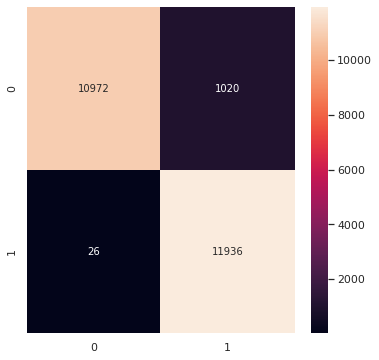

True negative =  10972
False negative =  1020
False positive =  26
True positive =  11936
                                                                                                    
                                                                                                    


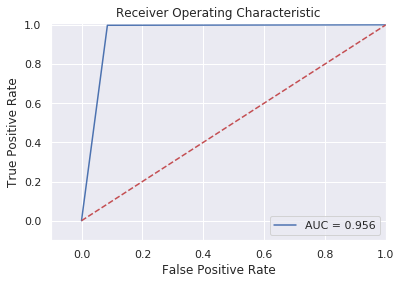

                                                                                                    
auc: 0.9563848729783518


In [0]:
print_confusion_matrix(y_test, predicted_labels)


In [0]:
target_names = ['class 0', 'class 1']
print(" "*100)
print("classification report for test data:")
print(classification_report(y_test, predicted_labels, target_names=target_names))

                                                                                                    
classification report for test data:
              precision    recall  f1-score   support

     class 0       1.00      0.91      0.95     11992
     class 1       0.92      1.00      0.96     11962

    accuracy                           0.96     23954
   macro avg       0.96      0.96      0.96     23954
weighted avg       0.96      0.96      0.96     23954



# 6.2.2 Logistic Regression

In [0]:
C=[0.01, 0.1, 1, 5,10, 20, 30]
penalty=['l2','l1']
hyperparameters=dict(C=C, penalty=penalty)
lr=LogisticRegression()
clf = GridSearchCV(lr, hyperparameters, cv=3, verbose=0)
best_model=clf.fit(x_train,y_train)
# View best hyperparameters
print('Best Penalty:', best_model.best_estimator_.get_params()['penalty'])
print('Best C:', best_model.best_estimator_.get_params()['C'])
best_penalty=best_model.best_estimator_.get_params()['penalty']
best_c=best_model.best_estimator_.get_params()['C']

Best Penalty: l2
Best C: 20


# Fitting with the best Parameters

In [0]:
lr=LogisticRegression(C=best_c,penalty=best_penalty)
lr.fit(x_train,y_train)

predicted_labels = lr.predict(x_test)
lr.score(x_test, y_test)
print("Accuracy: ",lr.score(x_test, y_test))
print(" "*100)


Accuracy:  0.6787592886365534
                                                                                                    


Confusion Matrix
[[8361 3631]
 [4064 7898]]


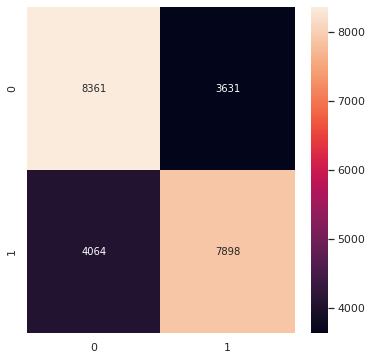

True negative =  8361
False negative =  3631
False positive =  4064
True positive =  7898
                                                                                                    
                                                                                                    


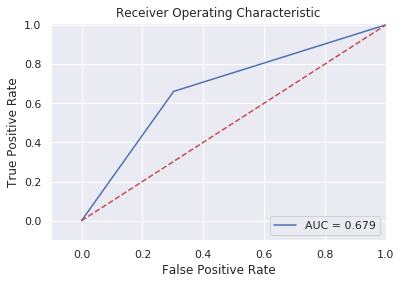

                                                                                                    
auc: 0.678736145949833


In [0]:
print_confusion_matrix(y_test, predicted_labels)


In [0]:
target_names = ['class 0', 'class 1']
print(" "*100)
print("classification report for test data:")
print(classification_report(y_test, predicted_labels, target_names=target_names))

                                                                                                    
classification report for test data:
              precision    recall  f1-score   support

     class 0       0.67      0.70      0.68     11992
     class 1       0.69      0.66      0.67     11962

    accuracy                           0.68     23954
   macro avg       0.68      0.68      0.68     23954
weighted avg       0.68      0.68      0.68     23954



# 6.2.3 Naive Bayes

In [0]:
gnb = GaussianNB()
gnb.fit(x_train,y_train)
predicted_labels=gnb.predict(x_test)
print("Accuracy: ",gnb.score(x_test, y_test))
print(" "*100)
print("Number of mislabeled points out of a total %d points : %d"
       % (x_test.shape[0], (y_test != predicted_labels).sum()))
print(" "*100)


Accuracy:  0.749311179761209
                                                                                                    
Number of mislabeled points out of a total 23954 points : 6005
                                                                                                    


Confusion Matrix
[[8004 3988]
 [2017 9945]]


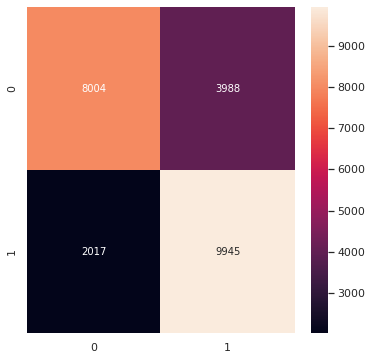

True negative =  8004
False negative =  3988
False positive =  2017
True positive =  9945
                                                                                                    
                                                                                                    


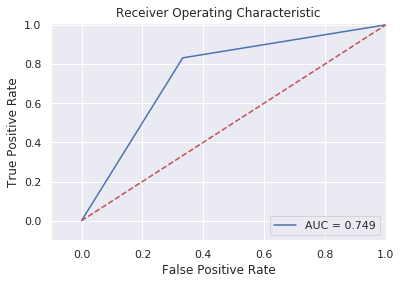

                                                                                                    
auc: 0.749413837614978


In [0]:
print_confusion_matrix(y_test, predicted_labels)


In [0]:
target_names = ['class 0', 'class 1']
print(" "*100)
print("classification report for test data:")
print(classification_report(y_test, predicted_labels, target_names=target_names))

                                                                                                    
classification report for test data:
              precision    recall  f1-score   support

     class 0       0.80      0.67      0.73     11992
     class 1       0.71      0.83      0.77     11962

    accuracy                           0.75     23954
   macro avg       0.76      0.75      0.75     23954
weighted avg       0.76      0.75      0.75     23954



# 6.2.4 SVM

In [0]:
from sklearn.svm import SVC
# defining parameter range 
param_grid = {'C': [0.01, 0.1, 1],  
              'gamma': [10, 1, 0.1], 
              'kernel': ['rbf']}  
  
grid = GridSearchCV(SVC(), param_grid, cv=3, verbose = 3) 
  
# fitting the model for grid search 
best_model=grid.fit(x_train, y_train) 

# View best hyperparameters
print('Best gamma:', best_model.best_estimator_.get_params()['gamma'])
print('Best C:', best_model.best_estimator_.get_params()['C'])
print('Best kernel:', best_model.best_estimator_.get_params()['kernel'])
best_gamma=best_model.best_estimator_.get_params()['gamma']
best_c=best_model.best_estimator_.get_params()['C']
best_kernel=best_model.best_estimator_.get_params()['kernel']
print("Best Score:", best_model.best_score_)

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV] C=0.01, gamma=10, kernel=rbf ....................................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] ........ C=0.01, gamma=10, kernel=rbf, score=0.500, total= 1.8min
[CV] C=0.01, gamma=10, kernel=rbf ....................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:  1.8min remaining:    0.0s


[CV] ........ C=0.01, gamma=10, kernel=rbf, score=0.500, total= 1.8min
[CV] C=0.01, gamma=10, kernel=rbf ....................................


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:  3.6min remaining:    0.0s


[CV] ........ C=0.01, gamma=10, kernel=rbf, score=0.500, total= 1.8min
[CV] C=0.01, gamma=1, kernel=rbf .....................................
[CV] ......... C=0.01, gamma=1, kernel=rbf, score=0.500, total= 2.1min
[CV] C=0.01, gamma=1, kernel=rbf .....................................
[CV] ......... C=0.01, gamma=1, kernel=rbf, score=0.500, total= 2.1min
[CV] C=0.01, gamma=1, kernel=rbf .....................................
[CV] ......... C=0.01, gamma=1, kernel=rbf, score=0.500, total= 2.1min
[CV] C=0.01, gamma=0.1, kernel=rbf ...................................
[CV] ....... C=0.01, gamma=0.1, kernel=rbf, score=0.627, total= 2.1min
[CV] C=0.01, gamma=0.1, kernel=rbf ...................................
[CV] ....... C=0.01, gamma=0.1, kernel=rbf, score=0.620, total= 2.1min
[CV] C=0.01, gamma=0.1, kernel=rbf ...................................
[CV] ....... C=0.01, gamma=0.1, kernel=rbf, score=0.619, total= 2.1min
[CV] C=0.1, gamma=10, kernel=rbf .....................................
[CV] .

[Parallel(n_jobs=1)]: Done  27 out of  27 | elapsed: 62.9min finished


Best gamma: 10
Best C: 1
Best kernel: rbf
Best Score: 0.9565933082841296


# Fitting with the best Parameters

In [0]:
svm=SVC(C=best_c,gamma=best_gamma,kernel=best_kernel)
svm.fit(x_train,y_train)
predicted_labels = svm.predict(x_test)
print("Accuracy: ",svm.score(x_test, y_test))
print(" "*100)
from sklearn.metrics import roc_curve, auc

Accuracy:  0.9730316439843032
                                                                                                    


Confusion Matrix
[[11546   446]
 [  200 11762]]


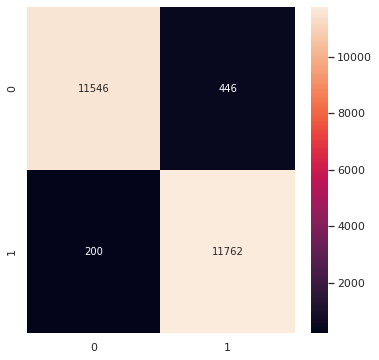

True negative =  11546
False negative =  446
False positive =  200
True positive =  11762
                                                                                                    
                                                                                                    


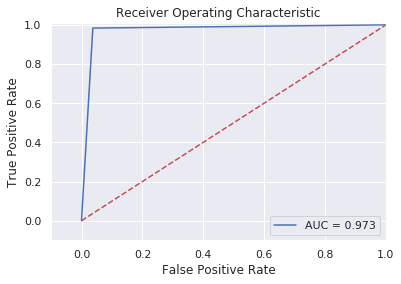

                                                                                                    
auc: 0.973044463460509


In [0]:
print_confusion_matrix(y_test, predicted_labels)

In [0]:
target_names = ['class 0', 'class 1']
print(" "*100)
print("classification report for test data:")
print(classification_report(y_test, predicted_labels, target_names=target_names))

                                                                                                    
classification report for test data:
              precision    recall  f1-score   support

     class 0       0.98      0.96      0.97     11992
     class 1       0.96      0.98      0.97     11962

    accuracy                           0.97     23954
   macro avg       0.97      0.97      0.97     23954
weighted avg       0.97      0.97      0.97     23954



# 7. ENSEMBLE MODELS

# 7.1 ENSEMBLE MODELS BEFORE UPSAMPLING

In [0]:
#reading data 
data=pd.read_csv('/content/bank-full.csv')
cat=['job','marital','education','default','housing','loan','contact','month','poutcome','Target']
# Import label encoder 
from sklearn import preprocessing 
  
# label_encoder object knows how to understand word labels. 
label_encoder = preprocessing.LabelEncoder() 
for i in cat:
    # Encode labels for categorical variables. 
    data[i]= label_encoder.fit_transform(data[i]) 
#Normalizing the data
cols_to_norm = ['age','balance','duration']
data[cols_to_norm]=data[cols_to_norm].apply(lambda x: (x - x.min()) / (x.max() - x.min()))
X = data.drop(['Target'],axis=1)     # Predictor feature columns 
Y = data['Target']   # Predicted class
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=42)
# 1 is just any random seed number

# 7.1.1 Decision Tree Model

In [0]:
from sklearn.tree import DecisionTreeClassifier
dTree = DecisionTreeClassifier(criterion = 'gini', max_depth=12, random_state=1)
dTree.fit(x_train, y_train)
print("train score",dTree.score(x_train, y_train))
print("Test Score",dTree.score(x_test, y_test))

train score 0.9459664423168073
Test Score 0.8945001474491301


**Visualizing the tree**

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.416438 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.416438 to fit



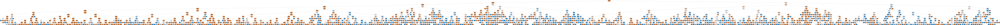

In [0]:
train_char_label = ['No', 'Yes']

dot_data = StringIO()
export_graphviz(dTree, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = list(x_train),class_names=train_char_label)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('tree.png')
Image(graph.create_png())

In [0]:
from sklearn.metrics import accuracy_score
preds_pruned = dTree.predict(x_test)
preds_pruned_train = dTree.predict(x_train)

In [0]:
print("Accuracy test Score",accuracy_score(y_test,preds_pruned))
print("Accuracy train Score",accuracy_score(y_train,preds_pruned_train))

Accuracy test Score 0.8945001474491301
Accuracy train Score 0.9459664423168073


In [0]:
acc_DT = accuracy_score(y_test, preds_pruned)
#Store the accuracy results for each model in a dataframe for final comparison
resultsDf = pd.DataFrame({'Method':['Decision Tree'], 'accuracy': acc_DT})
resultsDf = resultsDf[['Method', 'accuracy']]
resultsDf

,Method,accuracy
0,Decision Tree,0.8945


# Reducing over fitting (Regularization)

In [0]:
dTreeR = DecisionTreeClassifier(criterion = 'gini', max_depth = 3, random_state=1)
dTreeR.fit(x_train, y_train)
print("Train Score",dTreeR.score(x_train, y_train))
print("Test Score",dTreeR.score(x_test, y_test))

Train Score 0.8928176446424622
Test Score 0.8872014155116484


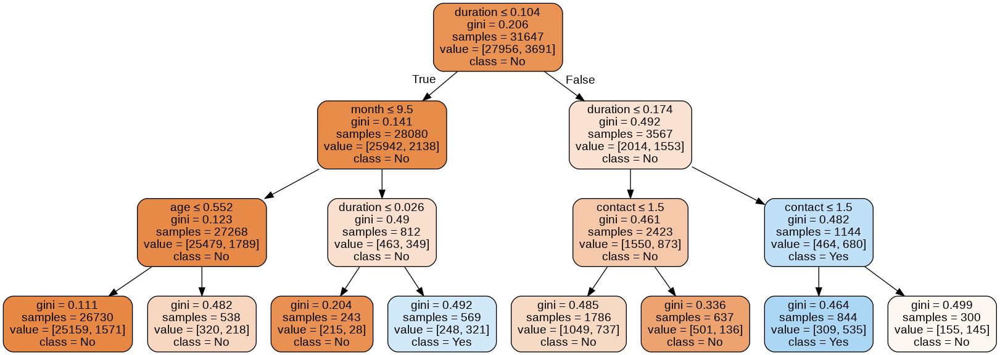

In [0]:
train_char_label = ['No', 'Yes']

dot_dat = StringIO()
export_graphviz(dTreeR, out_file=dot_dat,  
                filled=True, rounded=True,
                special_characters=True,feature_names = list(x_train),class_names=train_char_label)
graph = pydotplus.graph_from_dot_data(dot_dat.getvalue())  
graph.write_png('treeR.png')
Image(graph.create_png())

In [0]:
# importance of features in the tree building ( The importance of a feature is computed as the 
#(normalized) total reduction of the criterion brought by that feature. It is also known as the Gini importance )

print (pd.DataFrame(dTreeR.feature_importances_, columns = ["Imp"], index = x_train.columns))

                Imp
age        0.093509
job        0.000000
marital    0.000000
education  0.000000
default    0.000000
balance    0.000000
housing    0.000000
loan       0.000000
contact    0.034924
day        0.000000
month      0.154515
duration   0.717052
campaign   0.000000
pdays      0.000000
previous   0.000000
poutcome   0.000000


In [0]:
print(dTreeR.score(x_test , y_test))
y_predict = dTreeR.predict(x_test)

0.8872014155116484


Confusion Matrix
[[11705   261]
 [ 1269   329]]


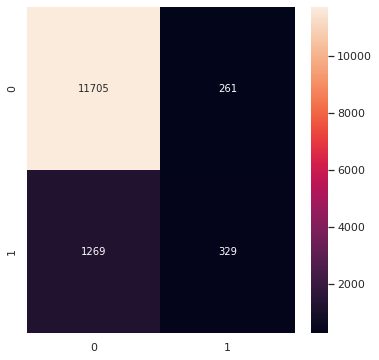

True negative =  11705
False negative =  261
False positive =  1269
True positive =  329
                                                                                                    
                                                                                                    


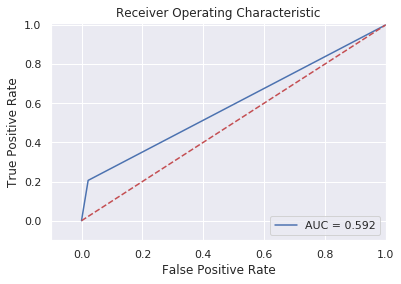

                                                                                                    
auc: 0.5920352764204461


In [0]:
print_confusion_matrix(y_test, y_predict)

In [0]:
target_names = ['class 0', 'class 1']
print(" "*100)
print("classification report for test data:")
print(classification_report(y_test, y_predict, target_names=target_names))

                                                                                                    
classification report for test data:
              precision    recall  f1-score   support

     class 0       0.90      0.98      0.94     11966
     class 1       0.56      0.21      0.30      1598

    accuracy                           0.89     13564
   macro avg       0.73      0.59      0.62     13564
weighted avg       0.86      0.89      0.86     13564



#                             7.1.2 Ensemble Learning - Bagging

In [0]:
from sklearn.ensemble import BaggingClassifier

bgcl = BaggingClassifier(base_estimator=dTree, n_estimators=50,random_state=1)
#bgcl = BaggingClassifier(n_estimators=50,random_state=1)

bgcl = bgcl.fit(x_train, y_train)


In [0]:
y_predict = bgcl.predict(x_test)
acc_BG = accuracy_score(y_test, y_predict)
print("Test Score: ",bgcl.score(x_test , y_test))

Test Score:  0.9024624004718372


Confusion Matrix
[[11533   433]
 [  890   708]]


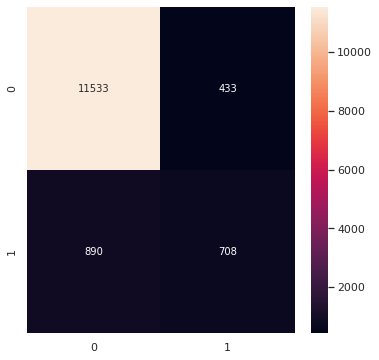

True negative =  11533
False negative =  433
False positive =  890
True positive =  708
                                                                                                    
                                                                                                    


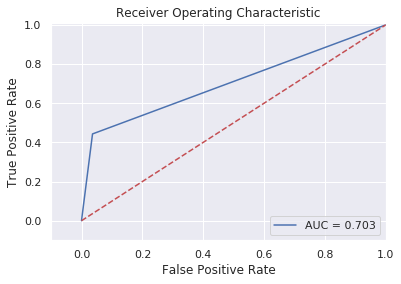

                                                                                                    
auc: 0.7034339786675513


In [0]:
print_confusion_matrix(y_test, y_predict)

In [0]:
target_names = ['class 0', 'class 1']
print(" "*100)
print("classification report for test data:")
print(classification_report(y_test, y_predict, target_names=target_names))

                                                                                                    
classification report for test data:
              precision    recall  f1-score   support

     class 0       0.93      0.96      0.95     11966
     class 1       0.62      0.44      0.52      1598

    accuracy                           0.90     13564
   macro avg       0.77      0.70      0.73     13564
weighted avg       0.89      0.90      0.90     13564



In [0]:
tempResultsDf = pd.DataFrame({'Method':['Bagging'], 'accuracy': [acc_BG]})
resultsDf = pd.concat([resultsDf, tempResultsDf])
resultsDf = resultsDf[['Method', 'accuracy']]
resultsDf
resultsDf

,Method,accuracy
0,Decision Tree,0.894500
0,Bagging,0.902462


# 7.1.3 Ensemble Learning - AdaBoosting

In [0]:
from sklearn.ensemble import AdaBoostClassifier
abcl = AdaBoostClassifier(n_estimators=10, random_state=1)
#abcl = AdaBoostClassifier( n_estimators=50,random_state=1)
abcl = abcl.fit(x_train, y_train)


In [0]:
y_predict = abcl.predict(x_test)
acc_AB = accuracy_score(y_test, y_predict)
print("Test Score: ",abcl.score(x_test , y_test))


Test Score:  0.8879386611618991


Confusion Matrix
[[11560   406]
 [ 1114   484]]


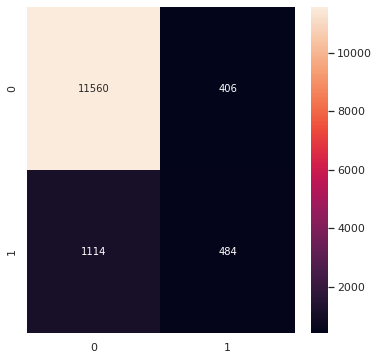

True negative =  11560
False negative =  406
False positive =  1114
True positive =  484
                                                                                                    
                                                                                                    


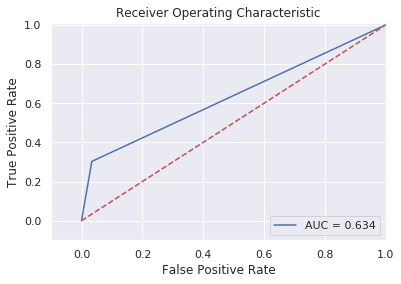

                                                                                                    
auc: 0.6344745657125728


In [0]:
print_confusion_matrix(y_test, y_predict)

In [0]:
target_names = ['class 0', 'class 1']
print(" "*100)
print("classification report for test data:")
print(classification_report(y_test, y_predict, target_names=target_names))

                                                                                                    
classification report for test data:
              precision    recall  f1-score   support

     class 0       0.91      0.97      0.94     11966
     class 1       0.54      0.30      0.39      1598

    accuracy                           0.89     13564
   macro avg       0.73      0.63      0.66     13564
weighted avg       0.87      0.89      0.87     13564



In [0]:
tempResultsDf = pd.DataFrame({'Method':['Adaboost'], 'accuracy': [acc_AB]})
resultsDf = pd.concat([resultsDf, tempResultsDf])
resultsDf = resultsDf[['Method', 'accuracy']]
resultsDf
resultsDf

,Method,accuracy
0,Decision Tree,0.894500
0,Bagging,0.902462
0,Adaboost,0.887939


# 7.1.4 Ensemble Learning - Random Forest

In [0]:
from sklearn.ensemble import RandomForestClassifier
rfcl = RandomForestClassifier(n_estimators = 50)
rfcl = rfcl.fit(x_train, y_train)

In [0]:
y_predict = rfcl.predict(x_test)
acc_RF = accuracy_score(y_test, y_predict)
print(rfcl.score(x_test, y_test))

0.903273370687113


Confusion Matrix
[[11587   379]
 [  933   665]]


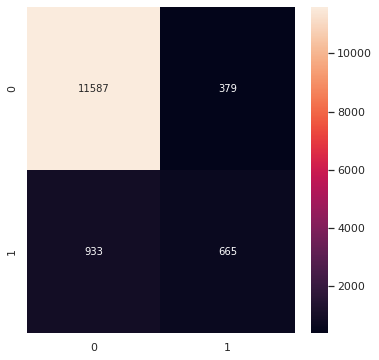

True negative =  11587
False negative =  379
False positive =  933
True positive =  665
                                                                                                    
                                                                                                    


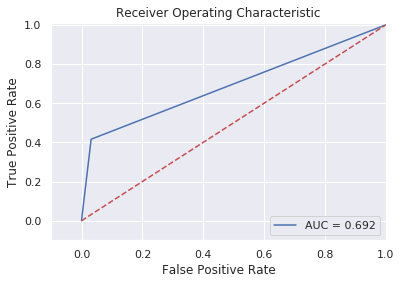

                                                                                                    
auc: 0.6922360538840021


In [0]:
print_confusion_matrix(y_test, y_predict)

In [0]:
target_names = ['class 0', 'class 1']
print(" "*100)
print("classification report for test data:")
print(classification_report(y_test, y_predict, target_names=target_names))

                                                                                                    
classification report for test data:
              precision    recall  f1-score   support

     class 0       0.93      0.97      0.95     11966
     class 1       0.64      0.42      0.50      1598

    accuracy                           0.90     13564
   macro avg       0.78      0.69      0.72     13564
weighted avg       0.89      0.90      0.89     13564



In [0]:
tempResultsDf = pd.DataFrame({'Method':['Random Forest'], 'accuracy': [acc_RF]})
resultsDf = pd.concat([resultsDf, tempResultsDf])
resultsDf = resultsDf[['Method', 'accuracy']]
resultsDf
resultsDf

,Method,accuracy
0,Decision Tree,0.894500
0,Bagging,0.902462
0,Adaboost,0.887939
0,Random Forest,0.903273


# 7.1.5 Ensemble Learning - Gradient boost Classifier

In [0]:
from sklearn.ensemble import GradientBoostingClassifier
gbcl = GradientBoostingClassifier(n_estimators = 50, learning_rate = 0.1, random_state=22)
gbcl = gbcl.fit(x_train, y_train)

In [0]:
y_predict = rfcl.predict(x_test)
acc_GB = accuracy_score(y_test, y_predict)
print(rfcl.score(x_test, y_test))


0.903273370687113


Confusion Matrix
[[11587   379]
 [  933   665]]


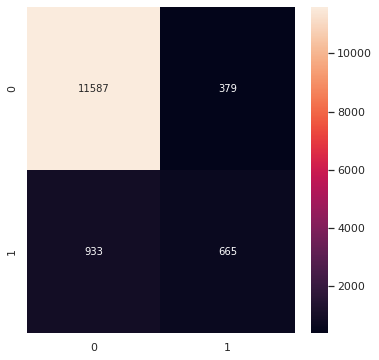

True negative =  11587
False negative =  379
False positive =  933
True positive =  665
                                                                                                    
                                                                                                    


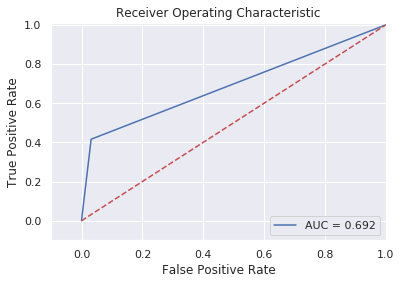

                                                                                                    
auc: 0.6922360538840021


In [0]:
print_confusion_matrix(y_test, y_predict)

In [0]:
target_names = ['class 0', 'class 1']
print(" "*100)
print("classification report for test data:")
print(classification_report(y_test, y_predict, target_names=target_names))

                                                                                                    
classification report for test data:
              precision    recall  f1-score   support

     class 0       0.93      0.97      0.95     11966
     class 1       0.64      0.42      0.50      1598

    accuracy                           0.90     13564
   macro avg       0.78      0.69      0.72     13564
weighted avg       0.89      0.90      0.89     13564



In [0]:
tempResultsDf = pd.DataFrame({'Method':['Gradient Boost'], 'accuracy': [acc_GB]})
resultsDf = pd.concat([resultsDf, tempResultsDf])
resultsDf = resultsDf[['Method', 'accuracy']]
resultsDf
resultsDf

,Method,accuracy
0,Decision Tree,0.894500
0,Bagging,0.902462
0,Adaboost,0.887939
0,Random Forest,0.903273
0,Gradient Boost,0.903273


# 7.2 ENSEMBLE MODELS AFTER UPSAMPLING

In [0]:
# Separate majority and minority classes
data_majority = data[data['Target']==0]
data_minority = data[data['Target']==1]
 
# Upsample minority class
data_minority_upsampled = resample(data_minority, 
                                 replace=True,     # sample with replacement
                                 n_samples=39922,    # to match majority class
                                 random_state=123) # reproducible results
 
# Combine majority class with upsampled minority class
data_upsampled = pd.concat([data_majority, data_minority_upsampled])
 
# Display new class counts
data_upsampled['Target'].value_counts()

1    39922
0    39922
Name: Target, dtype: int64

In [0]:
#Normalizing the data
cols_to_norm = ['age','balance','duration']
data_upsampled[cols_to_norm]=data_upsampled[cols_to_norm].apply(lambda x: (x - x.min()) / (x.max() - x.min()))

In [0]:
X = data_upsampled.drop(['Target'],axis=1)     # Predictor feature columns 
Y = data_upsampled['Target']   # Predicted class 

In [0]:
#splitting the dataa
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=1)
# 1 is just any random seed number
x_train.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome
9282,0.259740,8,2,2,0,0.086630,1,0,2,5,6,0.003457,16,-1,0,3
31078,0.220779,8,2,1,0,0.074510,1,0,0,16,3,0.015250,3,200,5,0
15722,0.467532,9,0,1,0,0.080602,0,1,0,21,5,0.144368,1,-1,0,3
38949,0.506494,0,1,1,0,0.076462,1,0,0,18,8,0.122611,1,340,2,1
40987,0.753247,5,1,0,0,0.102981,0,0,0,13,1,0.046157,2,192,1,0


# 7.2.1 Decision Tree Model

In [0]:
from sklearn.tree import DecisionTreeClassifier
dTree = DecisionTreeClassifier(criterion = 'gini', max_depth=12, random_state=1)
dTree.fit(x_train, y_train)
print("train score",dTree.score(x_train, y_train))
print("Test Score",dTree.score(x_test, y_test))

train score 0.9029880121667562
Test Score 0.887951907823328


**Visualizing the tree**

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.39865 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.39865 to fit



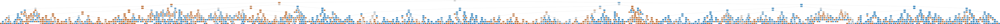

In [0]:
train_char_label = ['No', 'Yes']

dot_data = StringIO()
export_graphviz(dTree, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = list(x_train),class_names=train_char_label)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('tree.png')
Image(graph.create_png())

In [0]:
from sklearn.metrics import accuracy_score
preds_pruned = dTree.predict(x_test)
preds_pruned_train = dTree.predict(x_train)

In [0]:
print("Accuracy test Score",accuracy_score(y_test,preds_pruned))
print("Accuracy train Score",accuracy_score(y_train,preds_pruned_train))

Accuracy test Score 0.887951907823328
Accuracy train Score 0.9029880121667562


In [0]:
acc_DT = accuracy_score(y_test, preds_pruned)
#Store the accuracy results for each model in a dataframe for final comparison
resultsD = pd.DataFrame({'Method':['Decision Tree'], 'accuracy': acc_DT})
resultsD = resultsD[['Method', 'accuracy']]
resultsD

,Method,accuracy
0,Decision Tree,0.887952


# Reducing over fitting (Regularization)

In [0]:
dTreeR = DecisionTreeClassifier(criterion = 'gini', max_depth = 3, random_state=1)
dTreeR.fit(x_train, y_train)
print("Train Score",dTreeR.score(x_train, y_train))
print("Test Score",dTreeR.score(x_test, y_test))

Train Score 0.783700125246019
Test Score 0.7875093930032563


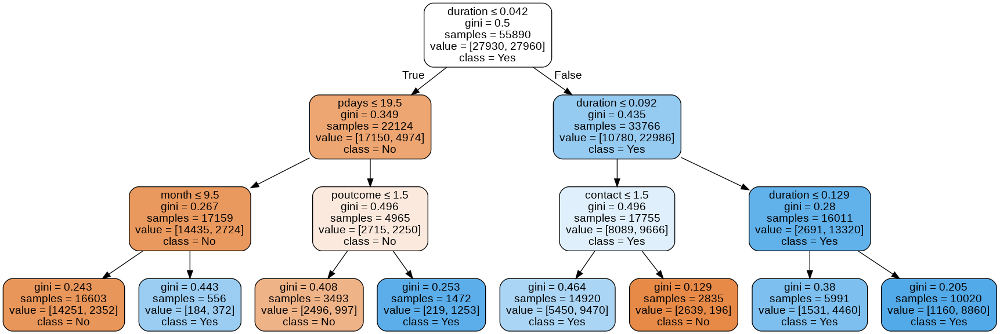

In [0]:
train_char_label = ['No', 'Yes']

dot_dat = StringIO()
export_graphviz(dTreeR, out_file=dot_dat,  
                filled=True, rounded=True,
                special_characters=True,feature_names = list(x_train),class_names=train_char_label)
graph = pydotplus.graph_from_dot_data(dot_dat.getvalue())  
graph.write_png('treeR.png')
Image(graph.create_png())

In [0]:
# importance of features in the tree building ( The importance of a feature is computed as the 
#(normalized) total reduction of the criterion brought by that feature. It is also known as the Gini importance )

print (pd.DataFrame(dTreeR.feature_importances_, columns = ["Imp"], index = x_train.columns))

                Imp
age        0.000000
job        0.000000
marital    0.000000
education  0.000000
default    0.000000
balance    0.000000
housing    0.000000
loan       0.000000
contact    0.148708
day        0.000000
month      0.029201
duration   0.692263
campaign   0.000000
pdays      0.065137
previous   0.000000
poutcome   0.064691


In [0]:
print(dTreeR.score(x_test , y_test))
y_predict = dTreeR.predict(x_test)

0.7875093930032563


Confusion Matrix
[[ 8386  3606]
 [ 1484 10478]]


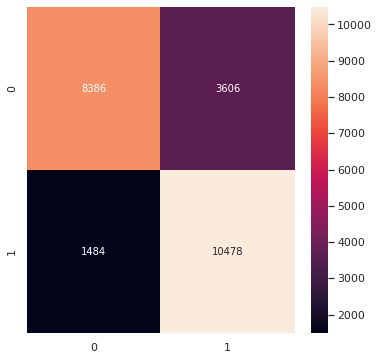

True negative =  8386
False negative =  3606
False positive =  1484
True positive =  10478
                                                                                                    
                                                                                                    


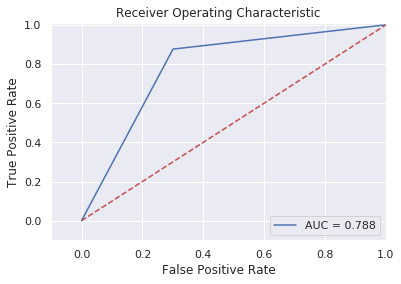

                                                                                                    
auc: 0.7876200056014604


In [0]:
print_confusion_matrix(y_test,y_predict)

In [0]:
target_names = ['class 0', 'class 1']
print(" "*100)
print("classification report for test data:")
print(classification_report(y_test, y_predict, target_names=target_names))

                                                                                                    
classification report for test data:
              precision    recall  f1-score   support

     class 0       0.85      0.70      0.77     11992
     class 1       0.74      0.88      0.80     11962

    accuracy                           0.79     23954
   macro avg       0.80      0.79      0.79     23954
weighted avg       0.80      0.79      0.79     23954



#                             7.2.2 Ensemble Learning - Bagging

In [0]:
from sklearn.ensemble import BaggingClassifier

bgcl = BaggingClassifier(base_estimator=dTree, n_estimators=50,random_state=1)
#bgcl = BaggingClassifier(n_estimators=50,random_state=1)

bgcl = bgcl.fit(x_train, y_train)


In [0]:
y_predict = bgcl.predict(x_test)
acc_BG = accuracy_score(y_test, y_predict)
print("Test Score: ",bgcl.score(x_test , y_test))

Test Score:  0.9086165149870585


Confusion Matrix
[[10511  1481]
 [  708 11254]]


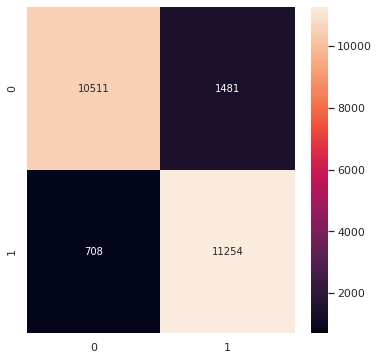

True negative =  10511
False negative =  1481
False positive =  708
True positive =  11254
                                                                                                    
                                                                                                    


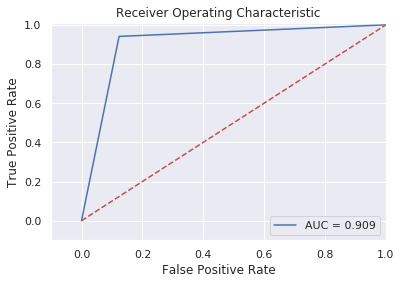

                                                                                                    
auc: 0.9086567869077071


In [0]:
print_confusion_matrix(y_test,y_predict)

In [0]:
target_names = ['class 0', 'class 1']
print(" "*100)
print("classification report for test data:")
print(classification_report(y_test, y_predict, target_names=target_names))

                                                                                                    
classification report for test data:
              precision    recall  f1-score   support

     class 0       0.94      0.88      0.91     11992
     class 1       0.88      0.94      0.91     11962

    accuracy                           0.91     23954
   macro avg       0.91      0.91      0.91     23954
weighted avg       0.91      0.91      0.91     23954



In [0]:
tempResultsDf = pd.DataFrame({'Method':['Bagging'], 'accuracy': [acc_BG]})
resultsD = pd.concat([resultsD, tempResultsDf])
resultsD = resultsD[['Method', 'accuracy']]
resultsD
resultsD

,Method,accuracy
0,Decision Tree,0.887952
0,Bagging,0.908617


# 7.2.3 Ensemble Learning - AdaBoosting

In [0]:
from sklearn.ensemble import AdaBoostClassifier
abcl = AdaBoostClassifier(n_estimators=10, random_state=1)
#abcl = AdaBoostClassifier( n_estimators=50,random_state=1)
abcl = abcl.fit(x_train, y_train)


In [0]:
y_predict = abcl.predict(x_test)
acc_AB = accuracy_score(y_test, y_predict)
print("Test Score: ",abcl.score(x_test , y_test))


Test Score:  0.7875093930032563


Confusion Matrix
[[9369 2623]
 [2467 9495]]


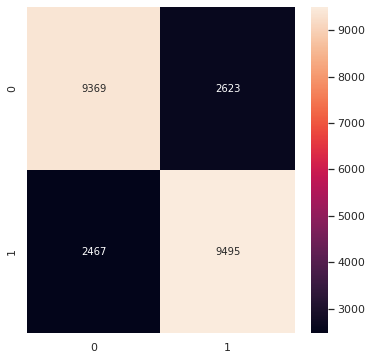

True negative =  9369
False negative =  2623
False positive =  2467
True positive =  9495
                                                                                                    
                                                                                                    


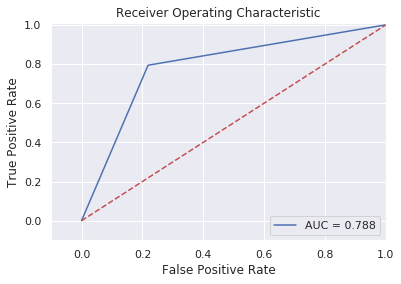

                                                                                                    
auc: 0.7875172159581616


In [0]:
print_confusion_matrix(y_test,y_predict)

In [0]:
target_names = ['class 0', 'class 1']
print(" "*100)
print("classification report for test data:")
print(classification_report(y_test, y_predict, target_names=target_names))

                                                                                                    
classification report for test data:
              precision    recall  f1-score   support

     class 0       0.79      0.78      0.79     11992
     class 1       0.78      0.79      0.79     11962

    accuracy                           0.79     23954
   macro avg       0.79      0.79      0.79     23954
weighted avg       0.79      0.79      0.79     23954



In [0]:
tempResultsDf = pd.DataFrame({'Method':['Adaboost'], 'accuracy': [acc_AB]})
resultsD = pd.concat([resultsD, tempResultsDf])
resultsD = resultsD[['Method', 'accuracy']]
resultsD
resultsD

,Method,accuracy
0,Decision Tree,0.887952
0,Bagging,0.908617
0,Adaboost,0.787509


# 7.2.4 Ensemble Learning - Random Forest

In [0]:
from sklearn.ensemble import RandomForestClassifier
rfcl = RandomForestClassifier(n_estimators = 50)
rfcl = rfcl.fit(x_train, y_train)

In [0]:
y_predict = rfcl.predict(x_test)
acc_RF = accuracy_score(y_test, y_predict)
print(rfcl.score(x_test, y_test))

0.9682307756533356


Confusion Matrix
[[11243   749]
 [   12 11950]]


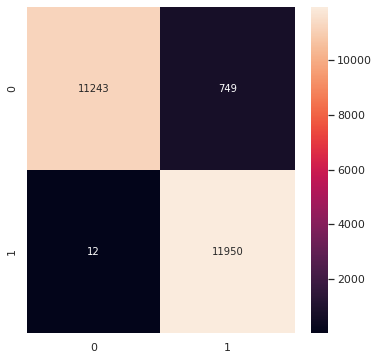

True negative =  11243
False negative =  749
False positive =  12
True positive =  11950
                                                                                                    
                                                                                                    


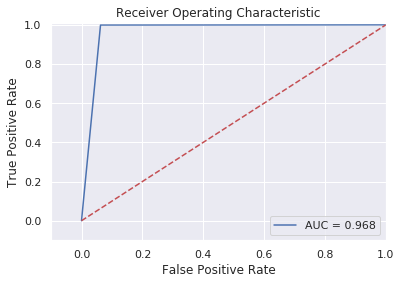

                                                                                                    
auc: 0.9682692588683377


In [0]:
print_confusion_matrix(y_test,y_predict)

In [0]:
target_names = ['class 0', 'class 1']
print(" "*100)
print("classification report for test data:")
print(classification_report(y_test, y_predict, target_names=target_names))

                                                                                                    
classification report for test data:
              precision    recall  f1-score   support

     class 0       1.00      0.94      0.97     11992
     class 1       0.94      1.00      0.97     11962

    accuracy                           0.97     23954
   macro avg       0.97      0.97      0.97     23954
weighted avg       0.97      0.97      0.97     23954



In [0]:
tempResultsDf = pd.DataFrame({'Method':['Random Forest'], 'accuracy': [acc_RF]})
resultsD = pd.concat([resultsD, tempResultsDf])
resultsD = resultsD[['Method', 'accuracy']]
resultsD
resultsD

,Method,accuracy
0,Decision Tree,0.887952
0,Bagging,0.908617
0,Adaboost,0.787509
0,Random Forest,0.968231


# 7.2.5 Ensemble Learning - Gradient boost Classifier

In [0]:
from sklearn.ensemble import GradientBoostingClassifier
gbcl = GradientBoostingClassifier(n_estimators = 50, learning_rate = 0.1, random_state=22)
gbcl = gbcl.fit(x_train, y_train)

In [0]:
y_predict = rfcl.predict(x_test)
acc_GB = accuracy_score(y_test, y_predict)
print(rfcl.score(x_test, y_test))

0.9682307756533356


Confusion Matrix
[[11243   749]
 [   12 11950]]


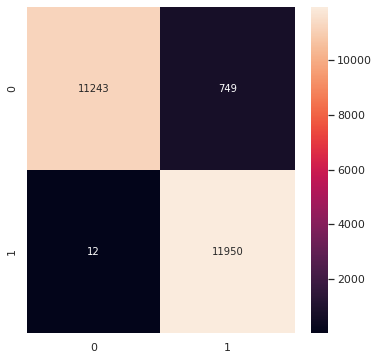

True negative =  11243
False negative =  749
False positive =  12
True positive =  11950
                                                                                                    
                                                                                                    


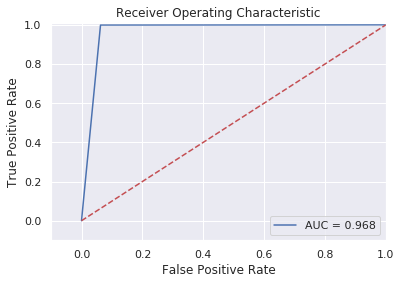

                                                                                                    
auc: 0.9682692588683377


In [0]:
print_confusion_matrix(y_test,y_predict)

In [0]:
target_names = ['class 0', 'class 1']
print(" "*100)
print("classification report for test data:")
print(classification_report(y_test, y_predict, target_names=target_names))

                                                                                                    
classification report for test data:
              precision    recall  f1-score   support

     class 0       1.00      0.94      0.97     11992
     class 1       0.94      1.00      0.97     11962

    accuracy                           0.97     23954
   macro avg       0.97      0.97      0.97     23954
weighted avg       0.97      0.97      0.97     23954



In [0]:
tempResultsDf = pd.DataFrame({'Method':['Gradient Boost'], 'accuracy': [acc_GB]})
resultsD = pd.concat([resultsD, tempResultsDf])
resultsD = resultsD[['Method', 'accuracy']]
resultsD
resultsD

,Method,accuracy
0,Decision Tree,0.887952
0,Bagging,0.908617
0,Adaboost,0.787509
0,Random Forest,0.968231
0,Gradient Boost,0.968231


# 10.0 Conclusions

In [17]:
from prettytable import PrettyTable

x = PrettyTable()
print("Label Encoding")
print("Before Upsampling")
x.field_names = ["Model", "Test Accuracy","Auc"]

x.add_row(["KNN", 0.86,0.622])
x.add_row(["Logistic REgression", 0.88,0.501])
x.add_row(["Naive Bayes", 0.827,0.674])
x.add_row(["SVM", 0.88,0.537])
print(x)
x = PrettyTable()
print("After Upsampling")
x.field_names = ["Model", "Test Accuracy","Auc"]

x.add_row(["KNN", 0.95,0.956])
x.add_row(["Logistic REgression", 0.67,0.679])
x.add_row(["Naive Bayes", 0.74,0.749])
x.add_row(["SVM", 0.97,0.973])
print(x)



print("Ensemble Models - Before Upsampling")
x.field_names = ["Model", "Test Accuracy","Auc"]

x.add_row(["Decesion Tree", 0.89,0.592])
x.add_row(["Bagging", 0.90,0.703])
x.add_row(["AdaBossting", 0.88,0.634])
x.add_row(["RandomForest", 0.90,0.692])
x.add_row(["Gradient Bossting Classifier",0.90,0.69])
print(x)
x = PrettyTable()
print("Ensemble Models - After Upsampling")
x.field_names = ["Model", "Test Accuracy","Auc"]
x.add_row(["Decesion Tree", 0.88, 0.788])
x.add_row(["Bagging", 0.908,0.909])
x.add_row(["AdaBossting", 0.78,0.788])
x.add_row(["RandomForest", 0.96,0.968])
x.add_row(["Gradient Bossting Classifier",0.96,0.968])
print(x)


Label Encoding
Before Upsampling
+---------------------+---------------+-------+
|        Model        | Test Accuracy |  Auc  |
+---------------------+---------------+-------+
|         KNN         |      0.86     | 0.622 |
| Logistic REgression |      0.88     | 0.501 |
|     Naive Bayes     |     0.827     | 0.674 |
|         SVM         |      0.88     | 0.537 |
+---------------------+---------------+-------+
After Upsampling
+---------------------+---------------+-------+
|        Model        | Test Accuracy |  Auc  |
+---------------------+---------------+-------+
|         KNN         |      0.95     | 0.956 |
| Logistic REgression |      0.67     | 0.679 |
|     Naive Bayes     |      0.74     | 0.749 |
|         SVM         |      0.97     | 0.973 |
+---------------------+---------------+-------+
Ensemble Models - Before Upsampling
+------------------------------+---------------+-------+
|            Model             | Test Accuracy |  Auc  |
+------------------------------+

Observation - Label Encoding

* KNN tend to overfit after upsampling as best k is 1
* SVM tend to be the better model when compared with others as it tend not to overfit 
* SVM has the highest auc when it is upsampled

* Random Forest and Gradient Bossting classifier gave the best accuracy after upsampling
* Most of the ensemble models before upsampling tend to have a very close accuracy
